# 必要的库

In [1]:
%pip install  tensorflow keras scikit-learn scipy statsmodels numpy matplotlib seaborn lmfit pandas

Note: you may need to restart the kernel to use updated packages.


In [2]:
from tensorflow import keras
from sklearn.neural_network import MLPRegressor
import tensorflow as tf
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score, mean_squared_error
from scipy.optimize import minimize
from scipy.optimize import curve_fit
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import itertools
from scipy.stats import mannwhitneyu
from scipy.stats import kendalltau
from scipy.stats import spearmanr
from scipy.stats import kruskal
from statsmodels.formula.api import ols
import statsmodels.api as sm
import scipy.stats as stats
from scipy import stats
import matplotlib.font_manager as fm
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from lmfit import Model, Parameters
import numpy as np
from scipy.stats import linregress
from numpy.polynomial.polynomial import polyfit
import pandas as pd
import warnings
warnings.filterwarnings('ignore')


# Question 1

#### 数据处理

In [3]:
path1 = '../附件1.xlsx'
path2 = '../附件2.xlsx'
data1=pd.read_excel(path1)
data2=pd.read_excel(path2)

display(data1.columns)
display(data2.columns)

display(data1, data2)


Index(['单品编码', '单品名称', '分类编码', '分类名称'], dtype='object')

Index(['销售日期', '扫码销售时间', '单品编码', '销量(千克)', '销售单价(元/千克)', '销售类型', '是否打折销售'], dtype='object')

,单品编码,单品名称,分类编码,分类名称
0,102900005115168,牛首生菜,1011010101,花叶类
1,102900005115199,四川红香椿,1011010101,花叶类
2,102900005115625,本地小毛白菜,1011010101,花叶类
3,102900005115748,白菜苔,1011010101,花叶类
4,102900005115762,苋菜,1011010101,花叶类
...,...,...,...,...
246,106958851400125,海鲜菇(袋)(4),1011010801,食用菌
247,106971533450003,海鲜菇(包),1011010801,食用菌
248,106971533455008,海鲜菇(袋)(3),1011010801,食用菌
249,106973223300667,虫草花(盒)(2),1011010801,食用菌


,销售日期,扫码销售时间,单品编码,销量(千克),销售单价(元/千克),销售类型,是否打折销售
0,2020-07-01,09:15:07.924,102900005117056,0.396,7.6,销售,否
1,2020-07-01,09:17:27.295,102900005115960,0.849,3.2,销售,否
2,2020-07-01,09:17:33.905,102900005117056,0.409,7.6,销售,否
3,2020-07-01,09:19:45.450,102900005115823,0.421,10.0,销售,否
4,2020-07-01,09:20:23.686,102900005115908,0.539,8.0,销售,否
...,...,...,...,...,...,...,...
878498,2023-06-30,21:35:13.264,102900005115250,0.284,24.0,销售,否
878499,2023-06-30,21:35:14.358,102900011022764,0.669,12.0,销售,否
878500,2023-06-30,21:35:20.264,102900005115250,0.125,24.0,销售,否
878501,2023-06-30,21:35:21.509,102900011016701,0.252,5.2,销售,否


In [4]:
merge_data = pd.merge(data1,data2,left_on='单品编码',right_on='单品编码',how='outer')
# 提取月份信息并创建新的列
merge_data['月份'] = merge_data['销售日期'].dt.month
# 重新命名含有特殊字符的列名
merge_data = merge_data.rename(columns={'销量(千克)': '销售量_千克'})
display(merge_data)

,单品编码,单品名称,分类编码,分类名称,销售日期,扫码销售时间,销售量_千克,销售单价(元/千克),销售类型,是否打折销售,月份
0,102900005115168,牛首生菜,1011010101,花叶类,2020-10-30,10:02:13.748,0.743,5.0,销售,否,10.0
1,102900005115168,牛首生菜,1011010101,花叶类,2020-10-30,10:48:42.707,0.502,5.0,销售,否,10.0
2,102900005115168,牛首生菜,1011010101,花叶类,2020-10-30,11:10:13.023,0.301,5.0,销售,否,10.0
3,102900005115168,牛首生菜,1011010101,花叶类,2020-10-30,12:34:32.084,0.382,5.0,销售,否,10.0
4,102900005115168,牛首生菜,1011010101,花叶类,2020-10-30,13:33:59.748,0.261,5.0,销售,否,10.0
...,...,...,...,...,...,...,...,...,...,...,...
878503,106973990980123,和丰阳光海鲜菇(包),1011010801,食用菌,2022-07-28,20:26:46.053,1.000,1.5,销售,是,7.0
878504,106973990980123,和丰阳光海鲜菇(包),1011010801,食用菌,2022-07-28,20:47:51.842,1.000,2.5,销售,否,7.0
878505,106973990980123,和丰阳光海鲜菇(包),1011010801,食用菌,2022-07-28,20:48:23.670,1.000,1.5,销售,是,7.0
878506,106973990980123,和丰阳光海鲜菇(包),1011010801,食用菌,2022-07-29,18:42:16.217,1.000,2.5,销售,否,7.0


In [17]:

# 可用的字体类型
for font in fm.fontManager.ttflist:
    # print(font.name,end=' ')
    pass
# 默认英文
# 设置黑体
mpl.rcParams['font.family'] = "Heiti TC"
# 设置负号(-)
mpl.rcParams['axes.unicode_minus'] = False

#### 统计每个品类的销量的 均值、中位数、标准差

In [6]:
categories = merge_data['分类名称'].drop_duplicates().tolist()
for category in categories:
    grouped_data = merge_data[merge_data['分类名称'] == category]
    sales_statistics = grouped_data['销售量_千克'].agg(['mean', 'median', 'std']).reset_index()
    
    # 检查sales_statistics是否包含所有的统计列
    if sales_statistics.shape[1] == 4:
        sales_statistics.columns = [category, '平均销售量(千克)', '中位数销售量(千克)', '销售量标准差(千克)']
    else:
        sales_statistics.columns = [category, '销量统计']
    
    display(sales_statistics)


,花叶类,销量统计
0,mean,0.598012
1,median,0.489000
2,std,0.464645


,花菜类,销量统计
0,mean,0.482459
1,median,0.436000
2,std,0.200746


,水生根茎类,销量统计
0,mean,0.691960
1,median,0.556000
2,std,0.551319


,茄类,销量统计
0,mean,0.499617
1,median,0.461000
2,std,0.235216


,辣椒类,销量统计
0,mean,0.440338
1,median,0.343000
2,std,0.309362


,食用菌,销量统计
0,mean,0.512631
1,median,0.352000
2,std,0.369392


#### 各个品类销量分布和均值

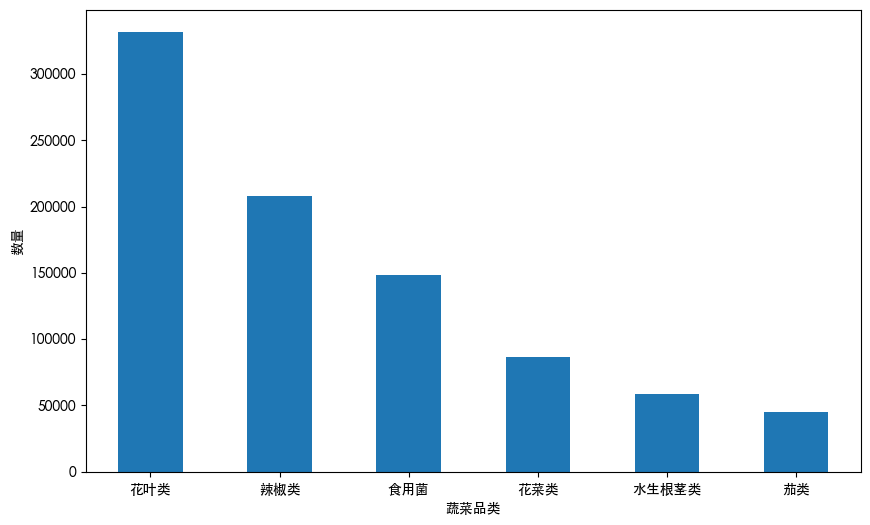

In [7]:
merge_data['分类名称'].value_counts().plot(kind='bar',figsize=(10,6))
plt.xticks(rotation=0)
plt.xlabel('蔬菜品类')
plt.ylabel('数量')
plt.savefig('不同品类单品分布.png',dpi=500)
plt.show()

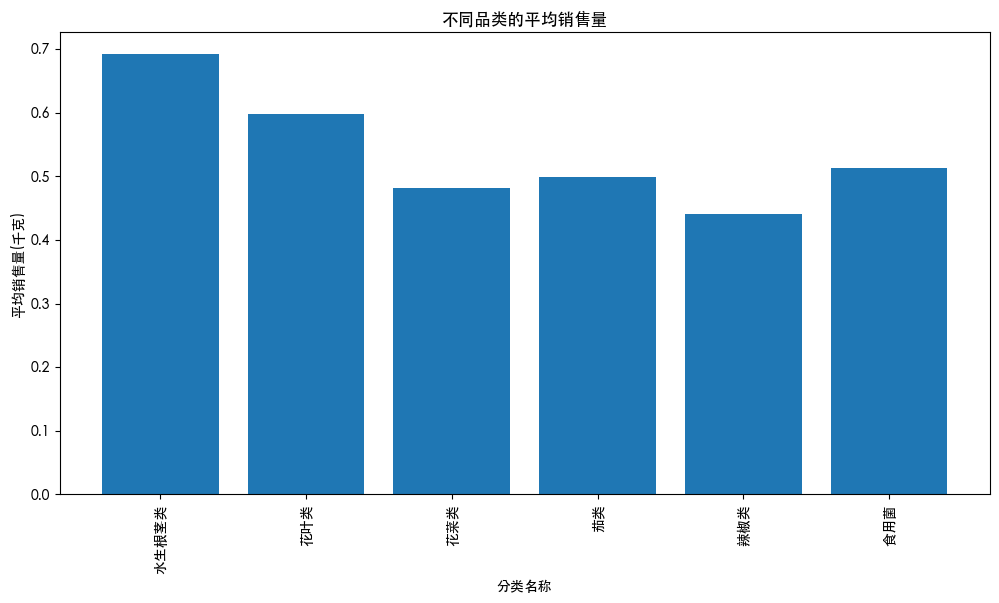

In [8]:


# 使用groupby按分类名称分组，并计算每个品类的销售量均值
sales_by_category = merge_data.groupby('分类名称')['销售量_千克'].mean().reset_index()

# 创建柱状图
plt.figure(figsize=(12, 6))
plt.bar(sales_by_category['分类名称'], sales_by_category['销售量_千克'])
plt.xlabel('分类名称')
plt.ylabel('平均销售量(千克)')
plt.title('不同品类的平均销售量')
plt.xticks(rotation=90)  # 使品类名称更易于阅读
plt.show()


#### 不同品类的箱线图

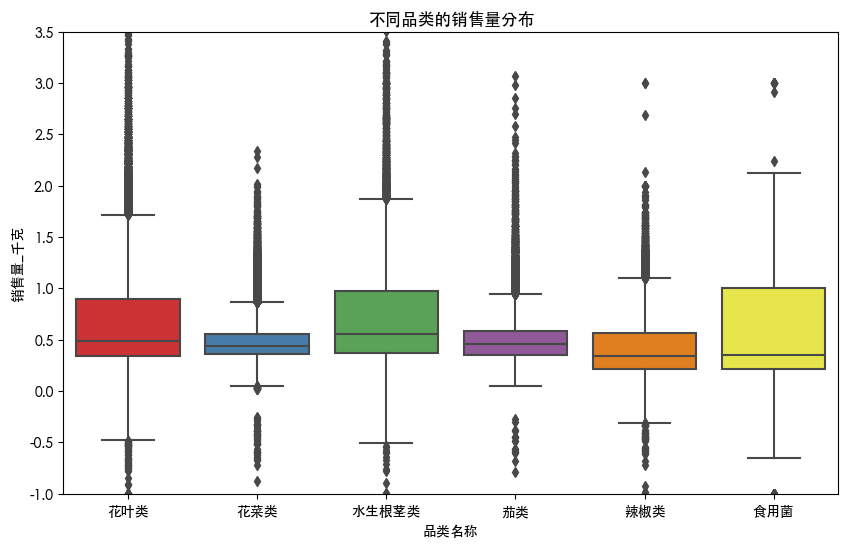

In [9]:


# 创建箱线图
plt.figure(figsize=(10, 6))
sns.boxplot(x='分类名称', y='销售量_千克', data=merge_data,palette='Set1')
plt.xlabel('品类名称')
plt.ylim(-1,3.5)
plt.title('不同品类的销售量分布')
plt.savefig('品类销量箱线图.png',dpi=900)
plt.show()


#### 进行方差分析

In [10]:


# 进行方差分析
model = ols('销售量_千克 ~ C(分类名称)', data=merge_data).fit()
anova_table = sm.stats.anova_lm(model, typ=2)

# 显示方差分析结果
print(anova_table)

# 如果ANOVA表显示存在显著差异，可以进行事后多重比较分析（Tukey's HSD测试）


tukey_results = pairwise_tukeyhsd(merge_data['销售量_千克'], merge_data['分类名称'])
print(tukey_results)


                 sum_sq        df            F  PR(>F)
C(分类名称)     4995.136558       5.0  6471.017247     0.0
Residual  135626.666208  878497.0          NaN     NaN
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj lower upper reject
-----------------------------------------------
 水生根茎类    花叶类      nan   nan   nan   nan  False
 水生根茎类    花菜类      nan   nan   nan   nan  False
 水生根茎类     茄类      nan   nan   nan   nan  False
 水生根茎类    辣椒类      nan   nan   nan   nan  False
 水生根茎类    食用菌      nan   nan   nan   nan  False
   花叶类    花菜类      nan   nan   nan   nan  False
   花叶类     茄类      nan   nan   nan   nan  False
   花叶类    辣椒类      nan   nan   nan   nan  False
   花叶类    食用菌      nan   nan   nan   nan  False
   花菜类     茄类   0.0172   nan   nan   nan  False
   花菜类    辣椒类      nan   nan   nan   nan  False
   花菜类    食用菌      nan   nan   nan   nan  False
    茄类    辣椒类      nan   nan   nan   nan  False
    茄类    食用菌      nan   nan   nan   nan  False
   辣椒类    食用菌  

In [11]:



groups = [df['销售量_千克'].dropna().values for _ , df in merge_data.groupby("分类名称")]
kw_result = kruskal(*groups)

display(kw_result)

display(groups)

KruskalResult(statistic=52273.963168938884, pvalue=0.0)

[array([0.407, 0.438, 0.401, ..., 0.53 , 0.152, 0.328]),
 array([0.743, 0.502, 0.301, ..., 1.   , 1.   , 1.   ]),
 array([0.329, 0.522, 0.236, ..., 0.455, 0.501, 0.485]),
 array([0.585, 0.719, 0.652, ..., 0.485, 0.368, 0.523]),
 array([0.326, 0.342, 0.2  , ..., 0.309, 0.343, 0.334]),
 array([0.195, 0.428, 0.239, ..., 1.   , 1.   , 1.   ])]

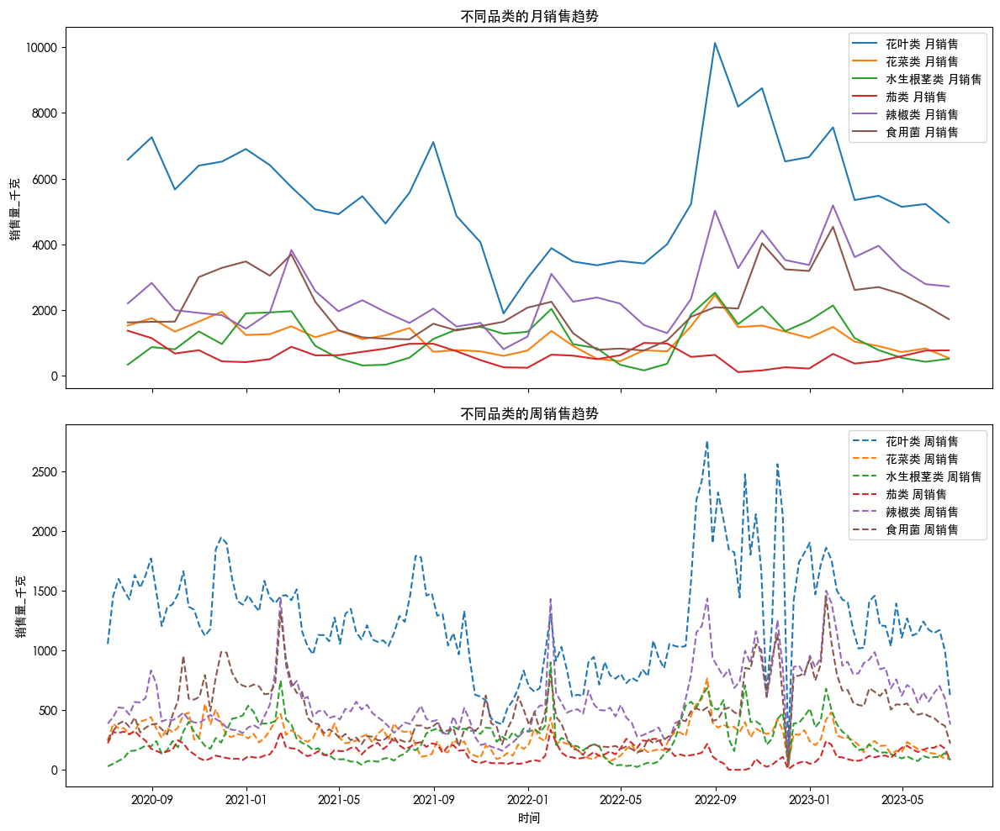

In [12]:


# 创建一个包含所有数据的DataFrame
df = merge_data.copy()

# 将销售日期列设置为索引
df['销售日期'] = pd.to_datetime(df['销售日期'])
df.set_index('销售日期', inplace=True)

# 从原始数据中提取不同品类的数据
categories = df['分类名称'].unique()

# 创建两个子图，一个用于月销售趋势，另一个用于周销售趋势
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

for category in categories:
    category_data = df[df['分类名称'] == category]
    
    # 月销售趋势
    monthly_sales = category_data['销售量_千克'].resample('M').sum()
    ax1.plot(monthly_sales.index, monthly_sales.values, label=f'{category} 月销售')
    
    # 周销售趋势
    weekly_sales = category_data['销售量_千克'].resample('W').sum()
    ax2.plot(weekly_sales.index, weekly_sales.values, label=f'{category} 周销售', linestyle='--')

# 设置标题和标签
ax1.set_title('不同品类的月销售趋势')
ax2.set_title('不同品类的周销售趋势')
ax2.set_xlabel('时间')
ax1.set_ylabel('销售量_千克')
ax2.set_ylabel('销售量_千克')

# 添加图例
ax1.legend()
ax2.legend()

# 调整子图之间的间距
plt.tight_layout()

plt.show()


不同品类之间的销售量存在显著差异，这意味着销售量在品类之间有所不同。

In [13]:


combinations_gbk = list(itertools.combinations(range(len(groups)), 2))
num_gbk = len(combinations_gbk)

alpha = 0.05 / num_gbk

significant_pairs_gbk = []

for (index1, index2) in combinations_gbk:
    stat, p = mannwhitneyu(groups[index1], groups[index2])
    if p < alpha:
        significant_pairs_gbk.append((index1, index2, p))

display(significant_pairs_gbk)
# 转换成品名
significant_pairs_names = [(categories[index1],categories[index2],p) for index1 , index2 , p in significant_pairs_gbk ]
display(significant_pairs_names)

[(0, 1, 0.0),
 (0, 2, 0.0),
 (0, 3, 0.0),
 (0, 4, 0.0),
 (0, 5, 0.0),
 (1, 2, 0.0),
 (1, 3, 0.0),
 (1, 4, 0.0),
 (1, 5, 0.0),
 (2, 3, 6.182543827022466e-25),
 (2, 4, 0.0),
 (2, 5, 0.0),
 (3, 4, 0.0),
 (3, 5, 0.0),
 (4, 5, 1.5272463381567898e-298)]

[('花叶类', '花菜类', 0.0),
 ('花叶类', '水生根茎类', 0.0),
 ('花叶类', '茄类', 0.0),
 ('花叶类', '辣椒类', 0.0),
 ('花叶类', '食用菌', 0.0),
 ('花菜类', '水生根茎类', 0.0),
 ('花菜类', '茄类', 0.0),
 ('花菜类', '辣椒类', 0.0),
 ('花菜类', '食用菌', 0.0),
 ('水生根茎类', '茄类', 6.182543827022466e-25),
 ('水生根茎类', '辣椒类', 0.0),
 ('水生根茎类', '食用菌', 0.0),
 ('茄类', '辣椒类', 0.0),
 ('茄类', '食用菌', 0.0),
 ('辣椒类', '食用菌', 1.5272463381567898e-298)]

相关性

In [14]:

# 创建一个空的相关性矩阵
correlation_matrix = pd.DataFrame(columns=merge_data['分类名称'].unique(), index=merge_data['分类名称'].unique())

# 计算每对品类之间的Spearman相关系数
for category1 in correlation_matrix.columns:
    for category2 in correlation_matrix.index:
        if category1 == category2:
            correlation_matrix.loc[category1, category2] = 1.0  # 对角线上的相关性为1
        else:
            # 提取两个品类的销售量数据
            sales_category1 = merge_data[merge_data['分类名称'] == category1]['销售量_千克'].dropna()
            sales_category2 = merge_data[merge_data['分类名称'] == category2]['销售量_千克'].dropna()
            
            # 检查是否有足够的数据来计算相关系数
            min_len = min(len(sales_category1), len(sales_category2))
            
            if min_len > 0:
                # 随机抽样，保持相同的样本大小
                np.random.seed(0)  # 设置随机种子以确保可重复性
                sales_category1 = np.random.choice(sales_category1, size=min_len, replace=False)
                sales_category2 = np.random.choice(sales_category2, size=min_len, replace=False)
                
                # 计算Spearman相关系数
                rho, _ = spearmanr(sales_category1, sales_category2)
                correlation_matrix.loc[category1, category2] = rho
                correlation_matrix.loc[category2, category1] = rho 
            else:
                correlation_matrix.loc[category1, category2] = None
                correlation_matrix.loc[category2, category1] = None

# 打印相关性矩阵
print("不同品类之间的Spearman相关性矩阵：")
display(correlation_matrix)




不同品类之间的Spearman相关性矩阵：


,花叶类,花菜类,水生根茎类,茄类,辣椒类,食用菌
花叶类,1.0,-0.004786,0.000998,-0.003396,-0.002075,-0.000396
花菜类,-0.004786,1.0,0.001436,-0.003677,-0.001767,-0.001441
水生根茎类,0.000998,0.001436,1.0,-0.000494,-0.003728,-0.001105
茄类,-0.003396,-0.003677,-0.000494,1.0,0.007242,0.003037
辣椒类,-0.002075,-0.001767,-0.003728,0.007242,1.0,-0.001985
食用菌,-0.000396,-0.001441,-0.001105,0.003037,-0.001985,1.0


### 单品分析

In [15]:
per_veg= merge_data.groupby('单品名称')['销售量_千克'].sum().reset_index()
per_veg.columns=['单品名称', '总销售量(千克)']
# 显示汇总结果
display(per_veg)

,单品名称,总销售量(千克)
0,七彩椒(1),263.192
1,七彩椒(2),370.033
2,七彩椒(份),18.000
3,上海青,7606.756
4,上海青(份),3070.000
...,...,...
246,黑牛肝菌,1.084
247,黑牛肝菌(盒),4.000
248,黑皮鸡枞菌,5.795
249,黑皮鸡枞菌(盒),4.000


In [16]:
# 使用groupby按单品名称分组，并计算销售量的描述性统计
sales_statistics = merge_data.groupby('单品名称')['销售量_千克'].describe()

# 为了更清晰，可以重命名列名
sales_statistics.rename(columns={'count': '销售次数', 'mean': '平均销售量(千克)', 'std': '标准差(千克)', 'min': '最小销售量(千克)', '25%': '25th百分位数(千克)', '50%': '中位数(千克)', '75%': '75th百分位数(千克)', 'max': '最大销售量(千克)'}, inplace=True)

# 显示销售量的描述性统计
display(sales_statistics)

,销售次数,平均销售量(千克),标准差(千克),最小销售量(千克),25th百分位数(千克),中位数(千克),75th百分位数(千克),最大销售量(千克)
单品名称,,,,,,,,
七彩椒(1),861.0,0.305682,0.114345,0.007,0.2220,0.283,0.37200,0.833
七彩椒(2),1058.0,0.349748,0.123027,-0.176,0.2380,0.363,0.44175,0.668
七彩椒(份),18.0,1.000000,0.000000,1.000,1.0000,1.000,1.00000,1.000
上海青,16644.0,0.457027,0.220773,-0.621,0.3150,0.424,0.55700,8.998
上海青(份),3071.0,0.999674,0.040355,-1.000,1.0000,1.000,1.00000,2.000
...,...,...,...,...,...,...,...,...
黑牛肝菌,4.0,0.271000,0.056155,0.222,0.2235,0.266,0.31350,0.330
黑牛肝菌(盒),4.0,1.000000,0.000000,1.000,1.0000,1.000,1.00000,1.000
黑皮鸡枞菌,35.0,0.165571,0.031015,0.122,0.1310,0.166,0.18800,0.243


#### 单品销售量前50

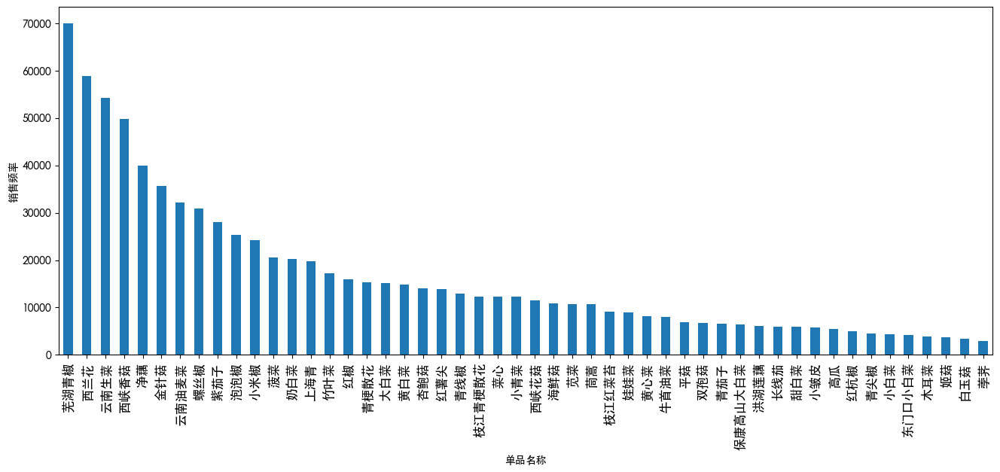

In [17]:
merge_data['单品名称']=[i.split('(')[0] for i in merge_data['单品名称']]

merge_data['单品名称'].value_counts()[:50].plot(kind='bar',figsize=(16,6))
plt.xlabel('单品名称')
plt.ylabel('销售频率')
plt.xticks(rotation=90,fontsize=12)
plt.savefig('单品销售品类.png',dpi=500)
plt.show()

#### 不同品类的每个单品的箱线图

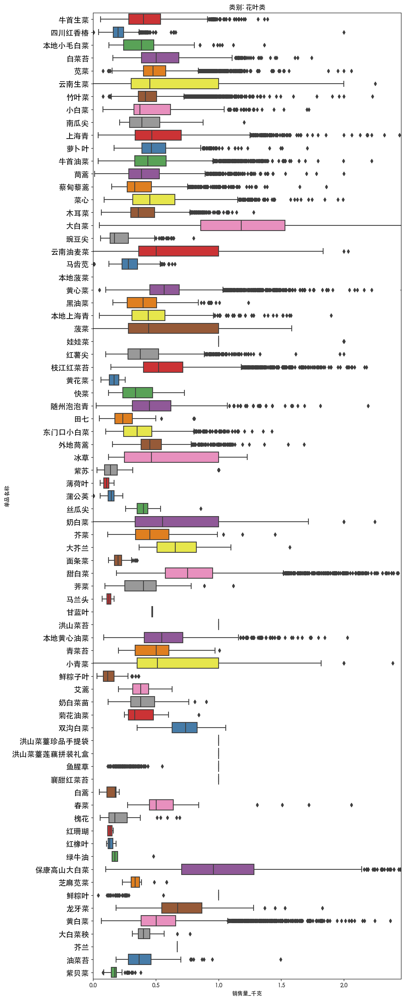

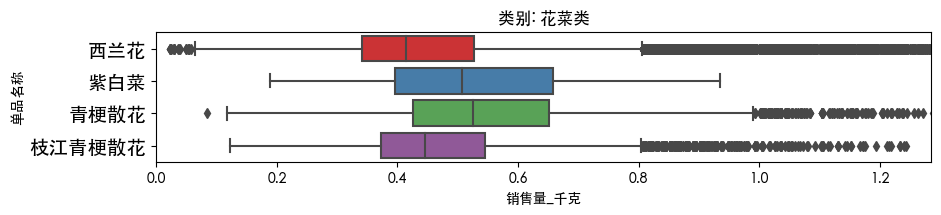

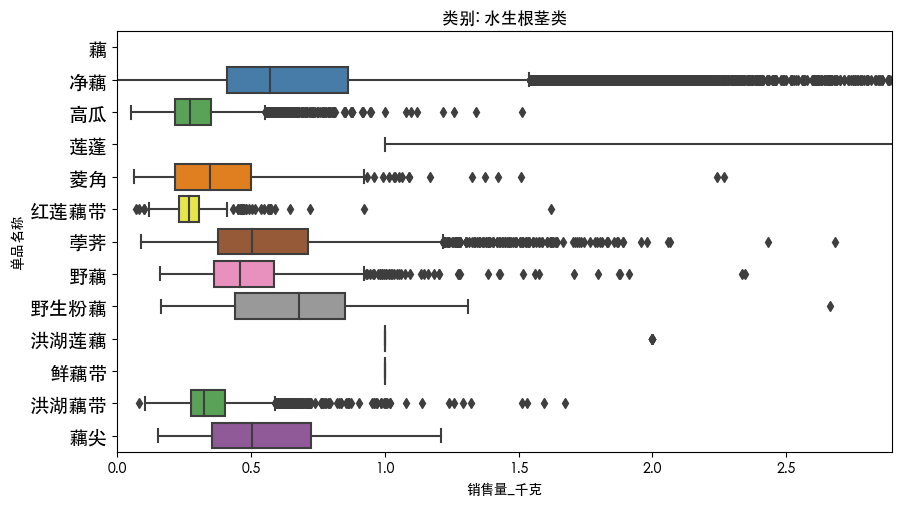

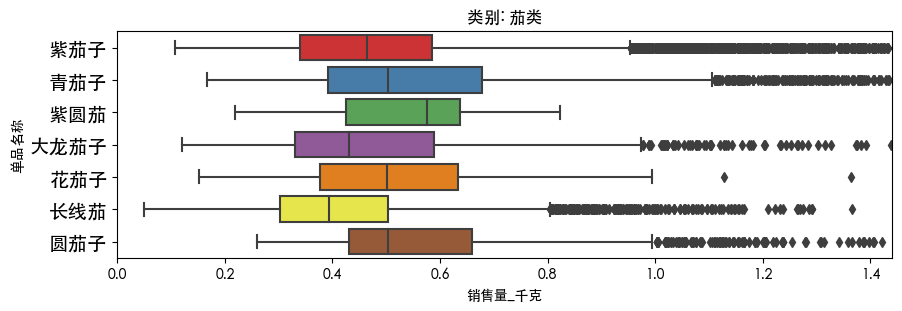

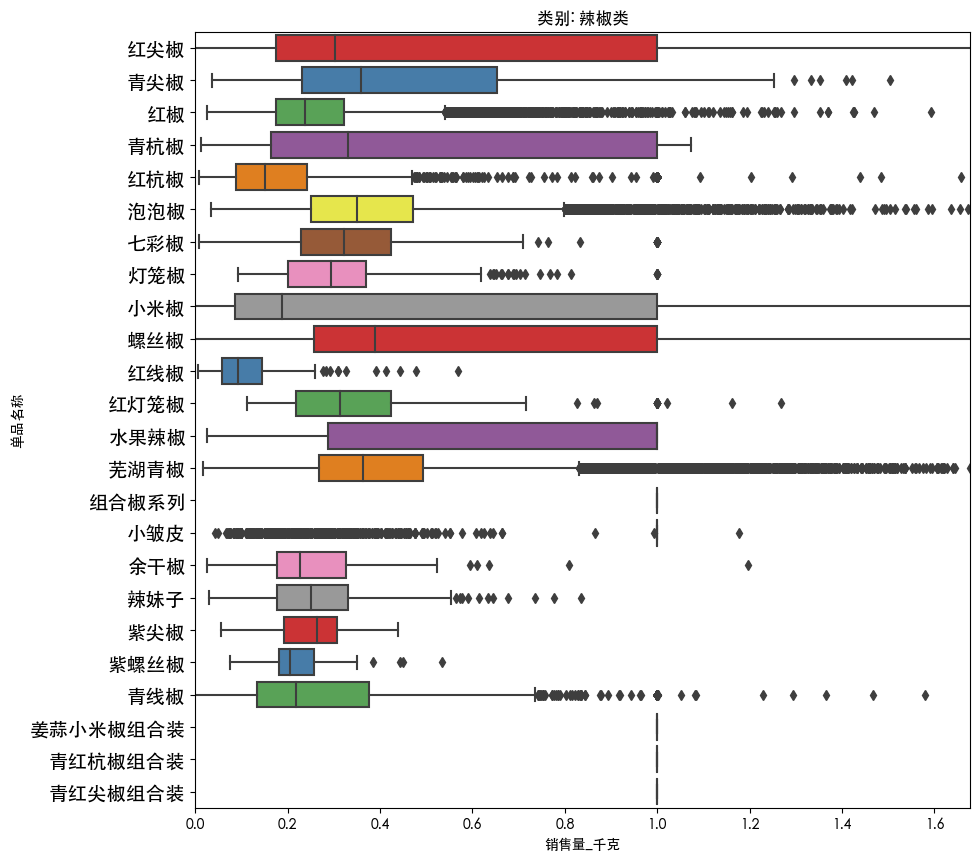

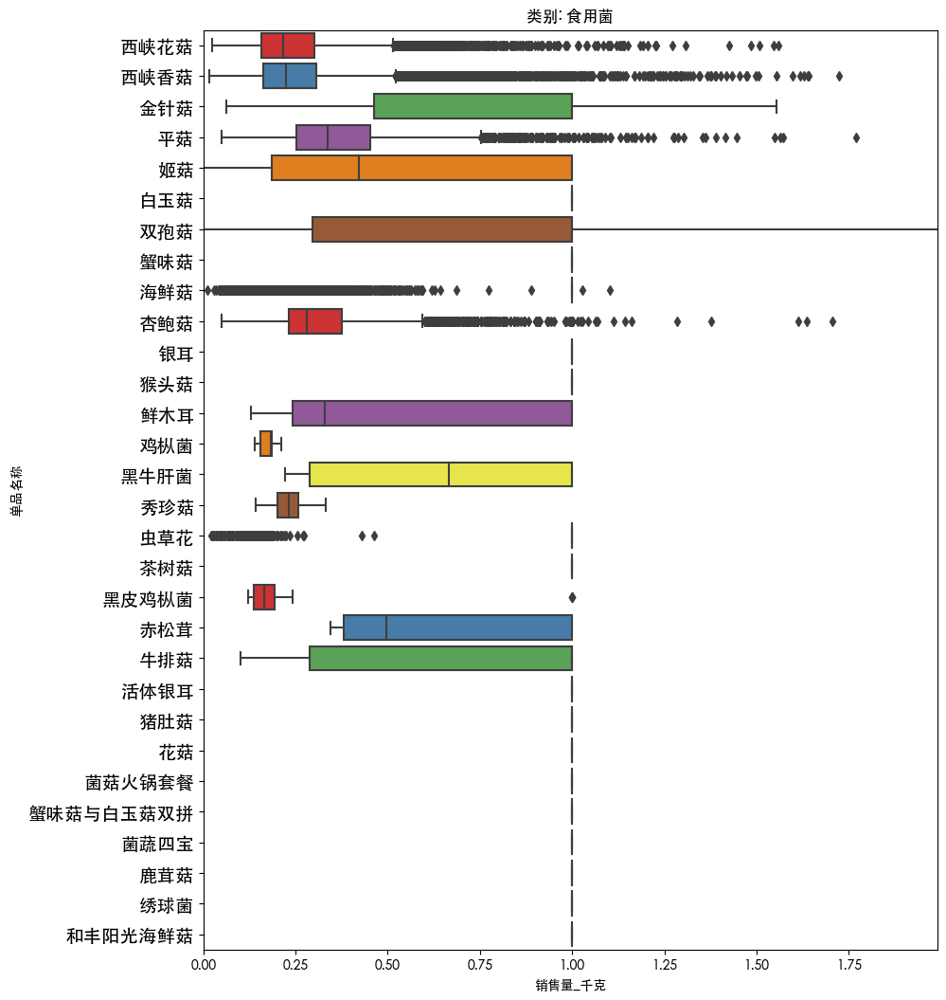

In [18]:
for i in merge_data['分类名称'].unique():
    tem = merge_data[merge_data.分类名称 == i]
    plt.figure(figsize=(10, 0.42 * len(tem['单品名称'].unique())))
    sns.boxplot(data=tem, y='单品名称', x='销售量_千克', palette='Set1')
    plt.ylabel('单品名称')
    plt.title(f'类别: {i}')
    plt.yticks(fontsize='14')
    xlim_max = tem['销售量_千克'].mean() + 4 *  tem['销售量_千克'].std()
    plt.xlim(0, xlim_max)
    
    # 修正文件名，将冒号替换为下划线
    filename = f'类别_{i}_单品销量箱线图.png'
    
    plt.savefig(filename, dpi=500)
    plt.show()


#### 按照一定时间序列分析

In [19]:
category_sales = merge_data.groupby(['分类名称', '单品名称'])

# 2. 将销售日期转换为日期时间类型
merge_data['销售日期'] = pd.to_datetime(merge_data['销售日期'])

# 3. 按周和月汇总销售量数据
# 按周汇总销售量
weekly_sales = merge_data.groupby(['分类名称', '单品名称', merge_data['销售日期'].dt.to_period('W')])['销售量_千克'].sum().reset_index()

# 按月汇总销售量
monthly_sales = merge_data.groupby(['分类名称', '单品名称', merge_data['销售日期'].dt.to_period('M')])['销售量_千克'].sum().reset_index()

# 打印结果
print("按周汇总销售量数据:")
print(weekly_sales)

print("\n按月汇总销售量数据:")
print(monthly_sales)

按周汇总销售量数据:
       分类名称   单品名称                   销售日期   销售量_千克
0     水生根茎类     净藕  2020-07-06/2020-07-12   31.470
1     水生根茎类     净藕  2020-07-13/2020-07-19   58.131
2     水生根茎类     净藕  2020-07-20/2020-07-26   54.736
3     水生根茎类     净藕  2020-07-27/2020-08-02  143.608
4     水生根茎类     净藕  2020-08-03/2020-08-09  139.063
...     ...    ...                    ...      ...
7498    食用菌  黑皮鸡枞菌  2020-12-07/2020-12-13    1.258
7499    食用菌  黑皮鸡枞菌  2020-12-14/2020-12-20    0.568
7500    食用菌  黑皮鸡枞菌  2020-12-21/2020-12-27    0.429
7501    食用菌  黑皮鸡枞菌  2021-12-27/2022-01-02    1.000
7502    食用菌  黑皮鸡枞菌  2022-01-03/2022-01-09    3.000

[7503 rows x 4 columns]

按月汇总销售量数据:
       分类名称   单品名称     销售日期    销售量_千克
0     水生根茎类     净藕  2020-07   214.199
1     水生根茎类     净藕  2020-08   720.562
2     水生根茎类     净藕  2020-09   757.640
3     水生根茎类     净藕  2020-10  1326.863
4     水生根茎类     净藕  2020-11   943.696
...     ...    ...      ...       ...
2110    食用菌  黑皮鸡枞菌  2020-09     0.482
2111    食用菌  黑皮鸡枞菌  2020-10     0.76

In [20]:
# 定义一个函数，用于计算描述性统计
def calculate_descriptive_statistics(grouped_data):
    statistics = grouped_data['销售量_千克'].agg(['mean', 'median', 'std']).reset_index()
    return statistics

# 对周销售量数据进行描述性统计
weekly_statistics = calculate_descriptive_statistics(weekly_sales)
print("描述性统计 - 按周销售量:")
print(weekly_statistics)

# 对月销售量数据进行描述性统计
monthly_statistics = calculate_descriptive_statistics(monthly_sales)
print("\n描述性统计 - 按月销售量:")
print(monthly_statistics)


描述性统计 - 按周销售量:
    index     销售量_千克
0    mean  62.771680
1  median  32.282000
2     std  83.149708

描述性统计 - 按月销售量:
    index      销售量_千克
0    mean  222.683649
1  median   92.000000
2     std  323.340242


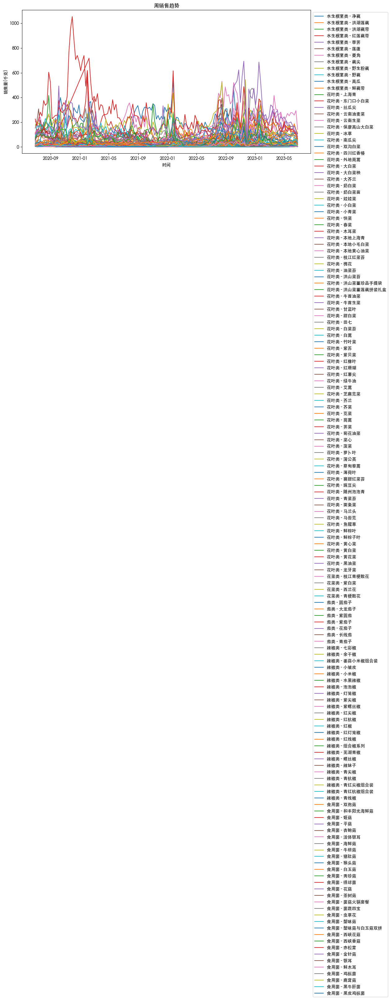

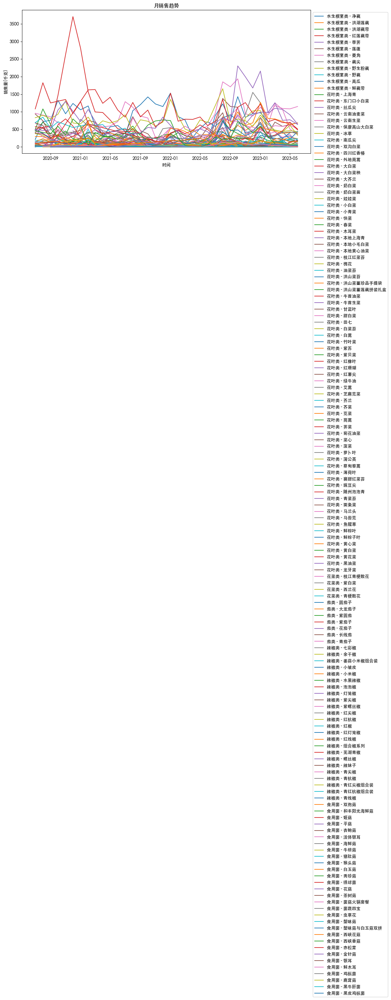

In [21]:

# 创建一个函数来可视化销售趋势
def visualize_sales_trend(data, title):
    # 创建一个新的图表
    plt.figure(figsize=(12, 6))
    
    # 针对不同品类和单品进行循环
    for index, group in data.groupby(['分类名称', '单品名称']):
        category_name, product_name = index
        
        # 将Period类型的日期转换为Timestamp类型
        group['销售日期'] = group['销售日期'].dt.to_timestamp()
        
        plt.plot(group['销售日期'], group['销售量_千克'], label=f"{category_name} - {product_name}")

    # 设置图表标题和标签
    plt.title(title)
    plt.xlabel('时间')
    plt.ylabel('销售量(千克)')
    
    # 添加图例
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
    
    # 显示图表
    plt.tight_layout()
    plt.show()

# 可视化周销售趋势
visualize_sales_trend(weekly_sales, '周销售趋势')

# 可视化月销售趋势
visualize_sales_trend(monthly_sales, '月销售趋势')


#### 单品差异性和相关性分析

In [22]:


# 以月销售量数据为例进行方差分析
# 执行方差分析
f_statistic, p_value = f_oneway(*[group['销售量_千克'] for _, group in monthly_sales.groupby(['分类名称', '单品名称'])])

# 显示ANOVA结果
print("ANOVA结果:")
print("F-Statistic:", f_statistic)
print("P-Value:", p_value)

# 判断是否存在显著差异（通常p-value小于0.05表示存在显著差异）
if p_value < 0.05:
    print("存在显著差异")
else:
    print("不存在显著差异")

# 如果存在显著差异，执行事后多重比较（Tukey's HSD测试）
if p_value < 0.05:
    # 提取销售量数据和分组标签为一维数组
    endog = monthly_sales['销售量_千克'].values
    groups = monthly_sales['分类名称'].astype(str) + ' - ' + monthly_sales['单品名称'].astype(str)
    
    mc = pairwise_tukeyhsd(endog, groups)
    print("\nTukey's HSD多重比较:")
    print(mc)
    # mc.plot_simultaneous()

ANOVA结果:
F-Statistic: 16.5933574303832
P-Value: 2.059804442612568e-253
存在显著差异

Tukey's HSD多重比较:
              Multiple Comparison of Means - Tukey HSD, FWER=0.05              
     group1           group2       meandiff  p-adj    lower      upper   reject
-------------------------------------------------------------------------------
      水生根茎类 - 净藕     水生根茎类 - 洪湖莲藕  -488.6593    0.0  -759.1604 -218.1581   True
      水生根茎类 - 净藕     水生根茎类 - 洪湖藕带  -712.3145    0.0 -1027.1527 -397.4763   True
      水生根茎类 - 净藕     水生根茎类 - 红莲藕带  -751.2156    0.0 -1164.1221 -338.3092   True
      水生根茎类 - 净藕       水生根茎类 - 荸荠   -597.426    0.0  -954.7361 -240.1158   True
      水生根茎类 - 净藕       水生根茎类 - 莲蓬  -466.2826  0.004  -879.1891  -53.3762   True
      水生根茎类 - 净藕       水生根茎类 - 菱角  -749.7656    0.0 -1140.4695 -359.0617   True
      水生根茎类 - 净藕       水生根茎类 - 藕尖  -756.2614 0.0236 -1482.4396  -30.0831   True
      水生根茎类 - 净藕     水生根茎类 - 野生粉藕  -752.8646    0.0 -1279.6897 -226.0396   True
      水生根茎类 - 净藕       水

# Question 2

In [1]:

# 读取附件数据


data1 = pd.read_excel(r'./附件1.xlsx')  # 产品数据
data2 = pd.read_excel(r'./附件2.xlsx')  # 销售数据
data3 = pd.read_excel(r'./附件3.xlsx')  # 批发价格数据
data4 = pd.read_excel(r'./附件4.xlsx',sheet_name='Sheet1')  # 损耗率数据


NameError: name 'pd' is not defined

In [24]:
display(data1,data2,data3,data4)

,单品编码,单品名称,分类编码,分类名称
0,102900005115168,牛首生菜,1011010101,花叶类
1,102900005115199,四川红香椿,1011010101,花叶类
2,102900005115625,本地小毛白菜,1011010101,花叶类
3,102900005115748,白菜苔,1011010101,花叶类
4,102900005115762,苋菜,1011010101,花叶类
...,...,...,...,...
246,106958851400125,海鲜菇(袋)(4),1011010801,食用菌
247,106971533450003,海鲜菇(包),1011010801,食用菌
248,106971533455008,海鲜菇(袋)(3),1011010801,食用菌
249,106973223300667,虫草花(盒)(2),1011010801,食用菌


,销售日期,扫码销售时间,单品编码,销量(千克),销售单价(元/千克),销售类型,是否打折销售
0,2020-07-01,09:15:07.924,102900005117056,0.396,7.6,销售,否
1,2020-07-01,09:17:27.295,102900005115960,0.849,3.2,销售,否
2,2020-07-01,09:17:33.905,102900005117056,0.409,7.6,销售,否
3,2020-07-01,09:19:45.450,102900005115823,0.421,10.0,销售,否
4,2020-07-01,09:20:23.686,102900005115908,0.539,8.0,销售,否
...,...,...,...,...,...,...,...
878498,2023-06-30,21:35:13.264,102900005115250,0.284,24.0,销售,否
878499,2023-06-30,21:35:14.358,102900011022764,0.669,12.0,销售,否
878500,2023-06-30,21:35:20.264,102900005115250,0.125,24.0,销售,否
878501,2023-06-30,21:35:21.509,102900011016701,0.252,5.2,销售,否


,日期,单品编码,批发价格(元/千克)
0,2020-07-01,102900005115762,3.88
1,2020-07-01,102900005115779,6.72
2,2020-07-01,102900005115786,3.19
3,2020-07-01,102900005115793,9.24
4,2020-07-01,102900005115823,7.03
...,...,...,...
55977,2023-06-30,102900051000944,18.00
55978,2023-06-30,102900051004294,6.45
55979,2023-06-30,102900051010455,4.48
55980,2023-06-30,106949711300259,1.45


,单品编码,单品名称,损耗率(%)
0,102900005115168,牛首生菜,4.39
1,102900005115199,四川红香椿,10.46
2,102900005115250,西峡花菇(1),10.80
3,102900005115625,本地小毛白菜,0.18
4,102900005115748,白菜苔,8.78
...,...,...,...
246,106971533455008,海鲜菇(袋)(3),1.30
247,106971563780002,鲜粽叶(袋)(2),0.00
248,106972776821582,鲜粽叶(袋)(3),9.43
249,106973223300667,虫草花(盒)(2),11.13


In [25]:
data = pd.merge(data2,data1)
lst = []
for code , date in zip (data['单品编码'][:],data['销售日期'][:]):
    lst.append(data3[(data3.日期==date) & (data3.单品编码==code)]['批发价格(元/千克)'].values[0])
data['批发价格'] = lst
data  = data[(data.是否打折销售=='否')&(data.销售类型=='销售')]
data

,销售日期,扫码销售时间,单品编码,销量(千克),销售单价(元/千克),销售类型,是否打折销售,单品名称,分类编码,分类名称,批发价格
0,2020-07-01,09:15:07.924,102900005117056,0.396,7.6,销售,否,泡泡椒(精品),1011010504,辣椒类,4.32
1,2020-07-01,09:17:33.905,102900005117056,0.409,7.6,销售,否,泡泡椒(精品),1011010504,辣椒类,4.32
2,2020-07-01,09:21:55.556,102900005117056,0.277,7.6,销售,否,泡泡椒(精品),1011010504,辣椒类,4.32
3,2020-07-01,09:22:01.274,102900005117056,0.132,7.6,销售,否,泡泡椒(精品),1011010504,辣椒类,4.32
4,2020-07-01,09:41:09.342,102900005117056,0.198,7.6,销售,否,泡泡椒(精品),1011010504,辣椒类,4.32
...,...,...,...,...,...,...,...,...,...,...,...
878490,2023-06-11,10:41:12.092,102900011036686,1.000,3.9,销售,否,木耳菜(份),1011010101,花叶类,2.30
878497,2023-06-19,10:18:18.266,102900011036686,1.000,3.9,销售,否,木耳菜(份),1011010101,花叶类,1.34
878498,2023-06-21,16:30:43.092,102900011036686,1.000,3.9,销售,否,木耳菜(份),1011010101,花叶类,1.37
878499,2023-06-23,18:47:46.777,102900011036686,1.000,3.9,销售,否,木耳菜(份),1011010101,花叶类,1.22


In [26]:

sale = data.groupby(['单品编码','销售单价(元/千克)','销售日期']).agg({'销量(千克)':[np.sum],'批发价格':['mean'],'销售单价(元/千克)':[np.mean]})
sale.columns = ['总销量','批发价格','销售价格']
sale['总利润'] = (sale['销售价格'] - sale['批发价格']) * sale['总销量']
sale['成本利润率'] = (sale['销售价格'] - sale['批发价格']) / sale['批发价格']

lst = []

for i in sale.index:
    lst.append(data1[data1.单品编码==i[0]]['分类名称'].values[0])
sale['分类名称']= lst
index = sale.index
sale  = sale.reset_index()

sale['单品编码'] = [i[0] for i in index]
sale['销售日期'] = [i[2] for i in index]


In [27]:
sale['销售日期'] = pd.to_datetime(sale['销售日期'], format='%Y-%m-%d')
sale = sale.sort_values(by='销售日期')
sale

,单品编码,销售单价(元/千克),销售日期,总销量,批发价格,销售价格,总利润,成本利润率,分类名称
27514,102900011009970,9.0,2020-07-01,12.086,6.03,9.0,35.89542,0.492537,花菜类
9618,102900005116257,6.0,2020-07-01,17.661,6.56,6.0,-9.89016,-0.085366,茄类
11685,102900005116530,18.0,2020-07-01,7.498,10.80,18.0,53.98560,0.666667,食用菌
6956,102900005115960,3.2,2020-07-01,14.748,2.10,3.2,16.22280,0.523810,花叶类
42381,102900051000944,39.8,2020-07-01,0.731,29.43,39.8,7.58047,0.352362,水生根茎类
...,...,...,...,...,...,...,...,...,...
35182,102900011031926,3.8,2023-06-30,2.000,2.60,3.8,2.40000,0.461538,食用菌
32800,102900011030097,4.5,2023-06-30,23.000,2.84,4.5,38.18000,0.584507,花叶类
9780,102900005116257,6.0,2023-06-30,14.365,3.43,6.0,36.91805,0.749271,茄类
45839,106971533450003,3.0,2023-06-30,3.000,1.95,3.0,3.15000,0.538462,食用菌


In [28]:
# 计算归一化系数
lst = []
values = []
for i in sale['分类名称'].unique():
    tem = sale[sale.分类名称==i]
    for o in tem['销售日期'].unique():
        t = tem[tem.销售日期==o]
        s = t['总销量'].sum()
        for z in t['总销量'].values:
            lst.append(z/s)
        for v in t.values:
            values.append(v)
sale = pd.DataFrame(values, columns=sale.columns)

sale['归一化系数'] = lst
sale['加权批发价格'] = sale['归一化系数'] * sale['批发价格']
sale['加权销售价格'] = sale['归一化系数'] * sale['销售价格']
sale['加权成本利润率']=sale['归一化系数'] *sale['成本利润率']
display(sale)

sale_plus = sale.groupby(['分类名称','销售日期']).agg({"总销量":[np.sum],"总利润":[np.sum], "加权批发价格":[np.sum],"加权销售价格":[np.sum],"加权成本利润率":[np.sum]})
sale_plus.columns = ['总销量','总利润','加权批发价格','加权销售价格','加权平均利润率']
index = sale_plus.index
sale_plus = sale_plus.reset_index()
display(index)
sale_plus['分类名称'] = [i[0] for i in index]
sale_plus['销售日期'] = [i[1] for i in index]
display(sale_plus)

,单品编码,销售单价(元/千克),销售日期,总销量,批发价格,销售价格,总利润,成本利润率,分类名称,归一化系数,加权批发价格,加权销售价格,加权成本利润率
0,102900011009970,9.0,2020-07-01,12.086,6.03,9.0,35.89542,0.492537,花菜类,0.256734,1.548105,2.310604,0.126451
1,102900005116714,14.0,2020-07-01,34.990,9.23,14.0,166.90230,0.516793,花菜类,0.743266,6.860347,10.405727,0.384115
2,102900005116714,14.0,2020-07-02,30.109,8.90,14.0,153.55590,0.573034,花菜类,0.685183,6.098129,9.592563,0.392633
3,102900011009970,9.0,2020-07-02,13.834,5.52,9.0,48.14232,0.630435,花菜类,0.314817,1.737789,2.833352,0.198472
4,102900005116714,14.0,2020-07-03,26.460,8.97,14.0,133.09380,0.560758,花菜类,0.628862,5.640893,8.804069,0.352639
...,...,...,...,...,...,...,...,...,...,...,...,...,...
46175,102900011016701,5.2,2023-06-30,15.896,3.63,5.2,24.95672,0.432507,辣椒类,0.201149,0.730171,1.045975,0.086998
46176,102900011034439,5.8,2023-06-30,4.000,3.32,5.8,9.92000,0.746988,辣椒类,0.050616,0.168046,0.293574,0.037810
46177,102900011000328,12.0,2023-06-30,8.470,8.97,12.0,25.66410,0.337793,辣椒类,0.107180,0.961404,1.286159,0.036205
46178,102900011032848,4.8,2023-06-30,9.000,2.33,4.8,22.23000,1.060086,辣椒类,0.113887,0.265356,0.546656,0.120730


MultiIndex([('水生根茎类', '2020-07-01'),
            ('水生根茎类', '2020-07-02'),
            ('水生根茎类', '2020-07-03'),
            ('水生根茎类', '2020-07-04'),
            ('水生根茎类', '2020-07-05'),
            ('水生根茎类', '2020-07-06'),
            ('水生根茎类', '2020-07-07'),
            ('水生根茎类', '2020-07-08'),
            ('水生根茎类', '2020-07-09'),
            ('水生根茎类', '2020-07-10'),
            ...
            (  '食用菌', '2023-06-21'),
            (  '食用菌', '2023-06-22'),
            (  '食用菌', '2023-06-23'),
            (  '食用菌', '2023-06-24'),
            (  '食用菌', '2023-06-25'),
            (  '食用菌', '2023-06-26'),
            (  '食用菌', '2023-06-27'),
            (  '食用菌', '2023-06-28'),
            (  '食用菌', '2023-06-29'),
            (  '食用菌', '2023-06-30')],
           names=['分类名称', '销售日期'], length=6473)

,分类名称,销售日期,总销量,总利润,加权批发价格,加权销售价格,加权平均利润率
0,水生根茎类,2020-07-01,4.850,25.49812,9.234161,14.491505,0.706978
1,水生根茎类,2020-07-02,4.600,20.48956,7.093748,11.548000,0.710128
2,水生根茎类,2020-07-03,4.410,19.35990,5.610000,10.000000,0.782531
3,水生根茎类,2020-07-04,5.439,42.52497,14.015119,21.833646,0.688605
4,水生根茎类,2020-07-05,4.019,18.40702,5.420000,10.000000,0.845018
...,...,...,...,...,...,...,...
6468,食用菌,2023-06-26,27.582,64.70880,4.218664,6.564716,0.530185
6469,食用菌,2023-06-27,25.708,60.13720,4.226498,6.565738,0.543177
6470,食用菌,2023-06-28,51.742,82.62280,3.086181,4.683004,0.470561
6471,食用菌,2023-06-29,43.314,72.32760,3.278580,4.948423,0.460978


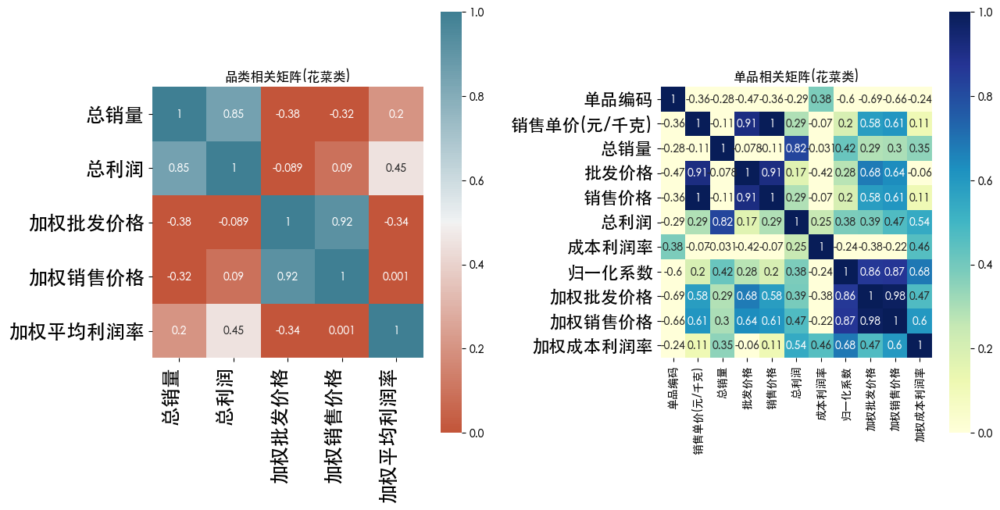

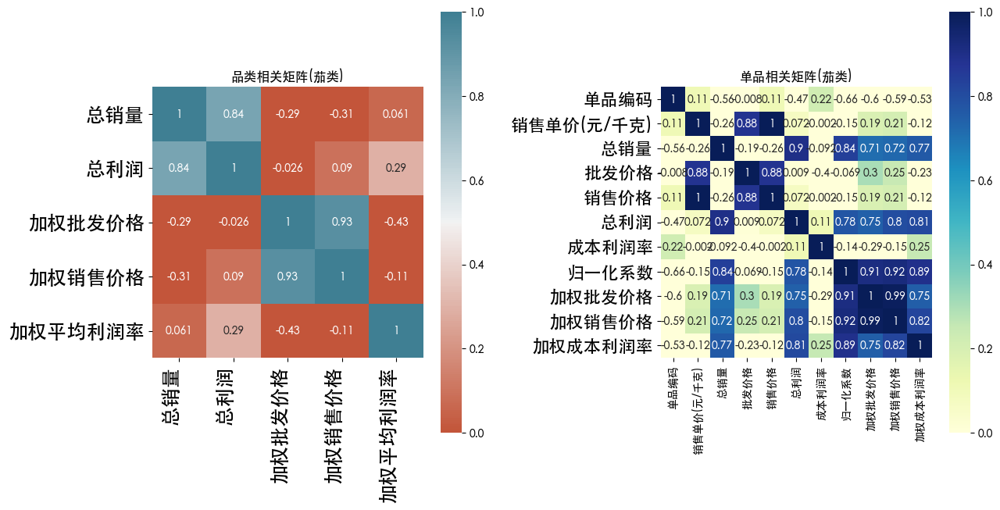

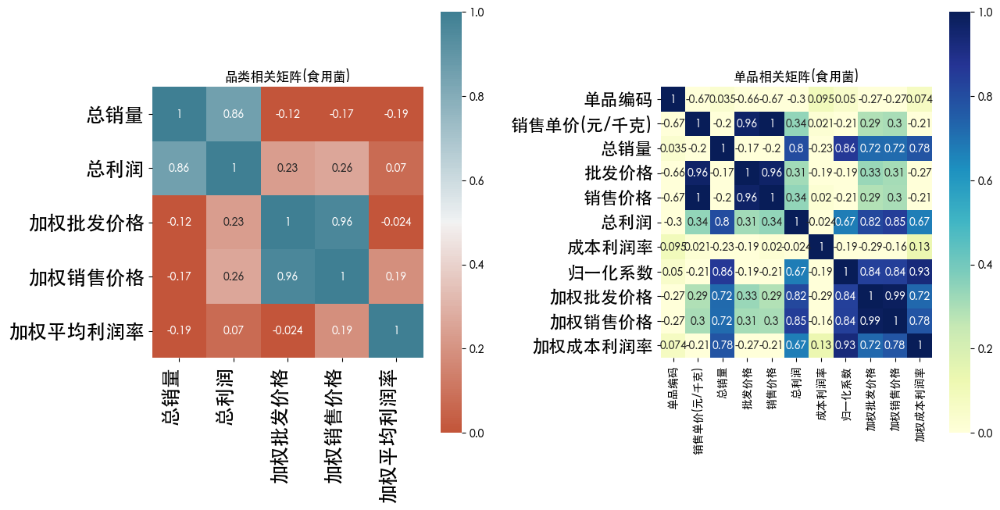

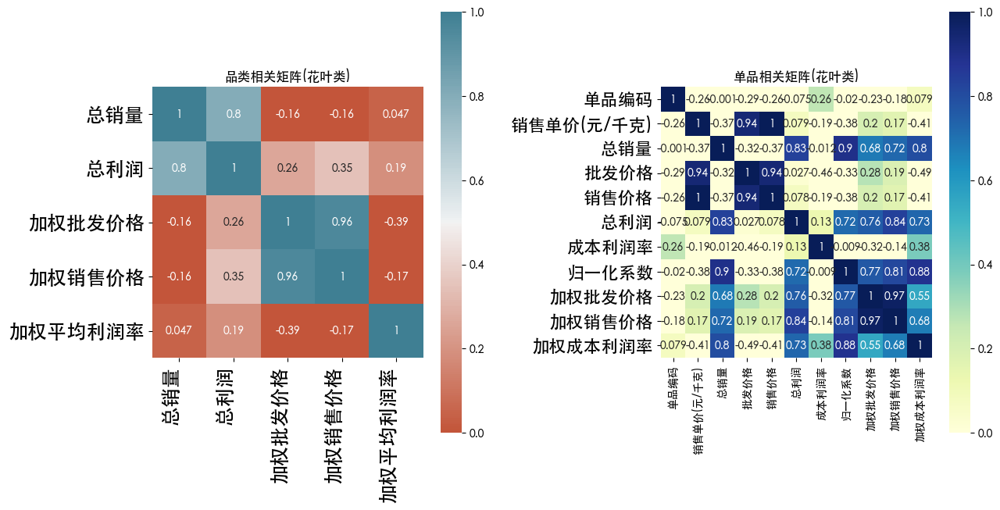

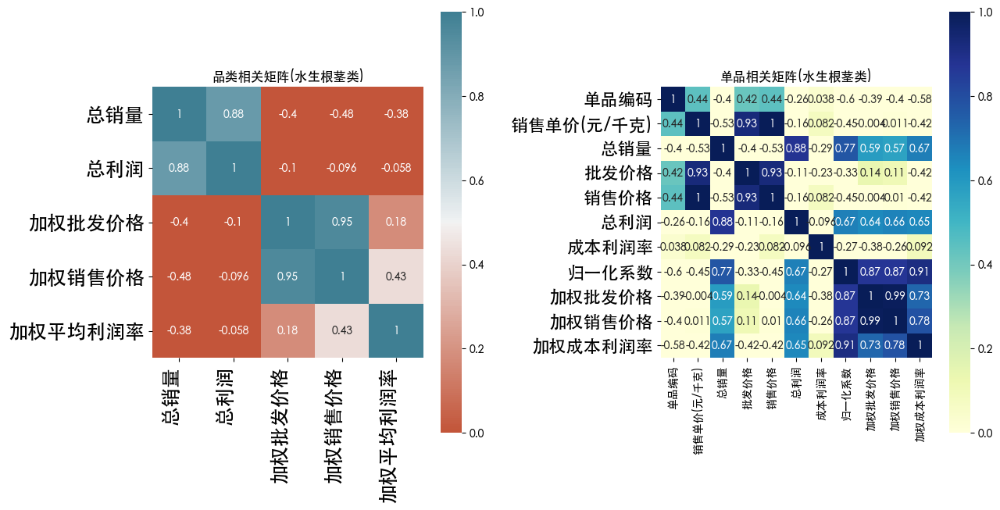

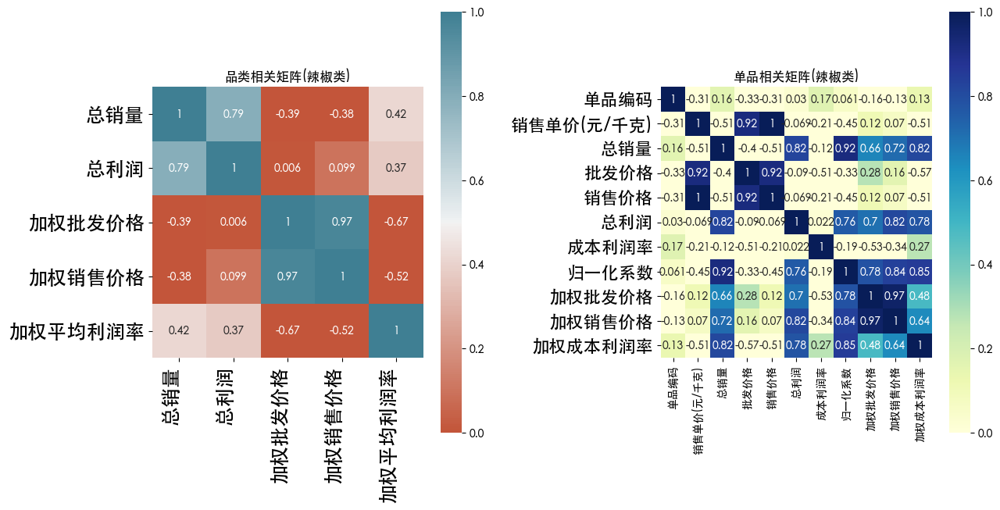

In [29]:
for i in sale['分类名称'].unique():
    sub_sale_plus = sale_plus[sale_plus.分类名称 == i]
    sub_sale = sale[sale.分类名称 == i]
    
    # Filter out non-numeric columns
    numeric_columns_plus = sub_sale_plus.select_dtypes(include=['number'])
    numeric_columns_sale = sub_sale.select_dtypes(include=['number'])
    
    corr_plus = round(numeric_columns_plus.corr(method='spearman'), 3)
    corr_sale = round(numeric_columns_sale.corr(method='spearman'), 3)
    
    fig = plt.figure(figsize=(14, 7))

    ax1 = fig.add_subplot(121)
    sns.heatmap(corr_plus, annot=True, vmax=1, vmin=0, xticklabels=True, yticklabels=True, square=True, cmap=sns.diverging_palette(20, 220, n=200))
    ax1.set_yticklabels(corr_plus.columns, fontsize=18, rotation=360, horizontalalignment='right')
    ax1.set_xticklabels(corr_plus.columns, fontsize=18, horizontalalignment='right')
    ax1.set_title(f'品类相关矩阵({i})')

    ax2 = fig.add_subplot(122)
    columns = ['总销量', '总利润', '批发价格', '销售价格', '成本利润率']
    sns.heatmap(corr_sale, annot=True, vmax=1, vmin=0, xticklabels=True, yticklabels=True, square=True, cmap='YlGnBu')
    ax2.set_yticklabels(corr_sale.columns, fontsize=16, rotation=0, horizontalalignment='right')

    plt.subplots_adjust(wspace=0.5)
    ax2.set_title(f'单品相关矩阵({i})')
    
    plt.savefig(f'P2\\利润销量相关系数热力图({i}).png', dpi=500, bbox_inches='tight')
    plt.show()


In [30]:
sub_sale

,单品编码,销售单价(元/千克),销售日期,总销量,批发价格,销售价格,总利润,成本利润率,分类名称,归一化系数,加权批发价格,加权销售价格,加权成本利润率
35578,102900005125808,25.8,2020-07-01,4.383,12.10,25.8,60.04710,1.132231,辣椒类,0.057134,0.691316,1.474045,0.064688
35579,102900005117056,7.6,2020-07-01,54.548,4.32,7.6,178.91744,0.759259,辣椒类,0.711047,3.071725,5.403960,0.539869
35580,102900005117209,16.0,2020-07-01,1.909,7.58,16.0,16.07378,1.110818,辣椒类,0.024884,0.188623,0.398149,0.027642
35581,102900051004294,14.0,2020-07-01,5.510,6.81,14.0,39.61690,1.055800,辣椒类,0.071824,0.489123,1.005540,0.075832
35582,102900005123880,12.0,2020-07-01,0.927,7.50,12.0,4.17150,0.600000,辣椒类,0.012084,0.090628,0.145004,0.007250
...,...,...,...,...,...,...,...,...,...,...,...,...,...
46175,102900011016701,5.2,2023-06-30,15.896,3.63,5.2,24.95672,0.432507,辣椒类,0.201149,0.730171,1.045975,0.086998
46176,102900011034439,5.8,2023-06-30,4.000,3.32,5.8,9.92000,0.746988,辣椒类,0.050616,0.168046,0.293574,0.037810
46177,102900011000328,12.0,2023-06-30,8.470,8.97,12.0,25.66410,0.337793,辣椒类,0.107180,0.961404,1.286159,0.036205
46178,102900011032848,4.8,2023-06-30,9.000,2.33,4.8,22.23000,1.060086,辣椒类,0.113887,0.265356,0.546656,0.120730


#### Spearman P value 

In [31]:

def calculate_spearman_correlation(X,Y):
    return stats.spearman(X,Y)[0]
def calculate_spearman_correlation_p(X,Y):
    return stats.spearmanr(X,Y)[1]

name = []
lst1,lst2 = [] , []

for i in sale['分类名称'].unique():
    name.append(i)
    t1 , t2 = [] ,[]
    sub_sale_plus = sale_plus[sale_plus.分类名称==i]
    sub_sale=sale[sale.分类名称==i]
    for o in ['总销量','总利润','加权批发价格','加权销售价格']:
        t1.append(calculate_spearman_correlation_p(sub_sale_plus['加权平均利润率'],sub_sale_plus[o]))
    for o in ['总销量', '总利润', '批发价格', '销售价格']:
        t2.append(calculate_spearman_correlation_p(sub_sale['成本利润率'],sub_sale[o]))
    lst1.append(t1)
    lst2.append(t2)
round(pd.DataFrame(lst1,columns=['总销量','总利润','加权批发价格','加权销售价格'],index=name),2).to_excel('P2\\品类加权成本利润率spearman检验.xlsx')
round(pd.DataFrame(lst2,columns=['总销量','总利润','批发价格','销售价格'],index=name),2).to_excel('P2\\单品成本利润率spearman检验.xlsx')



In [32]:
spearman_res_wei = pd.read_excel(r'./P2\品类加权成本利润率spearman检验.xlsx')
spearman_res_nwei= pd.read_excel(r'./P2\单品成本利润率spearman检验.xlsx')
display(spearman_res_wei ,spearman_res_nwei )

,Unnamed: 0,总销量,总利润,加权批发价格,加权销售价格
0,花菜类,0.00,0.00,0.00,0.98
1,茄类,0.05,0.00,0.00,0.00
2,食用菌,0.00,0.02,0.43,0.00
3,花叶类,0.13,0.00,0.00,0.00
4,水生根茎类,0.00,0.05,0.00,0.00
5,辣椒类,0.00,0.00,0.00,0.00


,Unnamed: 0,总销量,总利润,批发价格,销售价格
0,花菜类,0.18,0.00,0,0.00
1,茄类,0.00,0.00,0,0.92
2,食用菌,0.00,0.02,0,0.05
3,花叶类,0.12,0.00,0,0.00
4,水生根茎类,0.00,0.00,0,0.00
5,辣椒类,0.00,0.03,0,0.00


## 拟合日期-批发价格 以预测 后7天的批发价

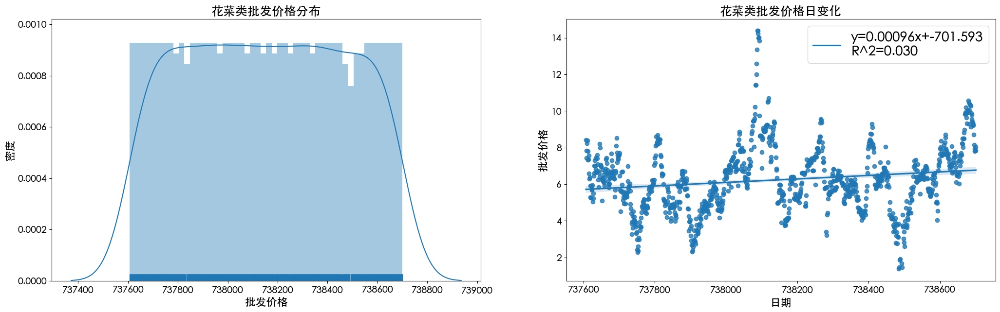

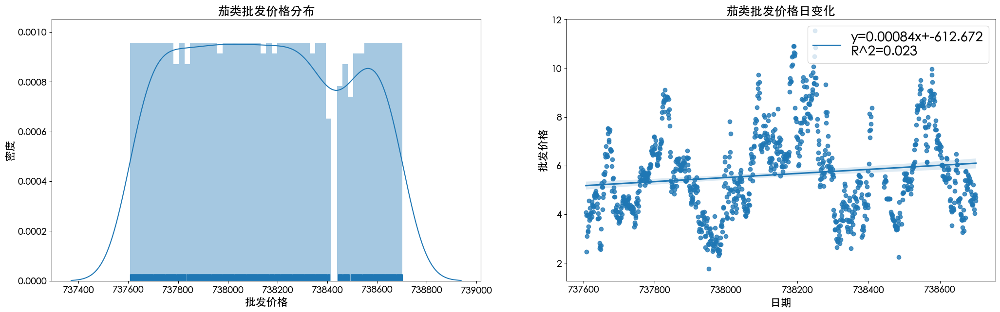

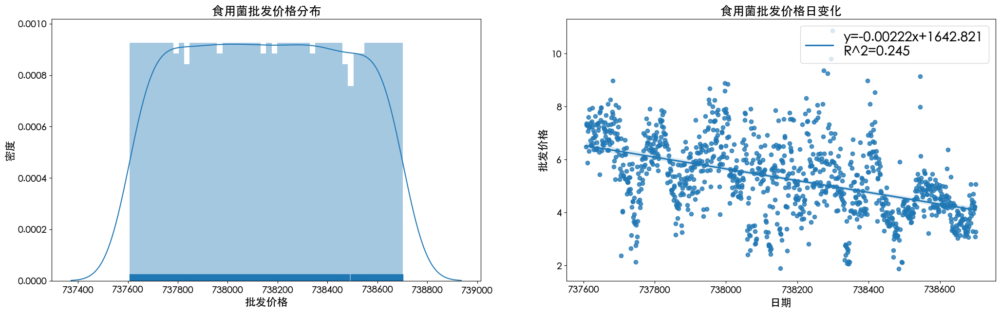

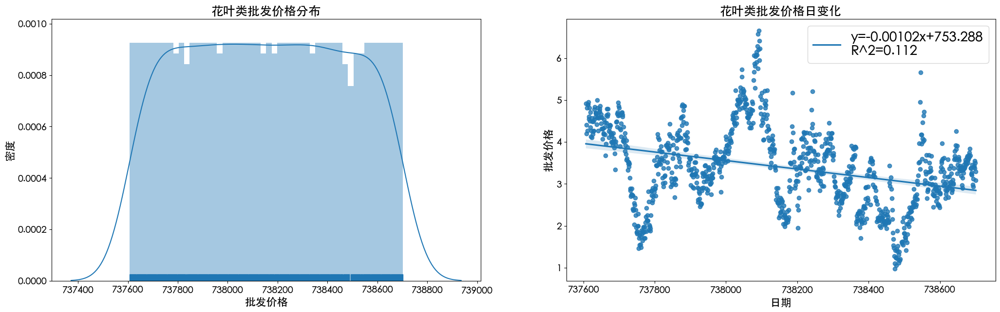

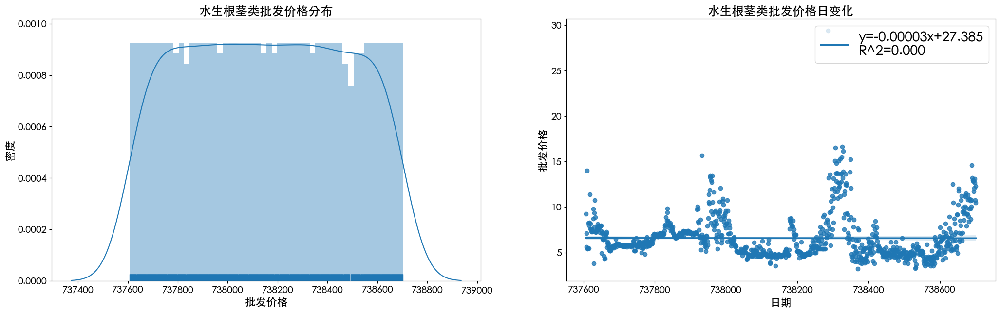

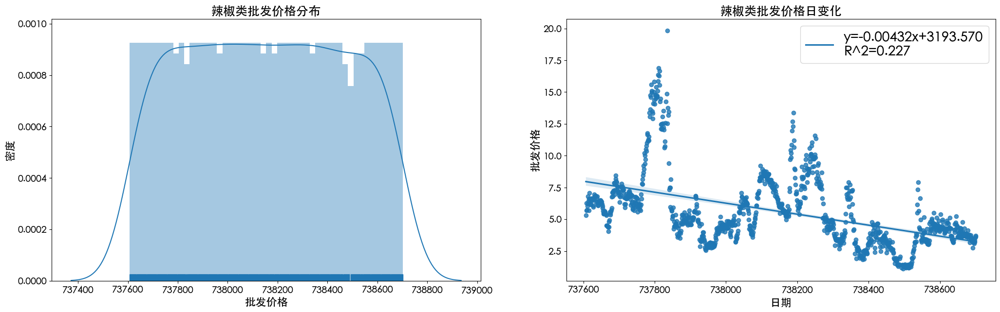

In [33]:
def function(data, name):
    # 将日期转换为日期序号
    data['日期序号'] = data['销售日期'].apply(lambda x: x.toordinal())
    
    x = np.array(data['日期序号'])
    y = np.array(data['加权批发价格'])

    # 构建回归方程
    slope, intercept, r_val, p_val, std_err = stats.linregress(x, y)

    # draw
    f, [ax1, ax2] = plt.subplots(1, 2, figsize=(25, 7))
    sns.distplot(data['日期序号'], ax=ax1, rug=True, bins=50)
    ax1.set_title(f'{name}批发价格分布', fontsize=18)
    ax1.tick_params(labelsize=14)
    ax1.set_xlabel(f'批发价格', fontsize=16)
    ax1.set_ylabel('密度', fontsize=16)
    
    sns.regplot(x='日期序号', y='加权批发价格', data=data, ax=ax2, line_kws={'label':"y={0:.5f}x+{1:.3f}\nR^2={2:.3f}".format(slope, intercept, r_val**2)})
    ax2.set_title(f'{name}批发价格日变化', fontsize=18)
    ax2.tick_params(labelsize=14)
    ax2.set_xlabel(f'日期', fontsize=16)
    ax2.set_ylabel('批发价格', fontsize=16)
    ax2.legend(loc='upper right', fontsize=20)
    plt.savefig(f'P2\\{name}需求价格曲线.png', dpi=500)
    plt.show()

    
for i in sale['分类名称'].unique():
    tem = sale_plus[sale_plus.分类名称==i]
    function(tem,i)

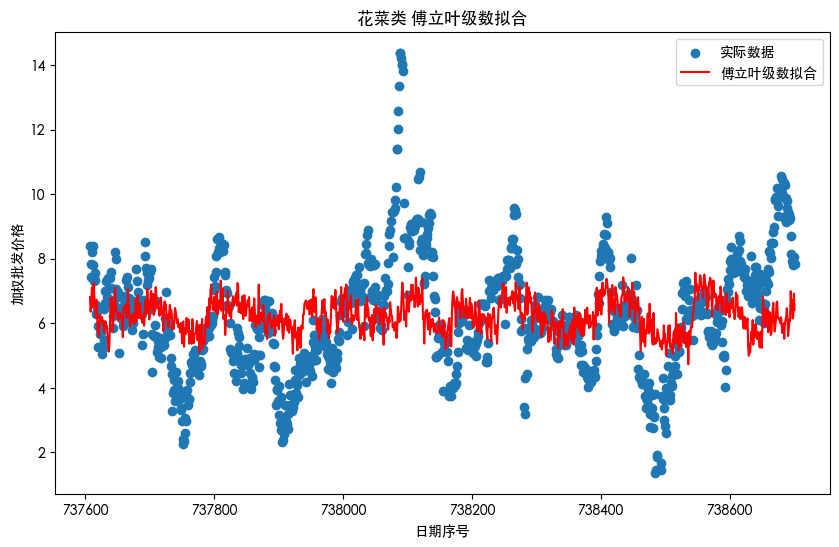

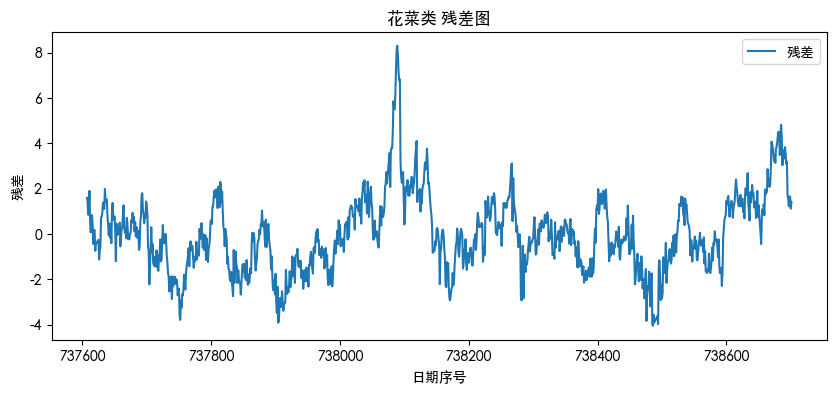

拟合参数:
Term 1: A = 20.28, B = 0.03
Term 2: A = 23.91, B = 0.03
Term 3: A = 130.82, B = -151322363.90
Term 4: A = 4.58, B = 0.03
Term 5: A = -18.70, B = 0.03
Term 6: A = 3.38, B = 331340527.12
Term 7: A = 1.37, B = -89744455.93
Term 8: A = 3.92, B = 0.03
Term 9: A = -2.33, B = 33261167.52
Term 10: A = 5.98, B = -79642377.36
Term 11: A = 9.26, B = 49439100.29
Term 12: A = 4.73, B = 0.03
Term 13: A = 4.10, B = 126140256.73
Term 14: A = -5.93, B = 154576594.68
Term 15: A = 4.28, B = -137430165.75
Term 16: A = -2.19, B = 100591601.00
Term 17: A = 7.00, B = -29329456.64
Term 18: A = 4.54, B = 23213228.07
Term 19: A = 17.75, B = 236202518.70
Term 20: A = 5.35, B = 63548247.81
预测第 1 天的批发价格: 6.42
预测第 2 天的批发价格: 6.33
预测第 3 天的批发价格: 6.51
预测第 4 天的批发价格: 6.26
预测第 5 天的批发价格: 6.05
预测第 6 天的批发价格: 6.76
预测第 7 天的批发价格: 6.89


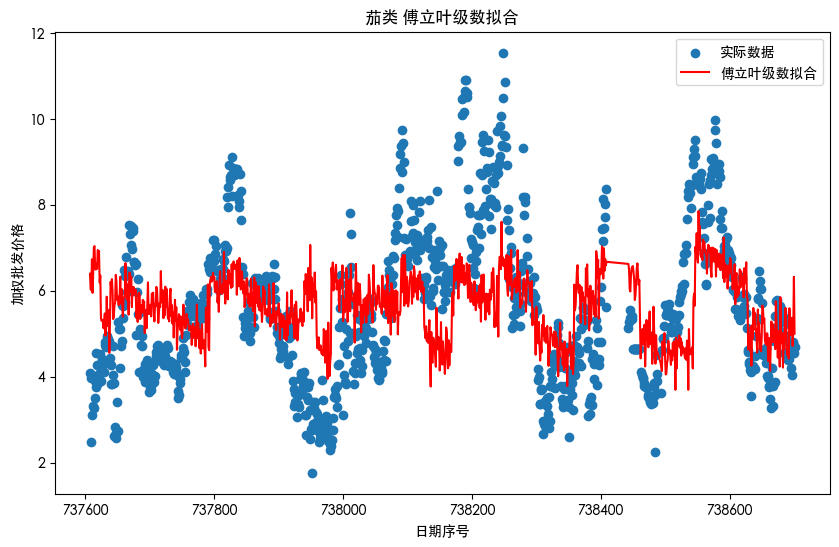

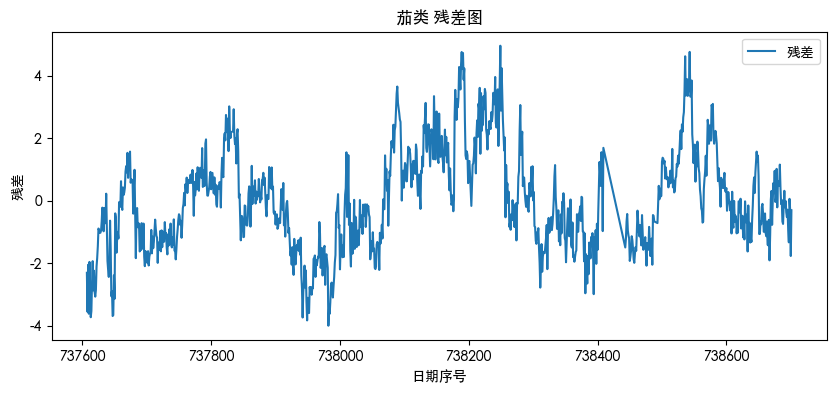

拟合参数:
Term 1: A = 3.61, B = 0.03
Term 2: A = 3.40, B = 0.03
Term 3: A = 1.00, B = 251669755.49
Term 4: A = -3.44, B = 0.03
Term 5: A = 2.80, B = 0.03
Term 6: A = 1.58, B = 85994880.07
Term 7: A = -1.61, B = -112527001.17
Term 8: A = 53.70, B = 0.03
Term 9: A = -1.27, B = -25886357.68
Term 10: A = 2.91, B = 29592011.32
Term 11: A = 1.95, B = 37875968.61
Term 12: A = 1.15, B = 0.03
Term 13: A = 0.62, B = 100819236.38
Term 14: A = 2.13, B = 117552793.41
Term 15: A = 1.49, B = 44633397.51
Term 16: A = 2.66, B = 90080943.95
Term 17: A = 2.01, B = 79478202.42
Term 18: A = 2.99, B = -280804518.01
Term 19: A = 1.65, B = -31470100.67
Term 20: A = 3.32, B = 26108120.50
预测第 1 天的批发价格: 5.65
预测第 2 天的批发价格: 6.01
预测第 3 天的批发价格: 5.28
预测第 4 天的批发价格: 5.43
预测第 5 天的批发价格: 5.07
预测第 6 天的批发价格: 6.10
预测第 7 天的批发价格: 5.53


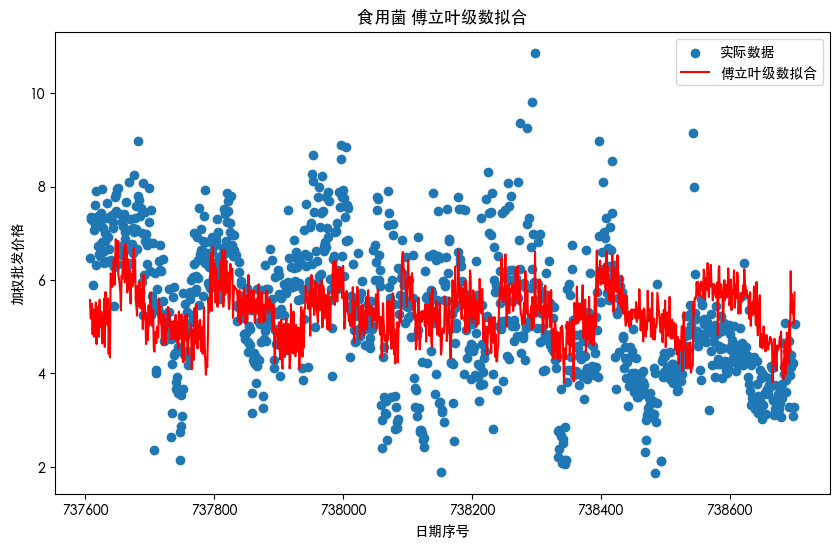

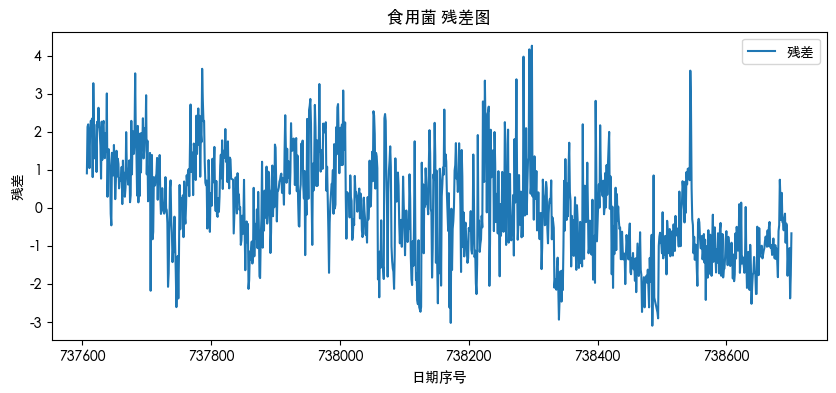

拟合参数:
Term 1: A = -1.64, B = 0.03
Term 2: A = -1.51, B = 0.03
Term 3: A = -4.27, B = -51605923.13
Term 4: A = -3.48, B = 0.03
Term 5: A = -3.40, B = 0.03
Term 6: A = 3.13, B = 284088069.73
Term 7: A = 4.45, B = 82968929.17
Term 8: A = 2.63, B = 0.03
Term 9: A = -3.52, B = 407872554.07
Term 10: A = -1.16, B = 22638890.90
Term 11: A = 6.54, B = 75303233.56
Term 12: A = -2.71, B = 0.03
Term 13: A = 2.86, B = -138758414.17
Term 14: A = -7.49, B = 82642710.02
Term 15: A = 5.27, B = 50292195.96
Term 16: A = 17.76, B = -23128442.66
Term 17: A = -2.74, B = 40661960.20
Term 18: A = 2.19, B = -13609801.89
Term 19: A = 5.74, B = 12063254.00
Term 20: A = 1.16, B = 199586125.79
预测第 1 天的批发价格: 5.02
预测第 2 天的批发价格: 5.85
预测第 3 天的批发价格: 5.61
预测第 4 天的批发价格: 5.85
预测第 5 天的批发价格: 5.31
预测第 6 天的批发价格: 5.50
预测第 7 天的批发价格: 5.84


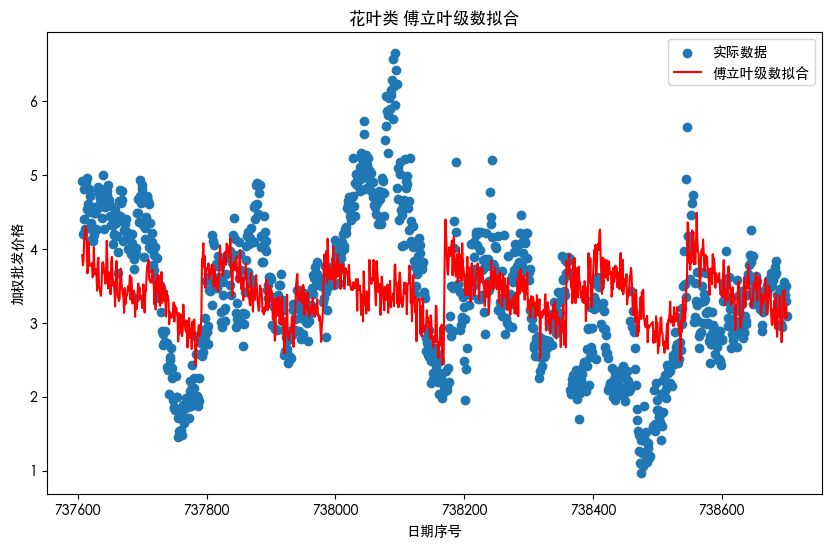

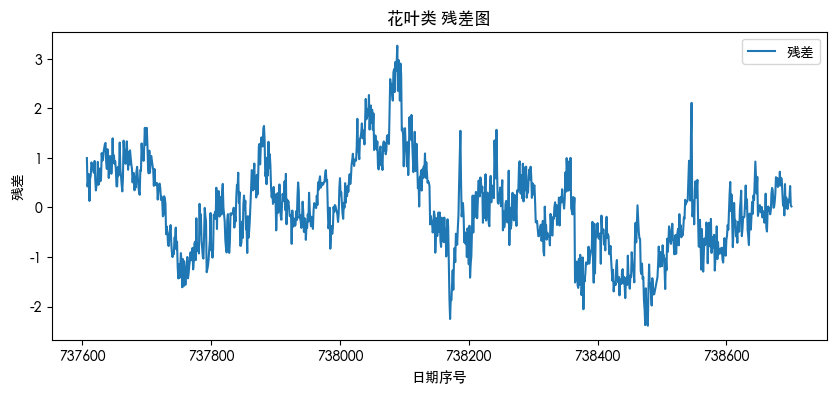

拟合参数:
Term 1: A = 2.92, B = 0.03
Term 2: A = 3.11, B = 0.03
Term 3: A = 3.22, B = -75607417.30
Term 4: A = 3.53, B = 0.03
Term 5: A = 2.21, B = -304.05
Term 6: A = 4.20, B = -26640445.60
Term 7: A = -0.79, B = -73100432.57
Term 8: A = 0.68, B = 1849.92
Term 9: A = 1.34, B = -3995874.54
Term 10: A = 2.00, B = -21787876.79
Term 11: A = -1.94, B = -4990801.01
Term 12: A = 4.53, B = 0.03
Term 13: A = 1.31, B = 0.03
Term 14: A = 2.54, B = -105190914.90
Term 15: A = -1.87, B = 27163443.50
Term 16: A = -1.59, B = -41756334.96
Term 17: A = 3.84, B = 11784752.50
Term 18: A = 12.04, B = -79003327.52
Term 19: A = -3.38, B = 22484164.09
Term 20: A = 4.11, B = 5873492.90
预测第 1 天的批发价格: 3.22
预测第 2 天的批发价格: 3.27
预测第 3 天的批发价格: 3.24
预测第 4 天的批发价格: 3.17
预测第 5 天的批发价格: 2.95
预测第 6 天的批发价格: 3.15
预测第 7 天的批发价格: 3.42


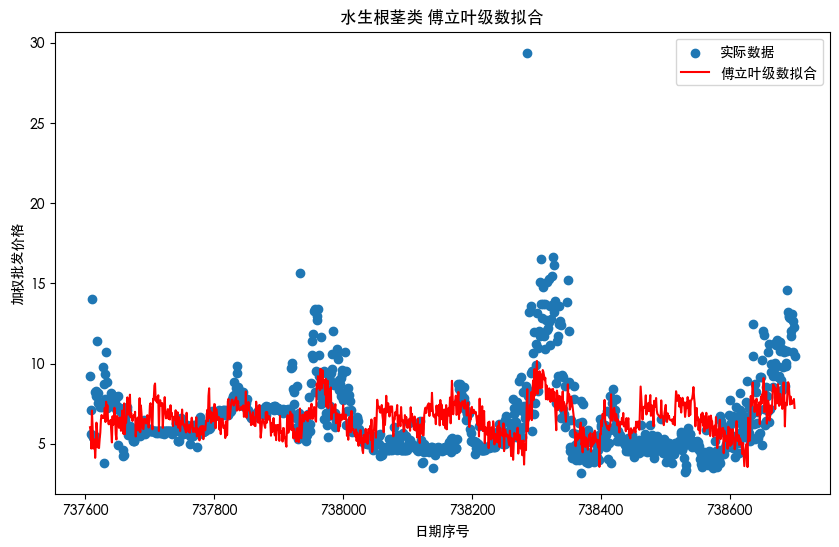

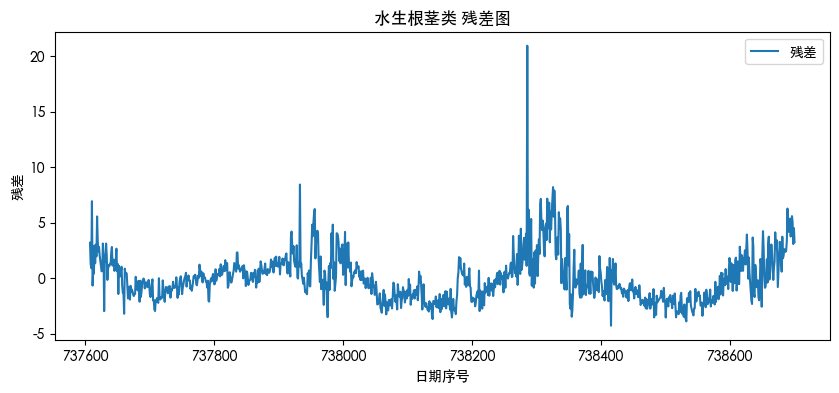

拟合参数:
Term 1: A = 3.14, B = 0.03
Term 2: A = 3.14, B = 0.03
Term 3: A = 3.22, B = -151717597.62
Term 4: A = 3.08, B = 0.03
Term 5: A = 1.91, B = 0.03
Term 6: A = 2.85, B = -7183729.74
Term 7: A = 2.15, B = -32563532.10
Term 8: A = 3.68, B = 0.03
Term 9: A = 3.89, B = 10406864.31
Term 10: A = 5.15, B = -113607720.99
Term 11: A = 5.58, B = 13202351.33
Term 12: A = 2.88, B = 0.03
Term 13: A = 3.90, B = -18221011.01
Term 14: A = 7.77, B = 121102913.23
Term 15: A = 3.50, B = 7560585.29
Term 16: A = 6.95, B = -8468019.91
Term 17: A = 2.05, B = -35573684.06
Term 18: A = 1.71, B = -10020919.47
Term 19: A = 3.71, B = 7536761.42
Term 20: A = 3.77, B = 12819753.76
预测第 1 天的批发价格: 6.78
预测第 2 天的批发价格: 7.44
预测第 3 天的批发价格: 7.06
预测第 4 天的批发价格: 7.33
预测第 5 天的批发价格: 8.30
预测第 6 天的批发价格: 8.46
预测第 7 天的批发价格: 6.86


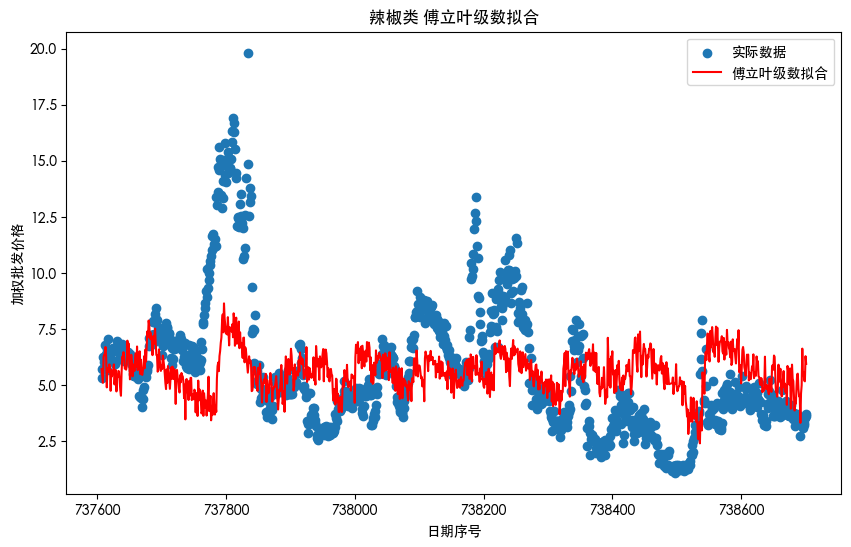

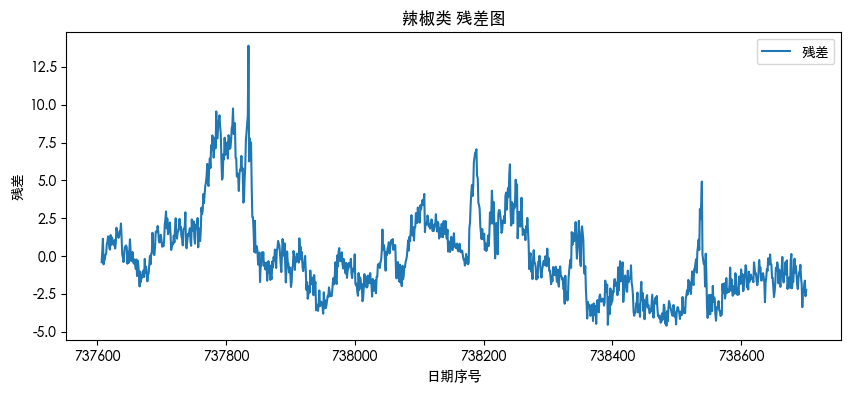

拟合参数:
Term 1: A = 2.76, B = 0.03
Term 2: A = 2.76, B = 0.03
Term 3: A = 3.52, B = -55261595.48
Term 4: A = 2.66, B = 0.03
Term 5: A = 2.49, B = 0.03
Term 6: A = 4.17, B = 0.03
Term 7: A = 3.53, B = 9598625.93
Term 8: A = 3.04, B = 0.03
Term 9: A = 2.38, B = 18731843.12
Term 10: A = 3.41, B = 27120648.81
Term 11: A = 3.15, B = -12079311.46
Term 12: A = 2.00, B = 0.03
Term 13: A = 1.28, B = 1090309116.49
Term 14: A = 1.81, B = 53379266.45
Term 15: A = 2.46, B = 11162083.46
Term 16: A = 2.09, B = -49272483.92
Term 17: A = 4.62, B = 24263711.10
Term 18: A = 3.60, B = 2524445.44
Term 19: A = 4.36, B = 8089203.62
Term 20: A = 3.41, B = 7218863.76
预测第 1 天的批发价格: 6.40
预测第 2 天的批发价格: 6.13
预测第 3 天的批发价格: 6.11
预测第 4 天的批发价格: 5.43
预测第 5 天的批发价格: 4.98
预测第 6 天的批发价格: 6.03
预测第 7 天的批发价格: 6.43
预测结果已保存到 predict_花菜类.xlsx
预测结果已保存到 predict_茄类.xlsx
预测结果已保存到 predict_食用菌.xlsx
预测结果已保存到 predict_花叶类.xlsx
预测结果已保存到 predict_水生根茎类.xlsx
预测结果已保存到 predict_辣椒类.xlsx


In [34]:


# 定义预测函数
def function(data, name):
    data['日期序号'] = data['销售日期'].apply(lambda x: x.toordinal())
    # 数据准备
    x = data['日期序号'].values.astype(float)
    y = data['加权批发价格'].values

    # 傅立叶级数模型
    def fourier_series(x, *params):
        result = np.zeros_like(x)
        for i in range(0, len(params), 2):
            A = params[i]
            B = params[i + 1]
            result += A * np.cos(2 * np.pi * (i // 2 + 1) * x) + B * np.sin(2 * np.pi * (i // 2 + 1) * x)
        return result

    # 使用curve_fit进行拟合
    num_terms = 20 # 傅立叶级数的项数
    initial_guess = [1/30] * (24 * num_terms)  # 初始猜测值
    params, _ = curve_fit(fourier_series, x, y, p0=initial_guess)

    # 生成拟合结果
    y_fit = fourier_series(x, *params)

    # 绘制结果
    plt.figure(figsize=(10, 6))
    plt.scatter(x, y, label='实际数据')
    plt.plot(x, y_fit, color='red', label='傅立叶级数拟合')
    plt.title(f'{name} 傅立叶级数拟合')
    plt.xlabel('日期序号')
    plt.ylabel('加权批发价格')
    plt.legend()

    # 计算残差
    residuals = y - y_fit
    plt.figure(figsize=(10, 4))
    plt.plot(x, residuals, label='残差')
    plt.title(f'{name} 残差图')
    plt.xlabel('日期序号')
    plt.ylabel('残差')
    plt.legend()
    plt.show()

    # 输出拟合参数
    print("拟合参数:")
    for i in range(num_terms):
        A = params[2 * i]
        B = params[2 * i + 1]
        print(f"Term {i + 1}: A = {A:.2f}, B = {B:.2f}")

    # 预测未来七天的批发价格
    max_date_ordinal = np.max(x)
    future_dates = np.arange(max_date_ordinal + 1, max_date_ordinal + 8)
    predicted_prices = fourier_series(future_dates, *params)

    # 输出预测结果
    for i in range(7):
        print(f"预测第 {i + 1} 天的批发价格: {predicted_prices[i]:.2f}")

    # 构建预测结果的DataFrame
    predicted_df = pd.DataFrame({
        '天数': future_dates,
        f'{name}预测价格': predicted_prices
    })

    return predicted_df

# 创建一个字典来存储不同品类的预测结果
predicted_results = {}

# 循环处理每个品类
for category in sale['分类名称'].unique():
    category_data = sale_plus[sale_plus.分类名称 == category]
    predicted_df = function(category_data, category)
    predicted_results[category] = predicted_df

# 保存预测结果到不同的Excel文件
for category, predicted_df in predicted_results.items():
    output_file = f'predict_{category}.xlsx'
    predicted_df.to_excel(output_file, index=False)
    print(f'预测结果已保存到 {output_file}')


## 拟合销售量-加权价格 得到两者之间的拟合方程

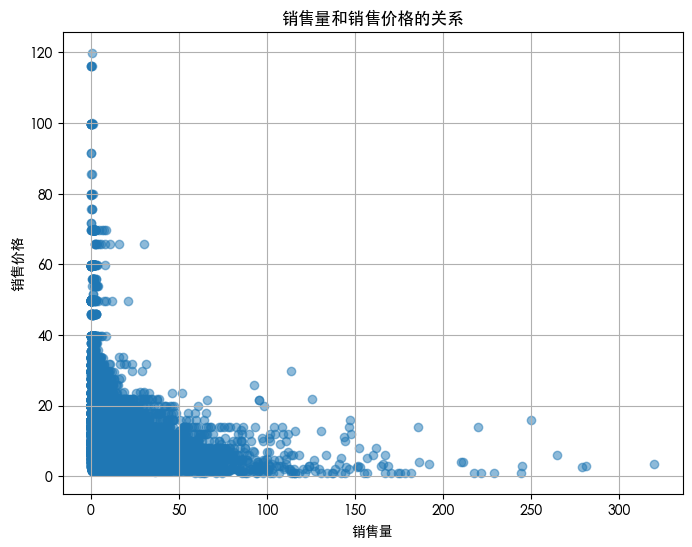

In [35]:
plt.figure(figsize=(8, 6))
plt.scatter(sale['总销量'], sale['销售价格'], alpha=0.5)
plt.xlabel('销售量')
plt.ylabel('销售价格')
plt.title('销售量和销售价格的关系')
plt.grid(True)
plt.show()


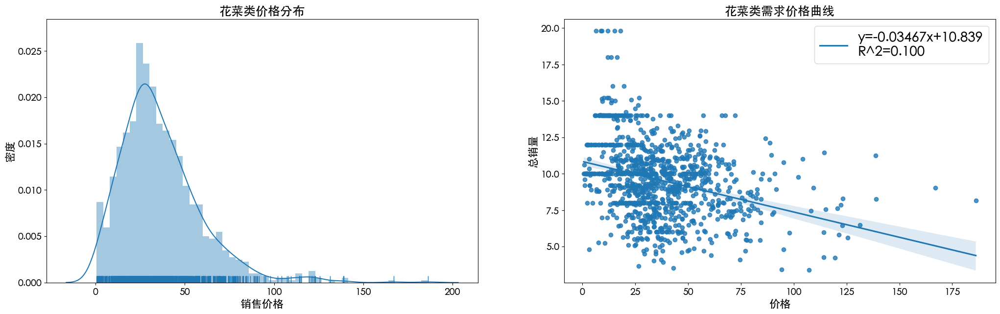

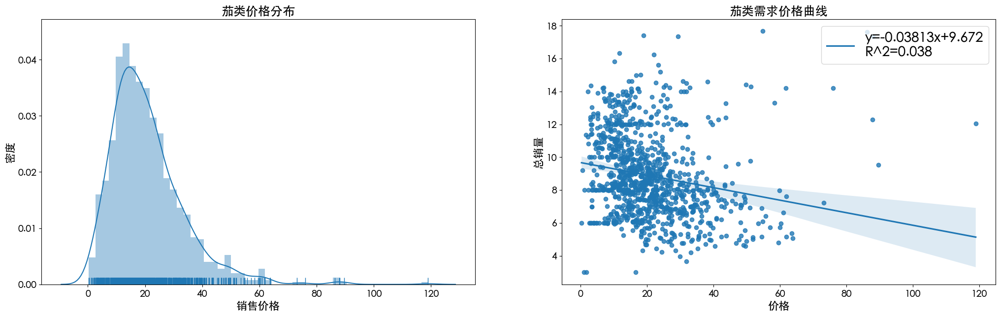

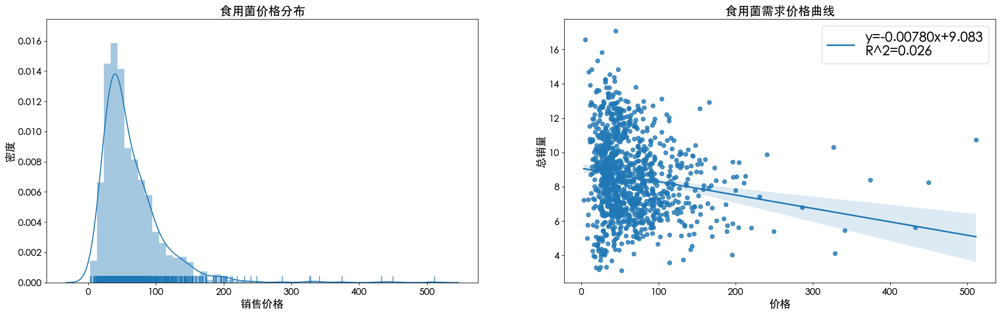

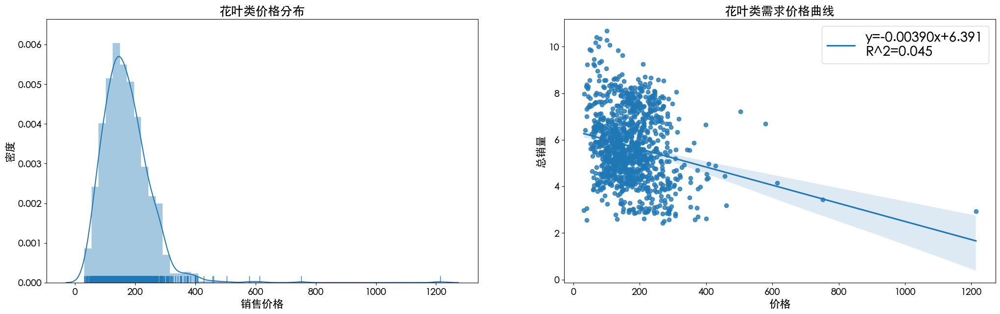

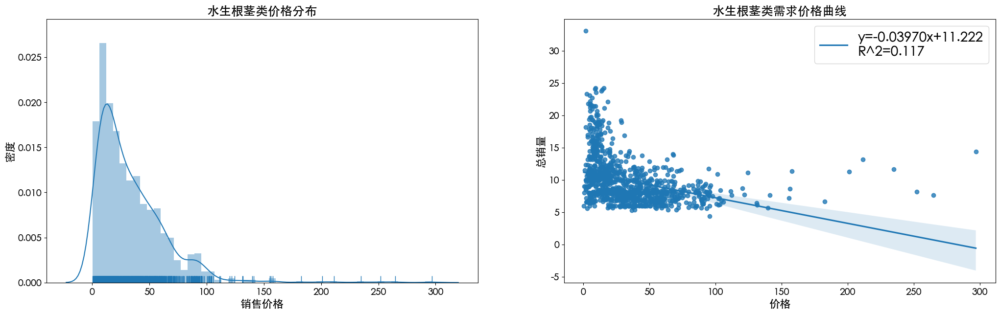

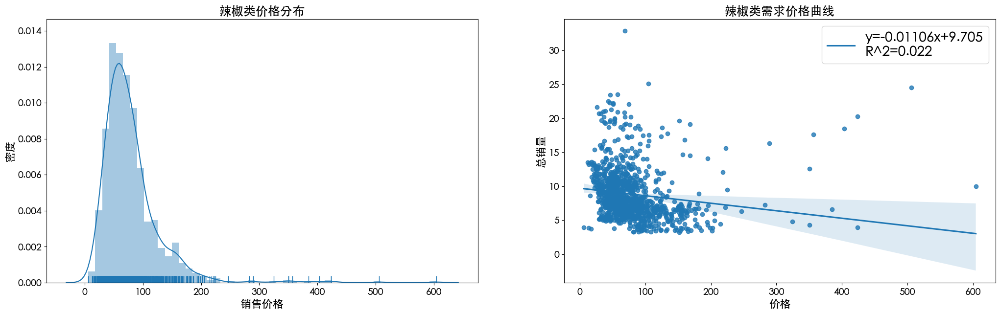

In [36]:
def function(data,name):
    # 构建回归方程
    slope , intercept , r_val , p_val,std_err = stats.linregress(data['总销量'],data['加权销售价格'])
    # draw
    f,[ax1,ax2] = plt.subplots(1,2,figsize=(25,7))
    sns.distplot(data['总销量'],ax=ax1,rug=True,bins=50)
    ax1.set_title(f'{name}价格分布',fontsize=18)
    ax1.tick_params(labelsize=14)
    ax1.set_xlabel(f'销售价格',fontsize=16)
    ax1.set_ylabel('密度',fontsize=16)
    
    sns.regplot(x='总销量',y='加权销售价格',data=data,ax=ax2,line_kws={'label':"y={0:.5f}x+{1:.3f}\nR^2={2:.3f}".format(slope,intercept,r_val**2)})
    ax2.set_title(f'{name}需求价格曲线',fontsize=18)
    ax2.tick_params(labelsize=14)
    ax2.set_xlabel(f'价格',fontsize=16)
    ax2.set_ylabel('总销量',fontsize=16)
    ax2.legend(loc='upper right' , fontsize=20)
    plt.savefig(f'P2\\{name}需求价格曲线.png',dpi=500)
    plt.show()
    
for i in sale['分类名称'].unique():
    tem = sale_plus[sale_plus.分类名称==i]
    function(tem,i)

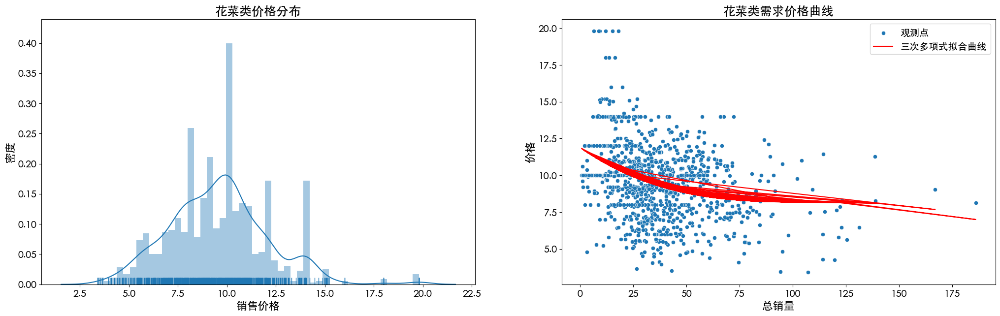

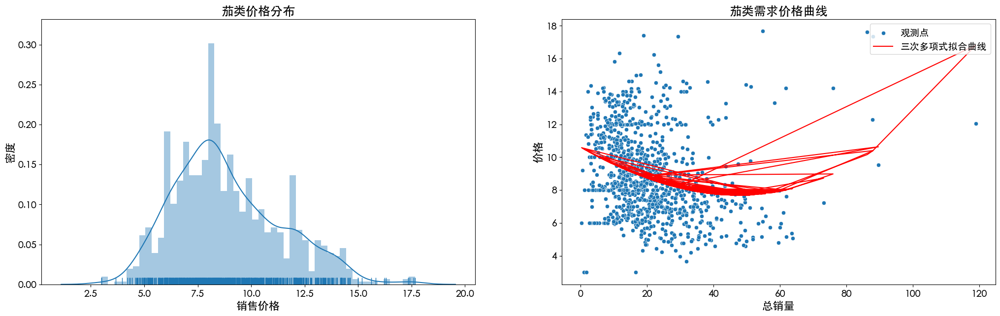

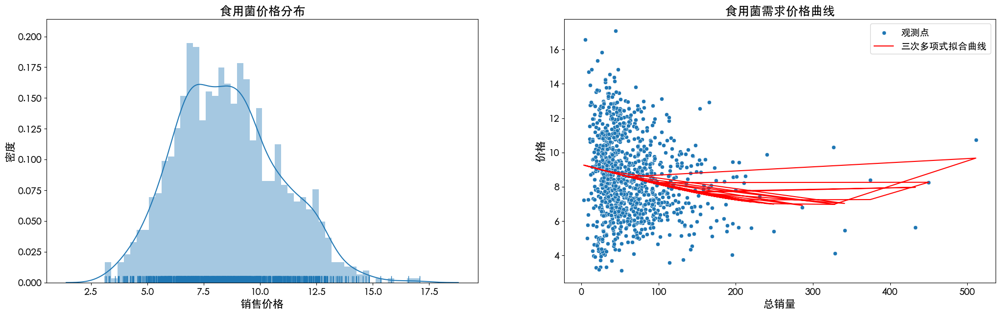

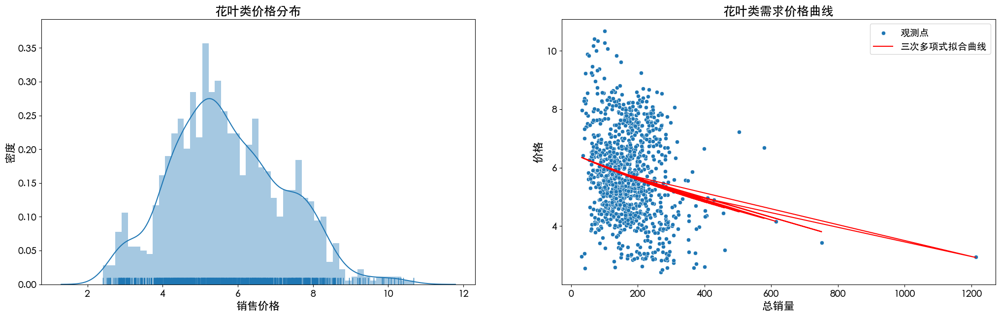

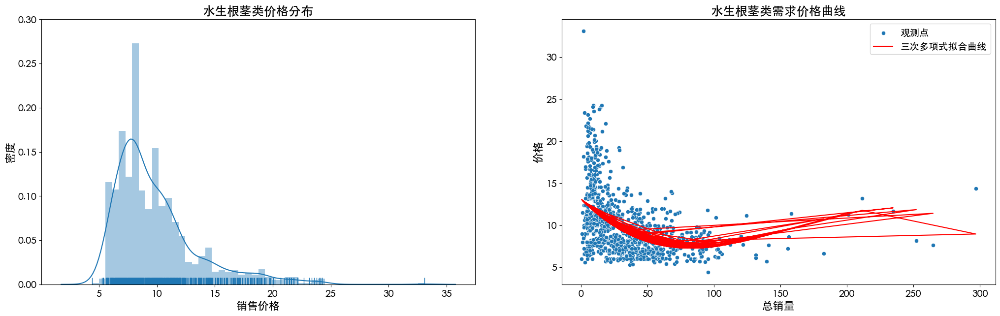

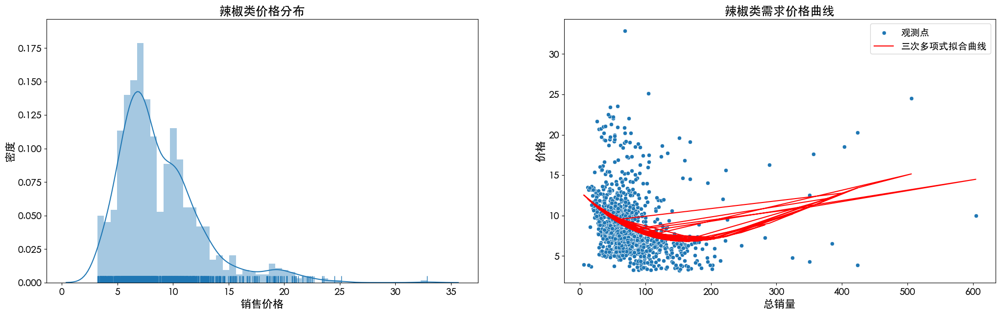

In [37]:


def function(data, name):
    # 构建回归方程
    slope, intercept, r_val, p_val, std_err = linregress(data['总销量'], data['加权销售价格'])
    
    # 计算拟合曲线的系数
    coefs = polyfit(data['总销量'], data['加权销售价格'], deg=3)  # 使用三次多项式
    
    # 计算拟合曲线的值
    x_fit = data['总销量']
    y_fit = coefs[0] + coefs[1] * x_fit + coefs[2] * x_fit**2 + coefs[3] * x_fit**3  # 三次多项式
    
    # 绘制图形
    f, [ax1, ax2] = plt.subplots(1, 2, figsize=(25, 7))
    
    # 左图：销售价格分布
    sns.distplot(data['加权销售价格'], ax=ax1, rug=True, bins=50)
    ax1.set_title(f'{name}价格分布', fontsize=18)
    ax1.tick_params(labelsize=14)
    ax1.set_xlabel('销售价格', fontsize=16)
    ax1.set_ylabel('密度', fontsize=16)
    
    # 右图：需求价格曲线
    sns.scatterplot(x='总销量', y='加权销售价格', data=data, ax=ax2, label='观测点')
    ax2.plot(x_fit, y_fit, color='red', label='三次多项式拟合曲线')
    ax2.set_title(f'{name}需求价格曲线', fontsize=18)
    ax2.tick_params(labelsize=14)
    ax2.set_xlabel('总销量', fontsize=16)
    ax2.set_ylabel('价格', fontsize=16)
    ax2.legend(loc='upper right', fontsize=14)
    
    plt.savefig(f'P3\\{name}需求价格曲线.png', dpi=500)
    plt.show()

for category in sale['分类名称'].unique():
    category_data = sale_plus[sale_plus['分类名称'] == category]
    function(category_data, category)

花菜类 多项式拟合方程：
           5             4            3             2
6.839e-10 x - 2.314e-07 x + 2.13e-05 x + 9.965e-05 x - 0.09724 x + 11.99
R-squared值：0.12675


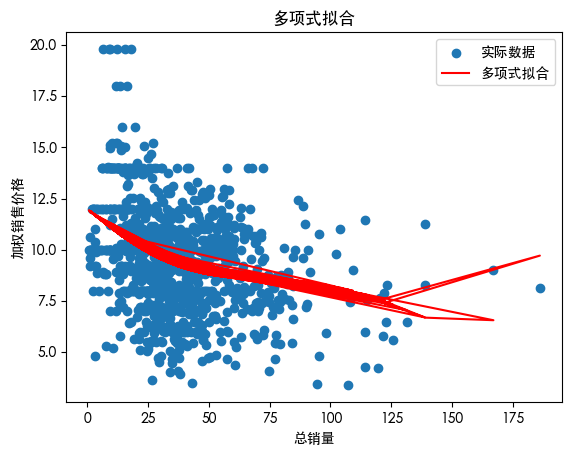

茄类 多项式拟合方程：
            5             4             3            2
-1.242e-09 x - 5.024e-07 x + 0.0001411 x - 0.008035 x + 0.07639 x + 9.531
R-squared值：0.10333


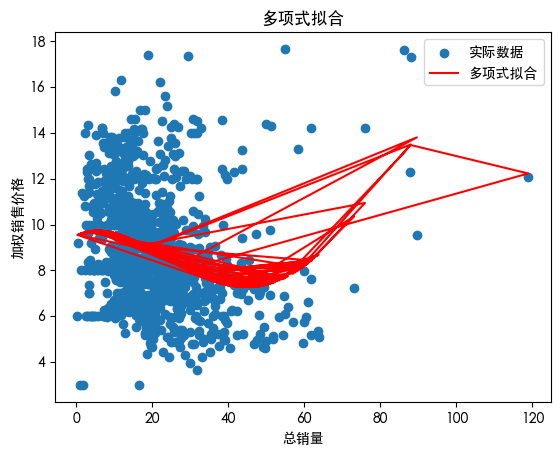

食用菌 多项式拟合方程：
           5             4             3             2
4.225e-12 x - 4.499e-09 x + 1.648e-06 x - 0.0002239 x - 0.0003227 x + 9.13
R-squared值：0.03526


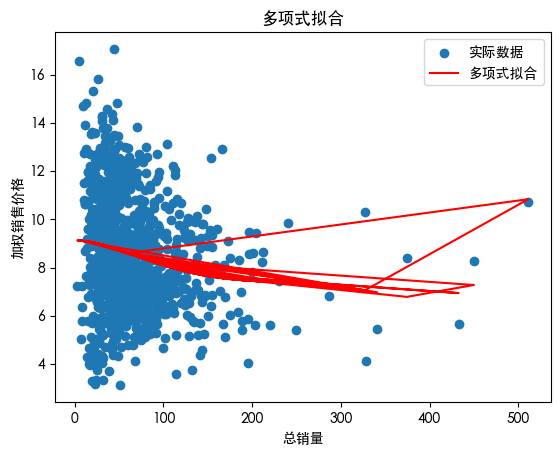

花叶类 多项式拟合方程：
            5            4             3             2
-2.741e-13 x + 6.82e-10 x - 5.629e-07 x + 0.0001907 x - 0.0306 x + 7.62
R-squared值：0.05097


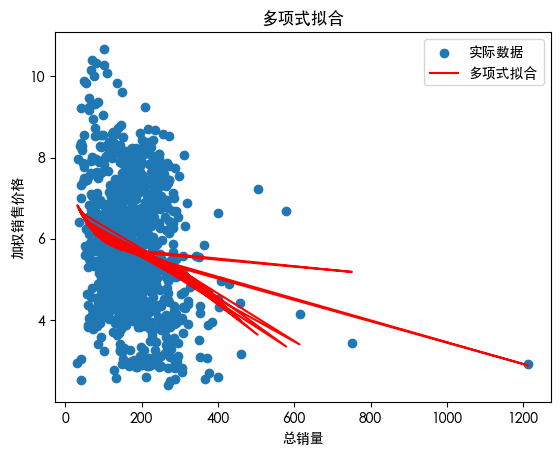

水生根茎类 多项式拟合方程：
           5             4             3            2
7.246e-12 x + 1.267e-08 x - 1.004e-05 x + 0.002369 x - 0.2066 x + 13.57
R-squared值：0.23623


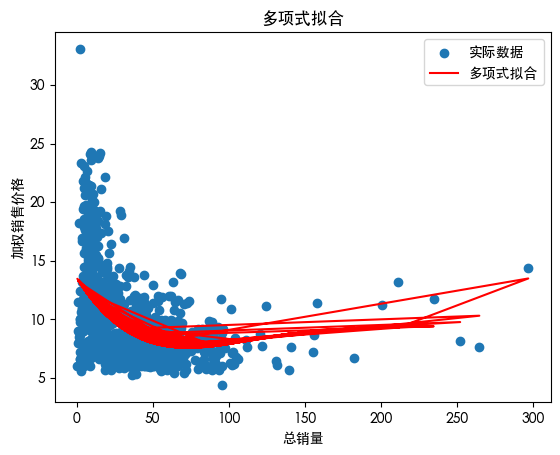

辣椒类 多项式拟合方程：
            5             4             3             2
-3.295e-12 x + 3.296e-09 x - 1.153e-06 x + 0.0003371 x - 0.07316 x + 12.56
R-squared值：0.11480


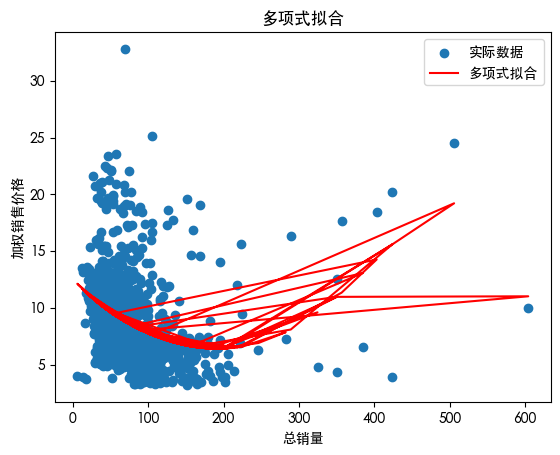

In [38]:
def function(data, name):
    # 假设你的自变量和因变量数据分别为 x 和 y
    x = data['总销量'].values
    y = data['加权销售价格'].values

    # 进行多项式回归拟合，这里使用3次多项式作为示例
    degree = 5 # 3次多项式
    coeffs = np.polyfit(x, y, degree)

    # 构建多项式方程
    p = np.poly1d(coeffs)

    # 生成拟合结果
    y_fit = p(x)

    # 输出多项式方程
    print(f'{name} 多项式拟合方程：')
    print(p)

    residuals = y - y_fit
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((y - np.mean(y))**2)
    r_squared = 1 - (ss_res / ss_tot)

    print(f'R-squared值：{r_squared:.5f}')
    # 绘制拟合结果
    plt.scatter(x, y, label='实际数据')
    plt.plot(x, y_fit, color='red', label='多项式拟合')
    plt.title('多项式拟合')
    plt.xlabel('总销量')
    plt.ylabel('加权销售价格')
    plt.legend()
    plt.show()

for category in sale['分类名称'].unique():
    category_data = sale_plus[sale_plus['分类名称'] == category]
    function(category_data, category)


[[Model]]
    Model(nonlinear_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 71
    # data points      = 1083
    # variables        = 3
    chi-square         = 5944.76999
    reduced chi-square = 5.50441666
    Akaike info crit   = 1850.10735
    Bayesian info crit = 1865.06982
    R-squared          = 0.12400824
[[Variables]]
    a:  4.18493386 +/- 0.35514730 (8.49%) (init = 1)
    b:  0.02976690 +/- 0.00711357 (23.90%) (init = 1)
    c:  7.88686439 +/- 0.38494561 (4.88%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(b, c) = +0.9165
    C(a, c) = -0.6153
    C(a, b) = -0.3028


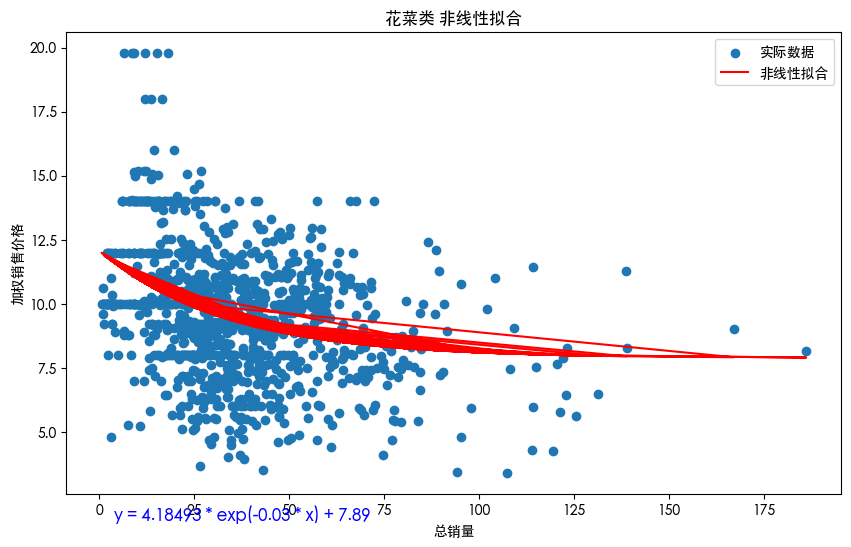

[[Model]]
    Model(nonlinear_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 21
    # data points      = 1050
    # variables        = 3
    chi-square         = 6675.76951
    reduced chi-square = 6.37609313
    Akaike info crit   = 1948.17903
    Bayesian info crit = 1963.04867
    R-squared          = -5.7954e-14
[[Variables]]
    a:  30.4004445 +/- 1.0053e+22 (33068089121107475431424.00%) (init = 1)
    b:  106.502807 +/- 1.1715e+21 (1099949759281844584448.00%) (init = 1)
    c:  8.87879110 +/- 0.07800062 (0.88%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = +1.0000


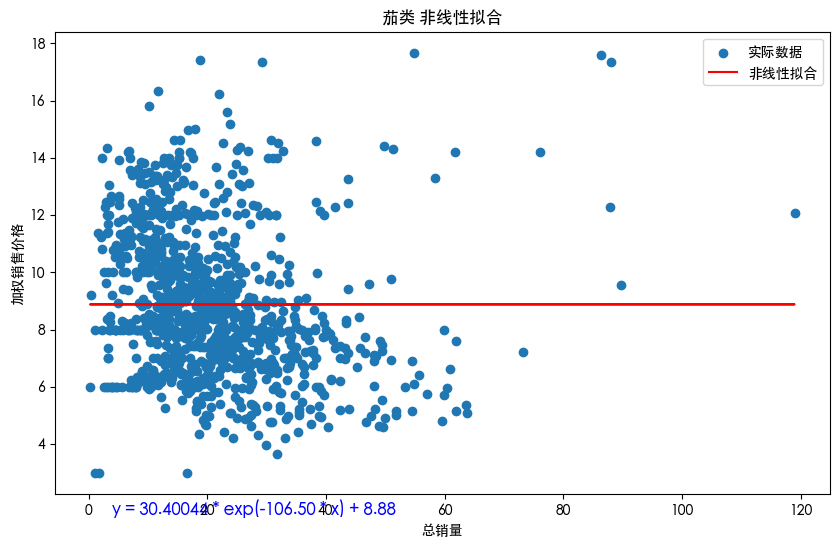

[[Model]]
    Model(nonlinear_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 17
    # data points      = 1085
    # variables        = 3
    chi-square         = 5824.59172
    reduced chi-square = 5.38317165
    Akaike info crit   = 1829.35218
    Bayesian info crit = 1844.32018
    R-squared          = -2.2204e-16
##  Warning: uncertainties could not be estimated:
[[Variables]]
    a:  1670.89027 (init = 1)
    b:  542.822253 (init = 1)
    c:  8.58130655 (init = 1)


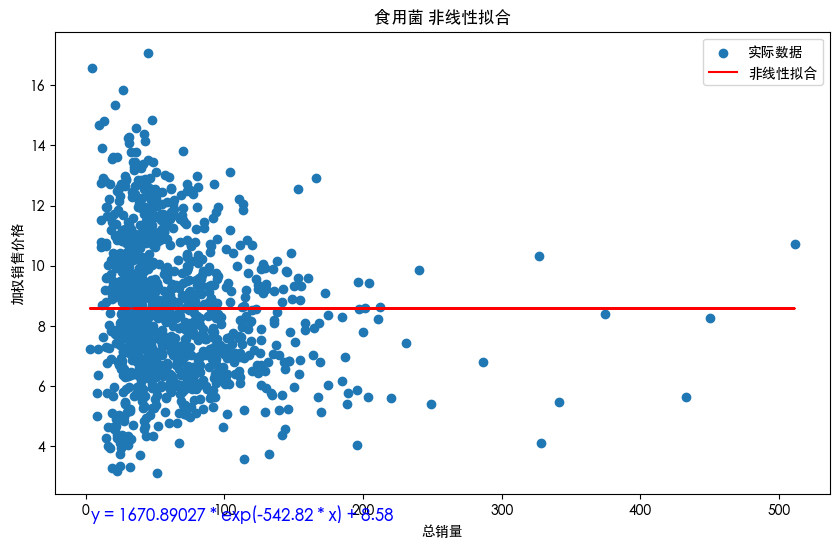

[[Model]]
    Model(nonlinear_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 17
    # data points      = 1085
    # variables        = 3
    chi-square         = 2441.11882
    reduced chi-square = 2.25611721
    Akaike info crit   = 885.800980
    Bayesian info crit = 900.768985
    R-squared          = 0.00000000
##  Warning: uncertainties could not be estimated:
    a:  at initial value
    b:  at initial value
[[Variables]]
    a:  1.00000000 (init = 1)
    b:  1.00000000 (init = 1)
    c:  5.72539165 (init = 1)


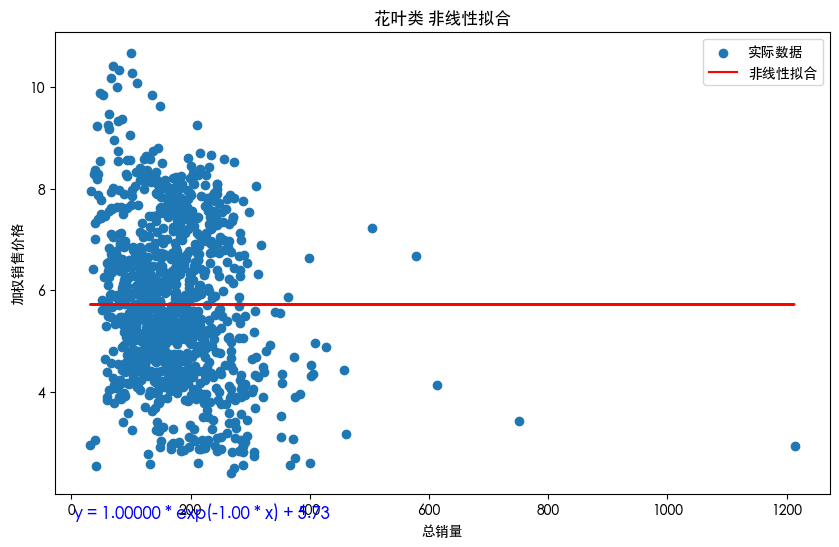

[[Model]]
    Model(nonlinear_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 13
    # data points      = 1085
    # variables        = 3
    chi-square         = 14043.5352
    reduced chi-square = 12.9792377
    Akaike info crit   = 2784.23166
    Bayesian info crit = 2799.19966
    R-squared          = 0.00000000
##  Warning: uncertainties could not be estimated:
[[Variables]]
    a:  52.6253723 (init = 1)
    b:  527.967873 (init = 1)
    c:  9.87032189 (init = 1)


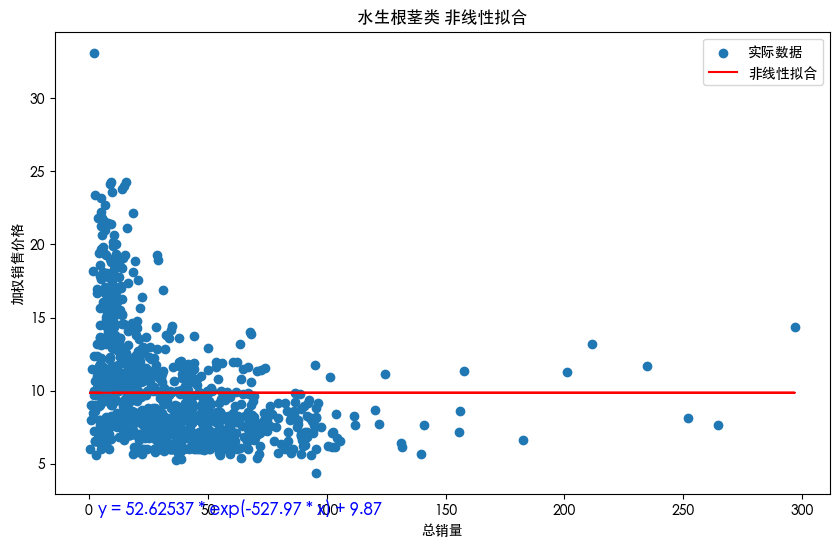

[[Model]]
    Model(nonlinear_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 13
    # data points      = 1085
    # variables        = 3
    chi-square         = 15587.5781
    reduced chi-square = 14.4062644
    Akaike info crit   = 2897.41035
    Bayesian info crit = 2912.37836
    R-squared          = 0.00000000
##  Warning: uncertainties could not be estimated:
[[Variables]]
    a:  965068.932 (init = 1)
    b:  158701.056 (init = 1)
    c:  8.82679681 (init = 1)


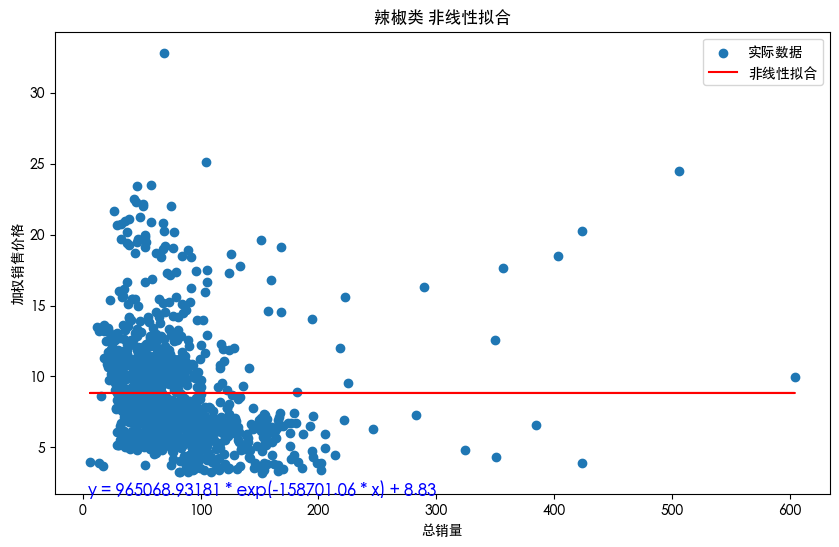

In [39]:


def function(data, name):
    # 定义非线性模型
    def nonlinear_model(x, a, b, c):
        return a * np.exp(-b * x) + c
    # 提取数据
    x_data = data['总销量'].values
    y_data = data['加权销售价格'].values

    # 创建模型对象
    model = Model(nonlinear_model)

    # 创建参数对象并设置初始猜测值
    params = Parameters()
    params.add('a', value=1.0, min=0.0)
    params.add('b', value=1.0, min=0.0)
    params.add('c', value=1.0, min=0.0)


    # 使用lmfit进行拟合
    result = model.fit(y_data, params, x=x_data,nan_policy='omit')

    # 输出拟合结果，包括参数值
    print(result.fit_report())

    # 提取拟合参数值
    a_fit = result.params['a'].value
    b_fit = result.params['b'].value
    c_fit = result.params['c'].value

    # 构建拟合方程
    fit_equation = f'y = {a_fit:.5f} * exp(-{b_fit:.2f} * x) + {c_fit:.2f}'

    # 绘制拟合结果，并在图表上显示方程
    plt.figure(figsize=(10, 6))
    plt.scatter(x_data, y_data, label='实际数据')
    plt.plot(x_data, result.best_fit, color='red', label='非线性拟合')
    plt.title(f'{name} 非线性拟合')
    plt.xlabel('总销量')
    plt.ylabel('加权销售价格')
    plt.text(4, 1.5, fit_equation, fontsize=12, color='blue')  # 在图表上显示方程
    plt.legend()
    plt.show()


for category in sale['分类名称'].unique():
    category_data = sale_plus[sale_plus['分类名称'] == category]
    function(category_data, category)


[[Model]]
    Model(inverse_proportion_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 7
    # data points      = 1083
    # variables        = 2
    chi-square         = 6673.46804
    reduced chi-square = 6.17342094
    Akaike info crit   = 1973.33229
    Bayesian info crit = 1983.30727
    R-squared          = 0.01663092
[[Variables]]
    a:  3.19265496 +/- 0.74668819 (23.39%) (init = 1)
    b:  9.40340867 +/- 0.08528960 (0.91%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.4652


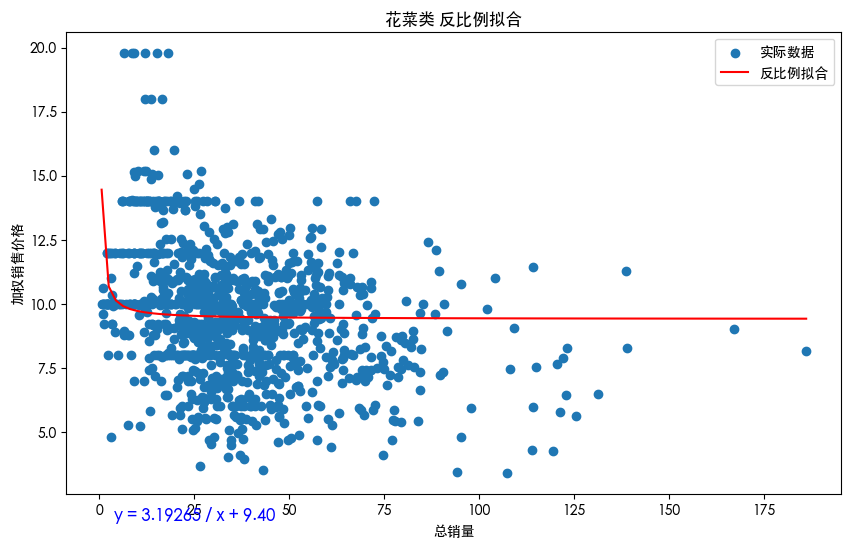

[[Model]]
    Model(inverse_proportion_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 7
    # data points      = 1050
    # variables        = 2
    chi-square         = 6668.53635
    reduced chi-square = 6.36310720
    Akaike info crit   = 1945.04075
    Bayesian info crit = 1954.95384
    R-squared          = 0.00108349
[[Variables]]
    a:  0.54117621 +/- 0.50758552 (93.79%) (init = 1)
    b:  8.83571308 +/- 0.08770746 (0.99%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.4607


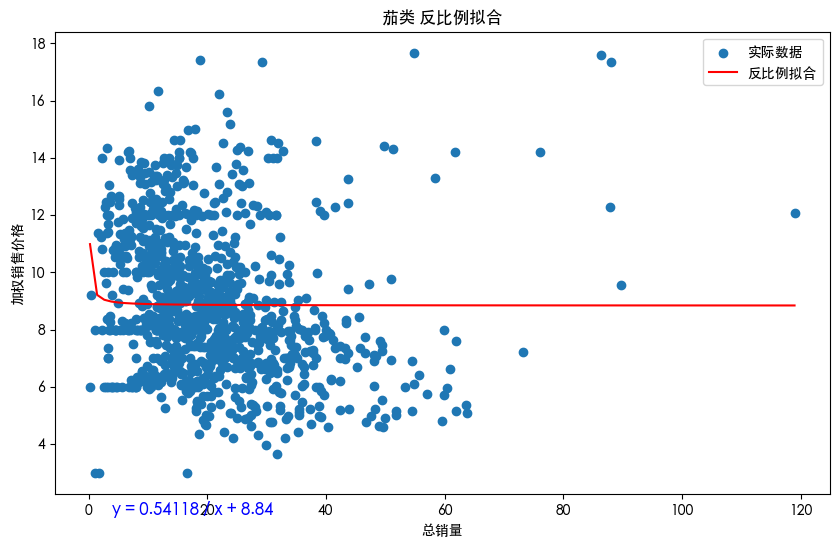

[[Model]]
    Model(inverse_proportion_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 7
    # data points      = 1085
    # variables        = 2
    chi-square         = 5730.94229
    reduced chi-square = 5.29172880
    Akaike info crit   = 1809.76548
    Bayesian info crit = 1819.74415
    R-squared          = 0.01607828
[[Variables]]
    a:  15.5342657 +/- 3.69263972 (23.77%) (init = 1)
    b:  8.21965642 +/- 0.11075919 (1.35%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.7762


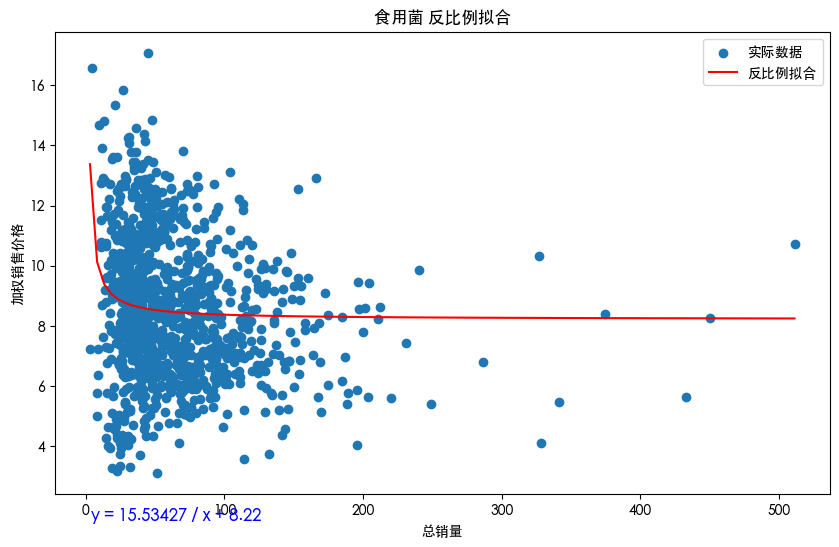

[[Model]]
    Model(inverse_proportion_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 7
    # data points      = 1085
    # variables        = 2
    chi-square         = 2345.35396
    reduced chi-square = 2.16560846
    Akaike info crit   = 840.379134
    Bayesian info crit = 850.357805
    R-squared          = 0.03922991
[[Variables]]
    a:  77.2587367 +/- 11.6180832 (15.04%) (init = 1)
    b:  5.16679032 +/- 0.09514338 (1.84%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.8829


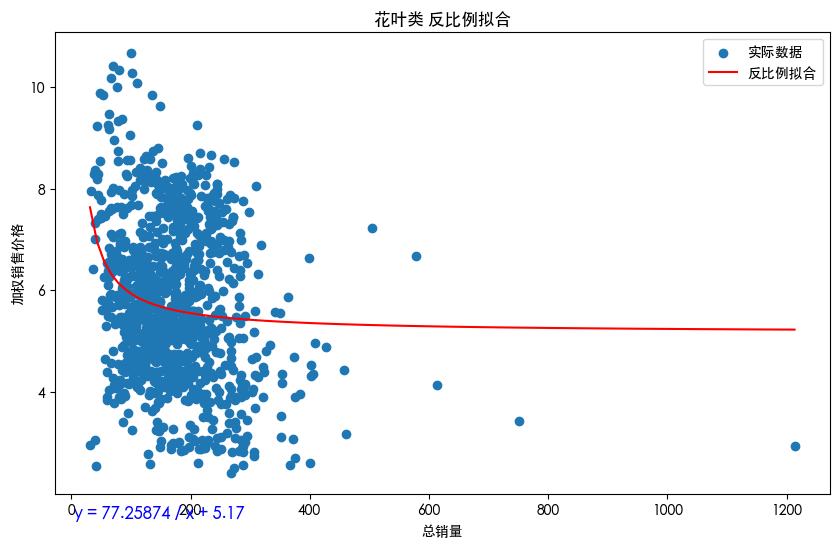

[[Model]]
    Model(inverse_proportion_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 7
    # data points      = 1085
    # variables        = 2
    chi-square         = 13365.6475
    reduced chi-square = 12.3413181
    Akaike info crit   = 2728.55197
    Bayesian info crit = 2738.53064
    R-squared          = 0.04827045
[[Variables]]
    a:  7.30168594 +/- 0.98520145 (13.49%) (init = 1)
    b:  9.34687051 +/- 0.12791728 (1.37%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.5521


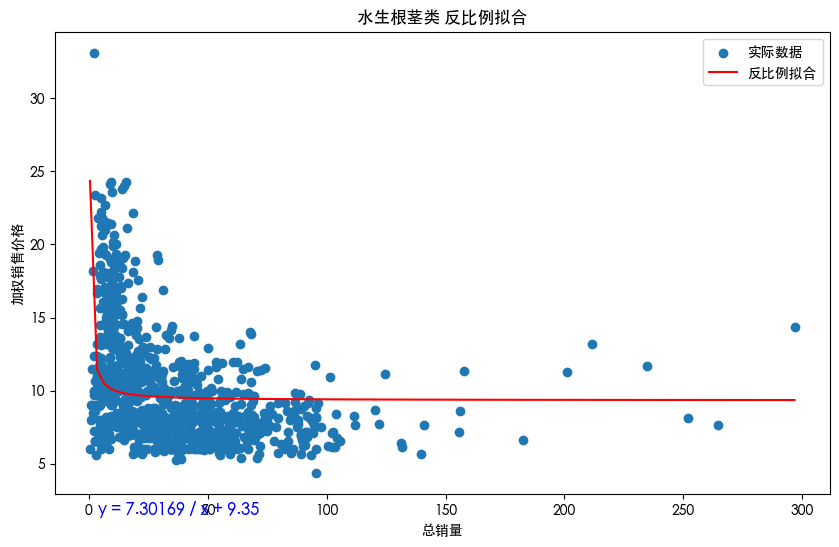

[[Model]]
    Model(inverse_proportion_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 7
    # data points      = 1085
    # variables        = 2
    chi-square         = 14842.4532
    reduced chi-square = 13.7049429
    Akaike info crit   = 2842.26403
    Bayesian info crit = 2852.24270
    R-squared          = 0.04780248
[[Variables]]
    a:  80.4856574 +/- 10.9154734 (13.56%) (init = 1)
    b:  7.47807429 +/- 0.21468296 (2.87%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.8520


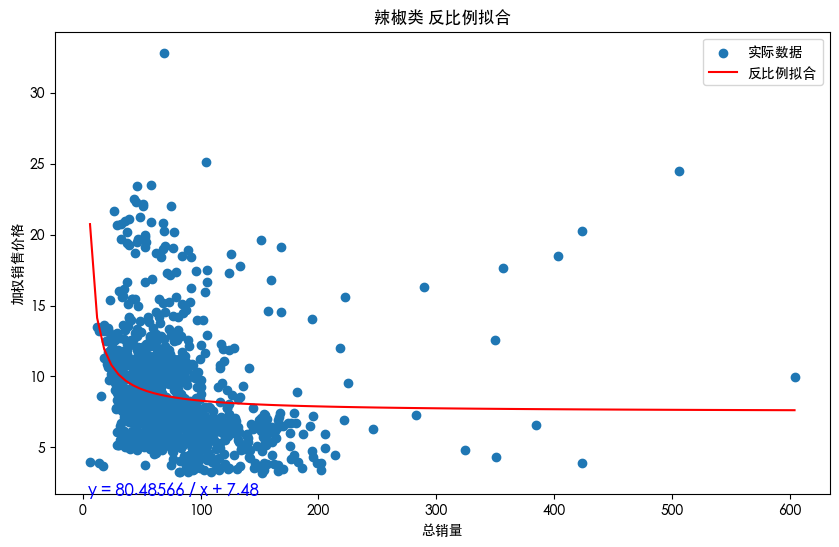

In [40]:


def function(data, name):
    # 定义反比例模型
    def inverse_proportion_model(x, a, b):
        return a / x + b

    # 提取数据
    x_data = data['总销量'].values
    y_data = data['加权销售价格'].values

    # 创建模型对象
    model = Model(inverse_proportion_model)

    # 创建参数对象并设置初始猜测值
    params = Parameters()
    params.add('a', value=1.0)
    params.add('b', value=1.0)

    # 使用lmfit进行拟合
    result = model.fit(y_data, params, x=x_data)

    # 输出拟合结果，包括参数值
    print(result.fit_report())

    # 提取拟合参数值
    a_fit = result.params['a'].value
    b_fit = result.params['b'].value

    # 构建拟合方程
    fit_equation = f'y = {a_fit:.5f} / x + {b_fit:.2f}'

    # 绘制拟合结果，并在图表上显示方程
    plt.figure(figsize=(10, 6))
    plt.scatter(x_data, y_data, label='实际数据')
    x_fit = np.linspace(min(x_data), max(x_data), 100)
    y_fit = inverse_proportion_model(x_fit, a_fit, b_fit)
    plt.plot(x_fit, y_fit, color='red', label='反比例拟合')
    plt.title(f'{name} 反比例拟合')
    plt.xlabel('总销量')
    plt.ylabel('加权销售价格')
    plt.text(4, 1.5, fit_equation, fontsize=12, color='blue')  # 在图表上显示方程
    plt.legend()
    plt.show()

for category in sale['分类名称'].unique():
    category_data = sale_plus[sale_plus['分类名称'] == category]
    function(category_data, category)


[[Model]]
    Model(negative_power_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 9
    # data points      = 1083
    # variables        = 3
    chi-square         = 6454.91565
    reduced chi-square = 5.97677375
    Akaike info crit   = 1939.27087
    Bayesian info crit = 1954.23334
    R-squared          = 0.04883571
[[Variables]]
    a: -9.49416114 +/- 1.57004544 (16.54%) (init = 1)
    b:  11.7603169 +/- 1.59599263 (13.57%) (init = 1)
    c:  9.07205283 +/- 0.10022585 (1.10%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.8877
    C(b, c) = -0.6647
    C(a, c) = +0.5467


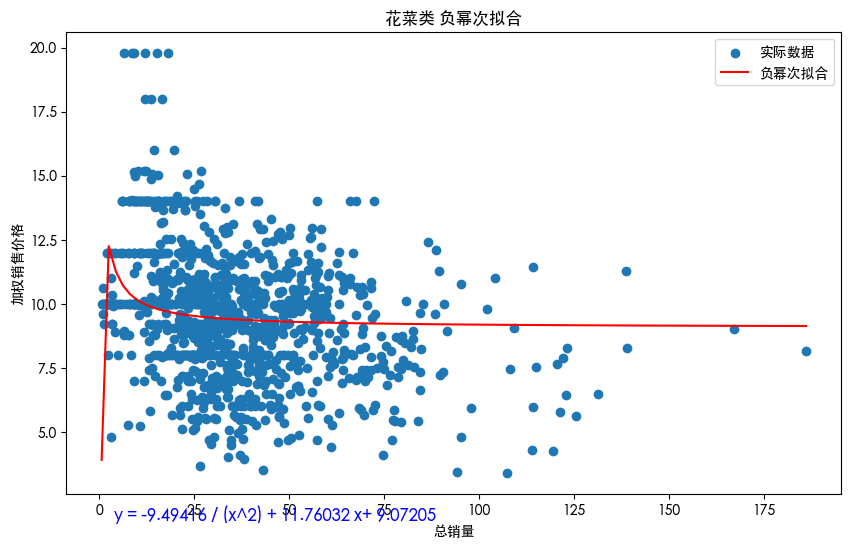

[[Model]]
    Model(negative_power_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 9
    # data points      = 1050
    # variables        = 3
    chi-square         = 6543.84449
    reduced chi-square = 6.25009025
    Akaike info crit   = 1927.22141
    Bayesian info crit = 1942.09104
    R-squared          = 0.01976177
[[Variables]]
    a: -1.50589308 +/- 0.33714618 (22.39%) (init = 1)
    b:  4.94749822 +/- 1.10736796 (22.38%) (init = 1)
    c:  8.52992899 +/- 0.11064712 (1.30%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.8909
    C(b, c) = -0.7156
    C(a, c) = +0.6187


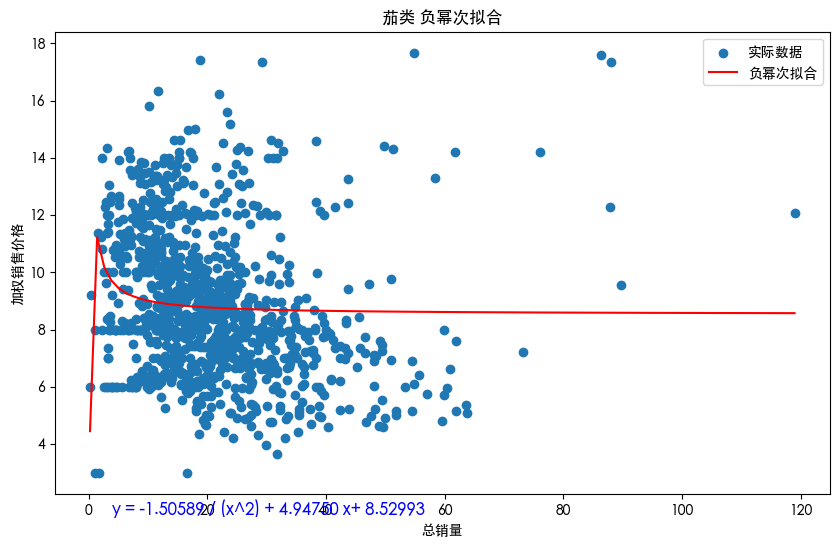

[[Model]]
    Model(negative_power_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 9
    # data points      = 1085
    # variables        = 3
    chi-square         = 5686.84285
    reduced chi-square = 5.25586215
    Akaike info crit   = 1803.38414
    Bayesian info crit = 1818.35215
    R-squared          = 0.02364953
[[Variables]]
    a: -87.6335183 +/- 30.2535049 (34.52%) (init = 1)
    b:  29.8106476 +/- 6.15095680 (20.63%) (init = 1)
    c:  7.96613253 +/- 0.14087158 (1.77%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(b, c) = -0.8617
    C(a, b) = -0.8013
    C(a, c) = +0.6213


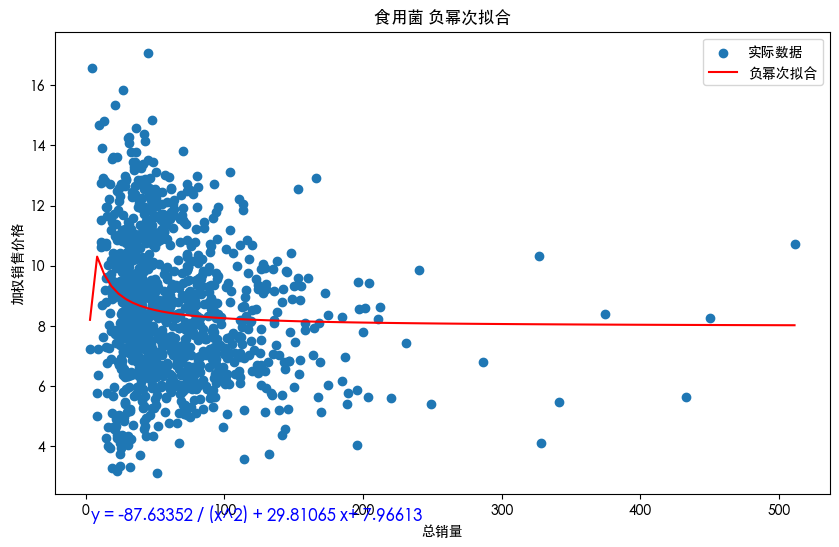

[[Model]]
    Model(negative_power_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 9
    # data points      = 1085
    # variables        = 3
    chi-square         = 2338.31787
    reduced chi-square = 2.16110709
    Akaike info crit   = 839.119232
    Bayesian info crit = 854.087238
    R-squared          = 0.04211222
[[Variables]]
    a: -2666.76826 +/- 1477.94392 (55.42%) (init = 1)
    b:  137.846230 +/- 35.5272532 (25.77%) (init = 1)
    c:  4.90757017 +/- 0.17225612 (3.51%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(b, c) = -0.9474
    C(a, b) = -0.9451
    C(a, c) = +0.8340


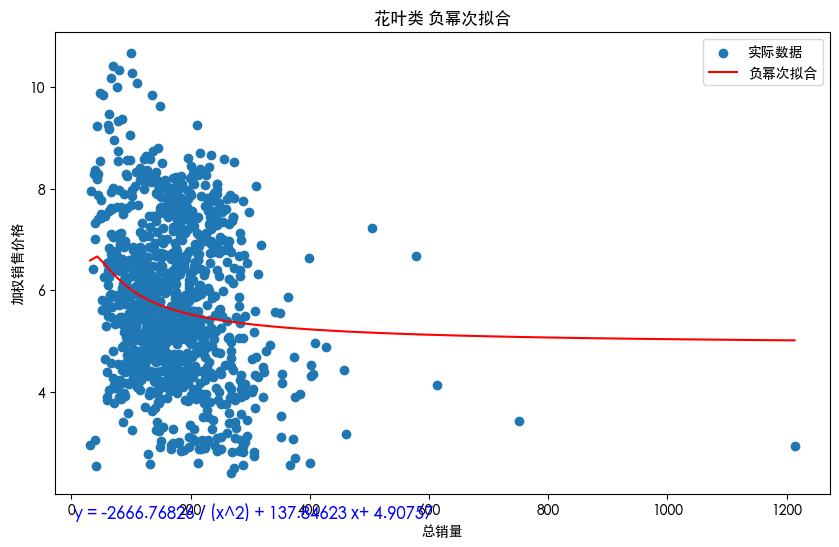

[[Model]]
    Model(negative_power_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 9
    # data points      = 1085
    # variables        = 3
    chi-square         = 12271.4712
    reduced chi-square = 11.3414706
    Akaike info crit   = 2637.88142
    Bayesian info crit = 2652.84943
    R-squared          = 0.12618361
[[Variables]]
    a: -11.8694028 +/- 1.20842556 (10.18%) (init = 1)
    b:  19.5636653 +/- 1.56539864 (8.00%) (init = 1)
    c:  8.66791556 +/- 0.14076709 (1.62%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.7975
    C(b, c) = -0.6818
    C(a, c) = +0.4911


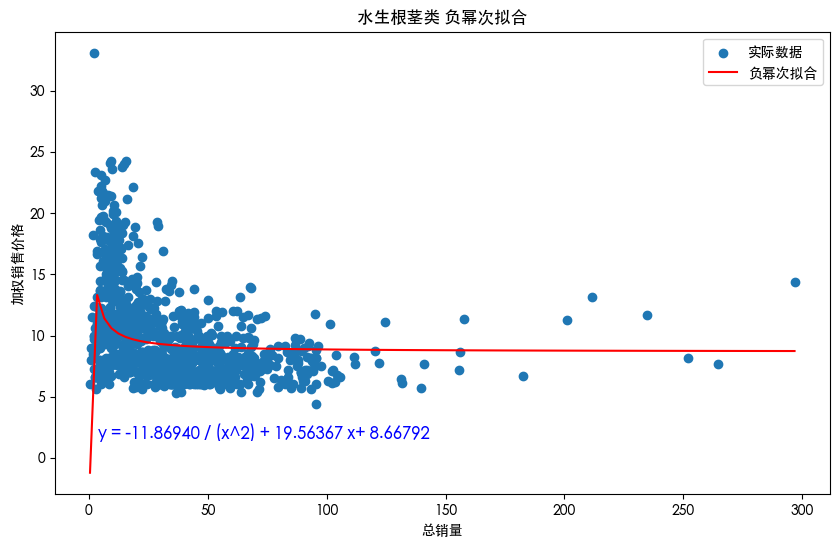

[[Model]]
    Model(negative_power_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 9
    # data points      = 1085
    # variables        = 3
    chi-square         = 14356.4028
    reduced chi-square = 13.2683945
    Akaike info crit   = 2808.13841
    Bayesian info crit = 2823.10642
    R-squared          = 0.07898439
[[Variables]]
    a: -1202.26518 +/- 198.640973 (16.52%) (init = 1)
    b:  172.573621 +/- 18.6238550 (10.79%) (init = 1)
    c:  6.39998980 +/- 0.27631268 (4.32%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(b, c) = -0.9023
    C(a, b) = -0.8170
    C(a, c) = +0.6446


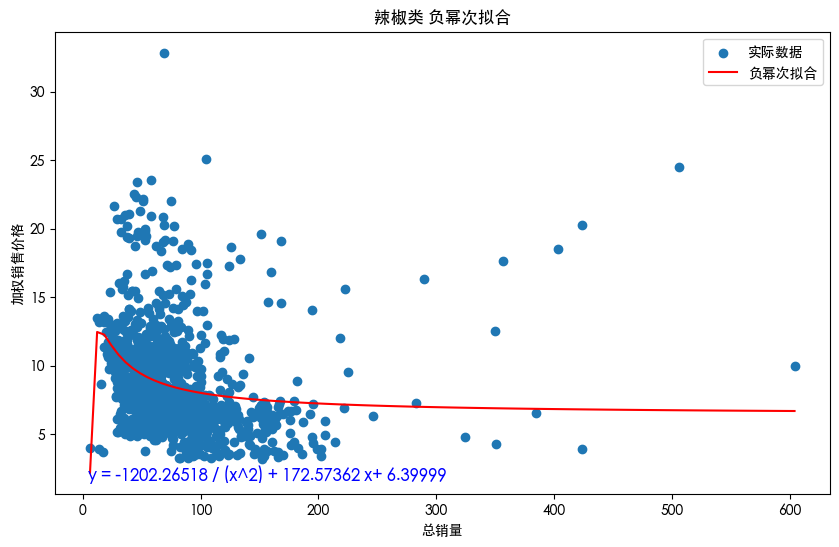

In [41]:



def function(data, name):
    # 定义负幂次模型
    def negative_power_model(x, a, b, c):
        return a / (x**2) + b / (x) + c

    # 提取数据
    x_data = data['总销量'].values
    y_data = data['加权销售价格'].values

    # 创建模型对象
    model = Model(negative_power_model)

    # 创建参数对象并设置初始猜测值
    params = Parameters()
    params.add('a', value=1.0)
    params.add('b', value=1.0)
    params.add('c', value=1.0) 

    # 使用lmfit进行拟合
    result = model.fit(y_data, params, x=x_data)

    # 输出拟合结果，包括参数值
    print(result.fit_report())

    # 提取拟合参数值
    a_fit = result.params['a'].value
    b_fit = result.params['b'].value
    c_fit = result.params['c'].value
    # 构建拟合方程
    fit_equation = f'y = {a_fit:.5f} / (x^2) + {b_fit:.5f} x+ {c_fit:.5f}'

    # 绘制拟合结果，并在图表上显示方程
    plt.figure(figsize=(10, 6))
    plt.scatter(x_data, y_data, label='实际数据')
    x_fit = np.linspace(min(x_data), max(x_data), 100)
    y_fit = negative_power_model(x_fit, a_fit, b_fit,c_fit)
    plt.plot(x_fit, y_fit, color='red', label='负幂次拟合')
    plt.title(f'{name} 负幂次拟合')
    plt.xlabel('总销量')
    plt.ylabel('加权销售价格')
    plt.text(4, 1.5, fit_equation, fontsize=12, color='blue')  # 在图表上显示方程
    plt.legend()
    plt.show()

for category in sale['分类名称'].unique():
    category_data = sale_plus[sale_plus['分类名称'] == category]
    function(category_data, category)


[[Model]]
    Model(logarithmic_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 7
    # data points      = 1083
    # variables        = 2
    chi-square         = 6097.55043
    reduced chi-square = 5.64065720
    Akaike info crit   = 1875.58878
    Bayesian info crit = 1885.56376
    R-squared          = 0.10149528
[[Variables]]
    a: -1.05136738 +/- 0.09514346 (9.05%) (init = 1)
    b:  13.1207613 +/- 0.32906199 (2.51%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.9757


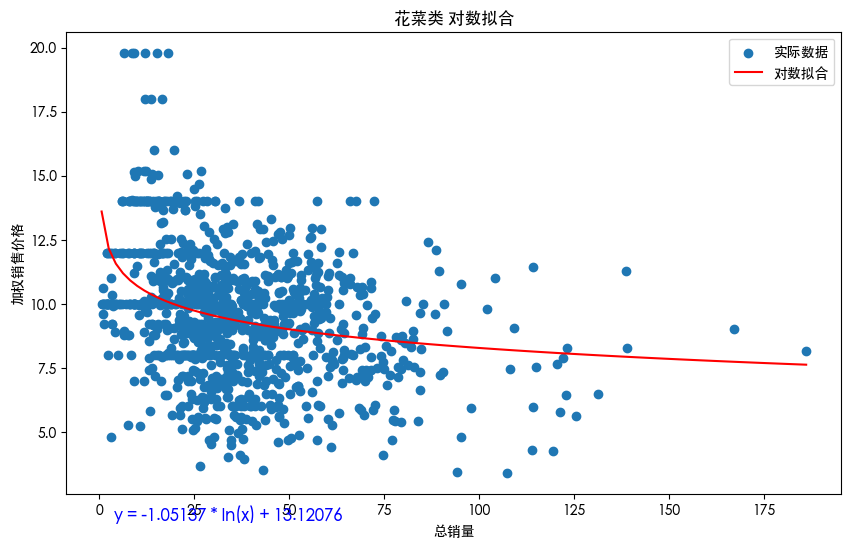

[[Model]]
    Model(logarithmic_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 7
    # data points      = 1050
    # variables        = 2
    chi-square         = 6376.01132
    reduced chi-square = 6.08398027
    Akaike info crit   = 1897.94018
    Bayesian info crit = 1907.85327
    R-squared          = 0.04490242
[[Variables]]
    a: -0.80012548 +/- 0.11398993 (14.25%) (init = 1)
    b:  11.1541162 +/- 0.33297191 (2.99%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.9735


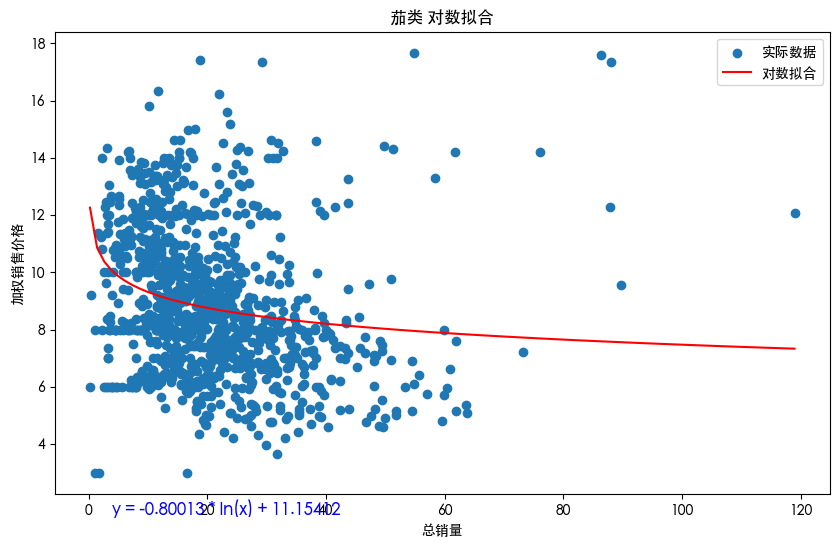

[[Model]]
    Model(logarithmic_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 7
    # data points      = 1085
    # variables        = 2
    chi-square         = 5651.12986
    reduced chi-square = 5.21803312
    Akaike info crit   = 1794.54893
    Bayesian info crit = 1804.52760
    R-squared          = 0.02978095
[[Variables]]
    a: -0.63685326 +/- 0.11045638 (17.34%) (init = 1)
    b:  11.1053826 +/- 0.44323668 (3.99%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.9877


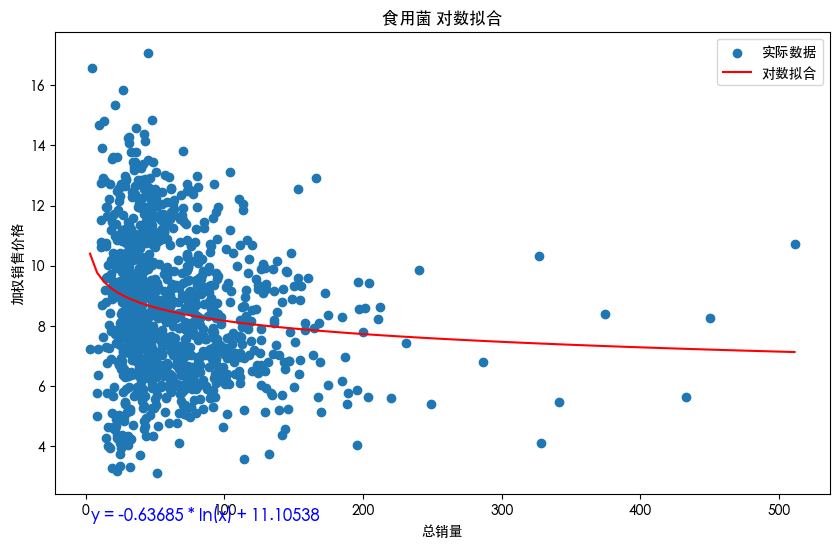

[[Model]]
    Model(logarithmic_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 7
    # data points      = 1085
    # variables        = 2
    chi-square         = 2330.94532
    reduced chi-square = 2.15230408
    Akaike info crit   = 833.692898
    Bayesian info crit = 843.671568
    R-squared          = 0.04513238
[[Variables]]
    a: -0.69852322 +/- 0.09763243 (13.98%) (init = 1)
    b:  9.24591869 +/- 0.49407482 (5.34%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.9959


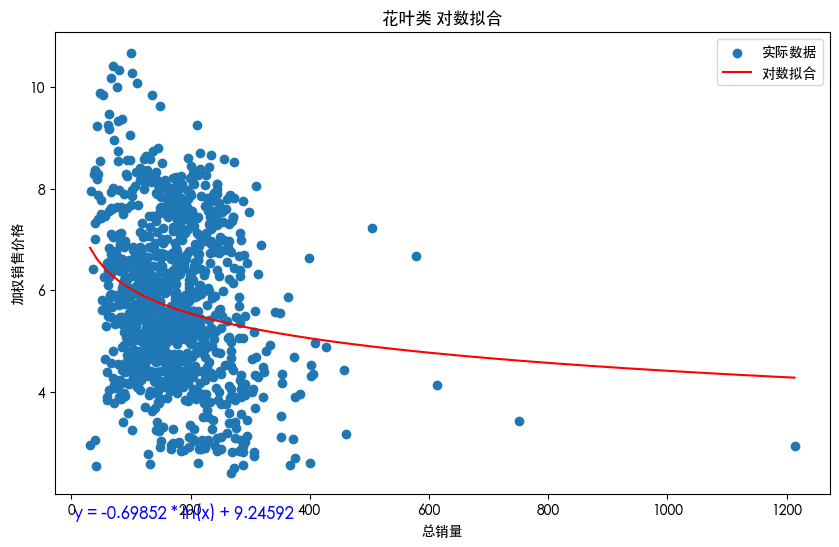

[[Model]]
    Model(logarithmic_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 7
    # data points      = 1085
    # variables        = 2
    chi-square         = 11349.2266
    reduced chi-square = 10.4794336
    Akaike info crit   = 2551.11303
    Bayesian info crit = 2561.09170
    R-squared          = 0.19185401
[[Variables]]
    a: -1.66357412 +/- 0.10374983 (6.24%) (init = 1)
    b:  15.0901304 +/- 0.34004785 (2.25%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.9573


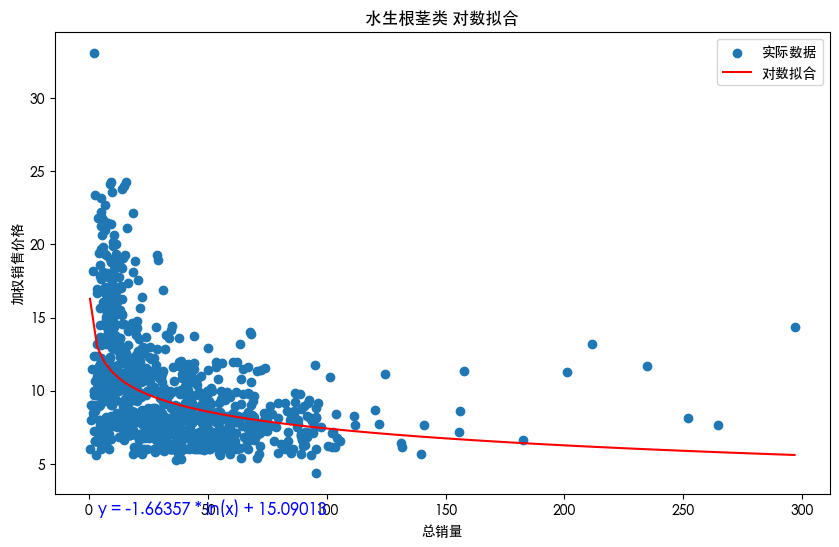

[[Model]]
    Model(logarithmic_model)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 7
    # data points      = 1085
    # variables        = 2
    chi-square         = 14617.0778
    reduced chi-square = 13.4968401
    Akaike info crit   = 2825.66247
    Bayesian info crit = 2835.64114
    R-squared          = 0.06226113
[[Variables]]
    a: -1.79339895 +/- 0.21149257 (11.79%) (init = 1)
    b:  16.4108938 +/- 0.90130745 (5.49%) (init = 1)
[[Correlations]] (unreported correlations are < 0.100)
    C(a, b) = -0.9923


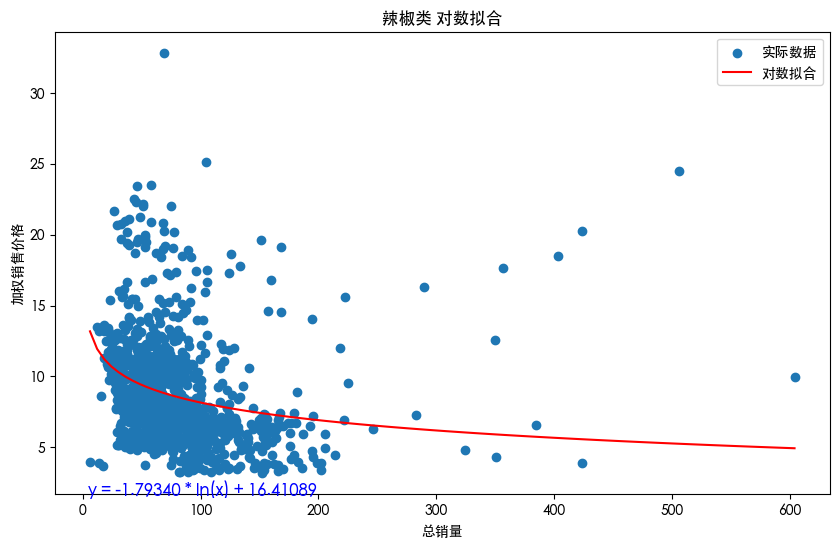

In [42]:


def function(data, name):
    # 定义对数关系模型
    def logarithmic_model(x, a, b):
        return a * np.log(x) + b

    # 提取数据
    x_data = data['总销量'].values
    y_data = data['加权销售价格'].values

    # 创建模型对象
    model = Model(logarithmic_model)

    # 创建参数对象并设置初始猜测值
    params = Parameters()
    params.add('a', value=1.0)
    params.add('b', value=1.0)

    # 使用lmfit进行拟合
    result = model.fit(y_data, params, x=x_data)

    # 输出拟合结果，包括参数值
    print(result.fit_report())

    # 提取拟合参数值
    a_fit = result.params['a'].value
    b_fit = result.params['b'].value

    # 构建拟合方程
    fit_equation = f'y = {a_fit:.5f} * ln(x) + {b_fit:.5f}'

    # 绘制拟合结果
    plt.figure(figsize=(10, 6))
    plt.scatter(x_data, y_data, label='实际数据')
    x_fit = np.linspace(min(x_data), max(x_data), 100)
    y_fit = logarithmic_model(x_fit, a_fit, b_fit)
    plt.plot(x_fit, y_fit, color='red', label='对数拟合')
    plt.title(f'{name} 对数拟合')
    plt.xlabel('总销量')
    plt.ylabel('加权销售价格')
    plt.text(4, 1.5, fit_equation, fontsize=12, color='blue')  # 在图表上显示方程
    plt.legend()
    plt.show()

for category in sale['分类名称'].unique():
    category_data = sale_plus[sale_plus['分类名称'] == category]
    function(category_data, category)


花菜类 综合拟合表达式: y = -9.49416 / (x^2) + 11.76032 / x + 9.07205 (x <= 10) + -1.05137 * log(x) + 13.12076 (10 < x <= 100) + 0.00033 * x^2 + -0.07009 * x + 11.52093 (x > 100)


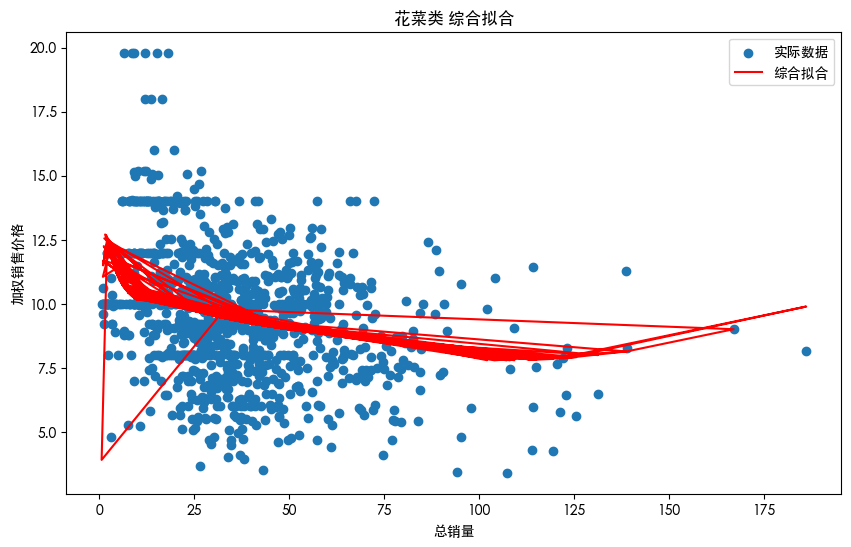

茄类 综合拟合表达式: y = -1.50589 / (x^2) + 4.94750 / x + 8.52993 (x <= 10) + -0.80013 * log(x) + 11.15412 (10 < x <= 100) + 0.00146 * x^2 + -0.13213 * x + 10.75484 (x > 100)


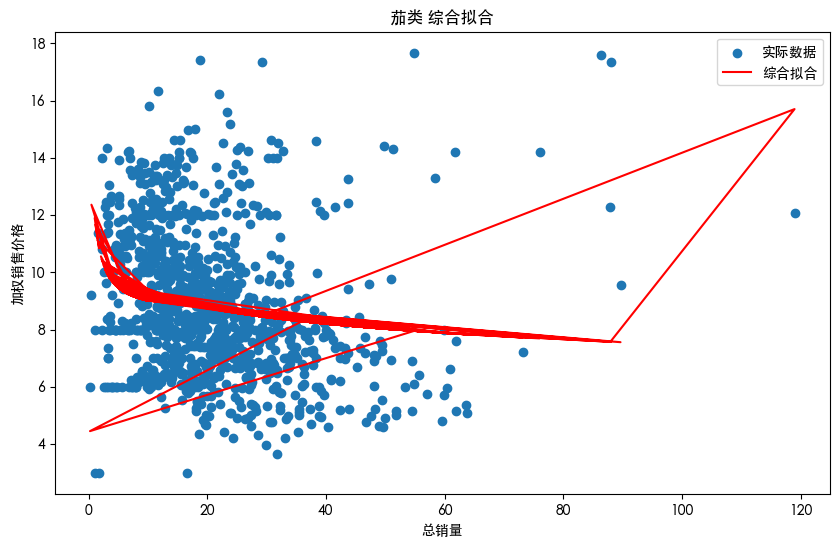

食用菌 综合拟合表达式: y = -87.63352 / (x^2) + 29.81065 / x + 7.96613 (x <= 10) + -0.63685 * log(x) + 11.10538 (10 < x <= 100) + 0.00003 * x^2 + -0.01595 * x + 9.42214 (x > 100)


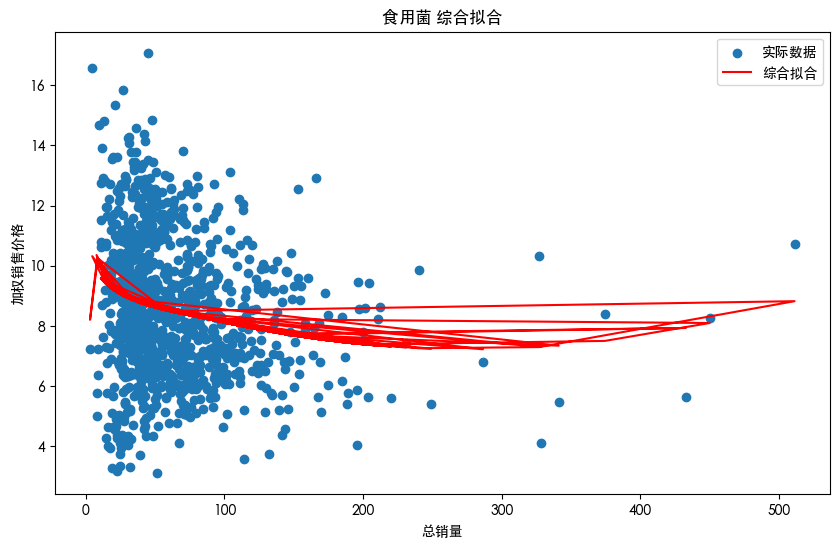

花叶类 综合拟合表达式: y = -0.69852 * log(x) + 9.24592 (10 < x <= 100) + 0.00000 * x^2 + -0.00482 * x + 6.49191 (x > 100)


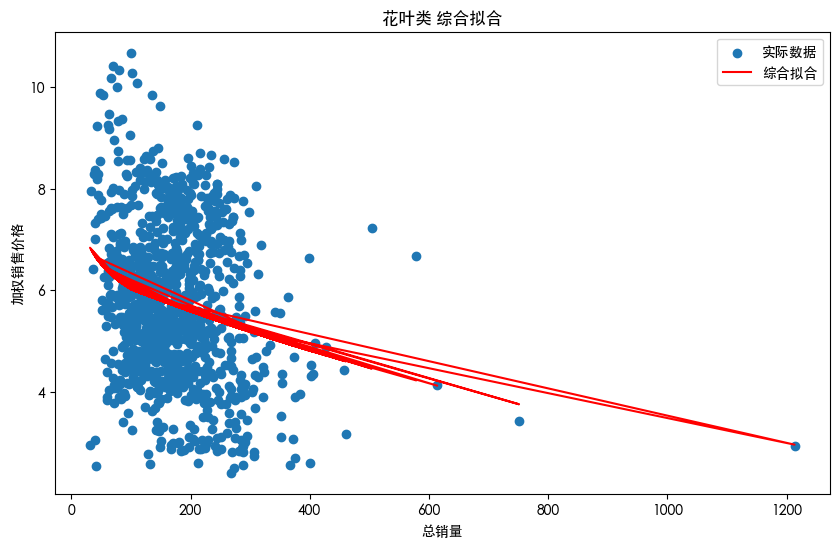

水生根茎类 综合拟合表达式: y = -11.86940 / (x^2) + 19.56367 / x + 8.66792 (x <= 10) + -1.66357 * log(x) + 15.09013 (10 < x <= 100) + 0.00039 * x^2 + -0.09848 * x + 12.38809 (x > 100)


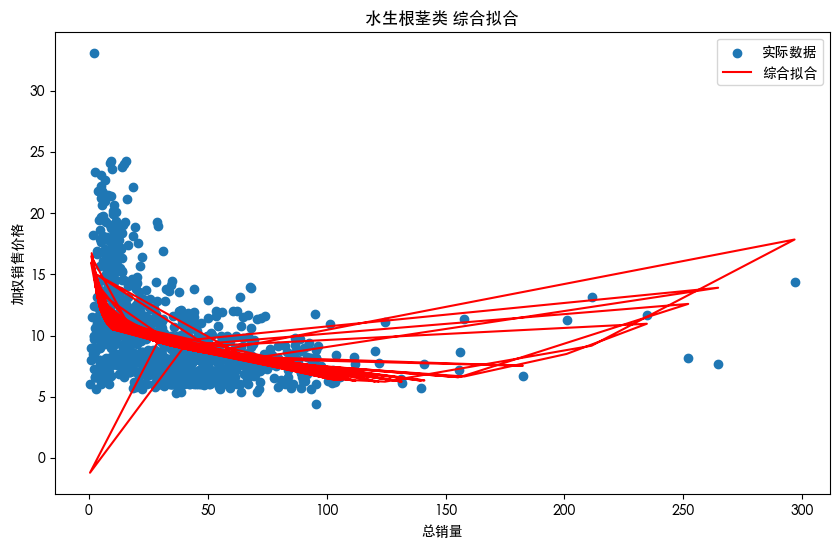

辣椒类 综合拟合表达式: y = -1202.26518 / (x^2) + 172.57362 / x + 6.39999 (x <= 10) + -1.79340 * log(x) + 16.41089 (10 < x <= 100) + 0.00011 * x^2 + -0.04993 * x + 11.77393 (x > 100)


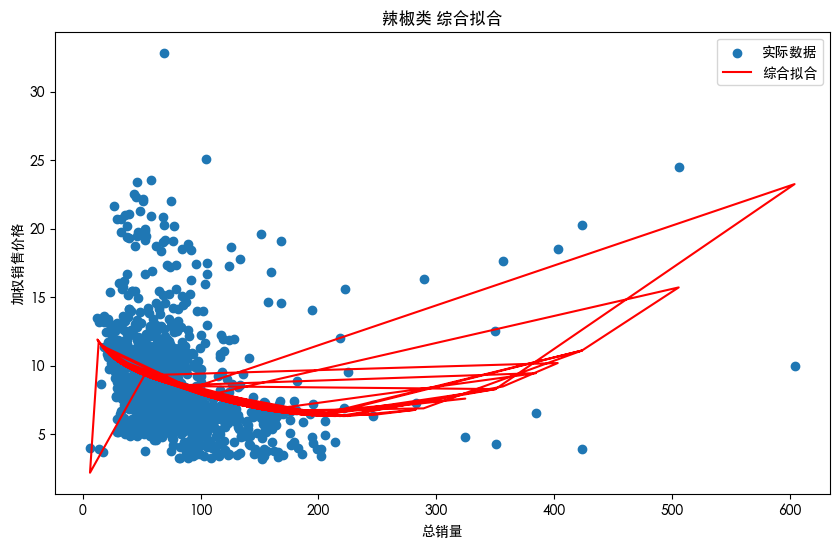

In [43]:


def function(data, name):
    x_data = data['总销量'].values
    y_data = data['加权销售价格'].values

    # 定义负幂次模型
    def negative_power_model(x, a, b, c):
        return a / (x**2) + b / (x) + c

    # 定义对数模型
    def logarithmic_model(x, a, b):
        return a * np.log(x) + b

    # 定义多项式模型
    def polynomial_model(x, a, b, c):
        return a * x**2 + b * x + c

    # 创建模型对象
    negative_power = Model(negative_power_model)
    logarithmic = Model(logarithmic_model)
    polynomial = Model(polynomial_model)

    # 创建参数对象并设置初始猜测值
    params_negative_power = Parameters()
    params_negative_power.add('a', value=1.0)
    params_negative_power.add('b', value=1.0)
    params_negative_power.add('c', value=1.0)

    params_logarithmic = Parameters()
    params_logarithmic.add('a', value=1.0)
    params_logarithmic.add('b', value=1.0)

    params_polynomial = Parameters()
    params_polynomial.add('a', value=1.0)
    params_polynomial.add('b', value=1.0)
    params_polynomial.add('c', value=1.0)

    # 根据数据范围拟合不同模型
    threshold1 = 10  # 销量阈值1，根据需要调整
    threshold2 = 100  # 销量阈值2，根据需要调整

    data_negative_power = data[data['总销量'] <= threshold1]
    data_logarithmic = data[(data['总销量'] > threshold1) & (data['总销量'] <= threshold2)]
    data_polynomial = data[data['总销量'] > threshold2]

    result_negative_power = negative_power.fit(y_data, params_negative_power, x=x_data)
    result_logarithmic = logarithmic.fit(y_data, params_logarithmic, x=x_data)
    result_polynomial = polynomial.fit(y_data, params_polynomial, x=x_data)

    # 组合混合模型
    y_fit = np.where(x_data <= threshold1, result_negative_power.best_fit,
                      np.where((x_data > threshold1) & (x_data <= threshold2), result_logarithmic.best_fit,
                               result_polynomial.best_fit))

    # 输出混合模型的表达式
    expression = ""
    if threshold1 > min(x_data):
        expression += f'{result_negative_power.params["a"].value:.5f} / (x^2) + {result_negative_power.params["b"].value:.5f} / x + {result_negative_power.params["c"].value:.5f} (x <= {threshold1})'
    if threshold2 > threshold1:
        if expression:
            expression += ' + '
        expression += f'{result_logarithmic.params["a"].value:.5f} * log(x) + {result_logarithmic.params["b"].value:.5f} ({threshold1} < x <= {threshold2})'
    if max(x_data) > threshold2:
        if expression:
            expression += ' + '
        expression += f'{result_polynomial.params["a"].value:.5f} * x^2 + {result_polynomial.params["b"].value:.5f} * x + {result_polynomial.params["c"].value:.5f} (x > {threshold2})'

    print(f'{name} 综合拟合表达式: y = {expression}')

    # 绘制综合拟合结果
    plt.figure(figsize=(10, 6))
    plt.scatter(x_data, y_data, label='实际数据')
    plt.plot(x_data, y_fit, color='red', label='综合拟合')
    plt.title(f'{name} 综合拟合')
    plt.xlabel('总销量')
    plt.ylabel('加权销售价格')
    plt.legend()


    plt.show()

for category in sale['分类名称'].unique():
    category_data = sale_plus[sale_plus['分类名称'] == category]
    function(category_data, category)


In [45]:
display(sale.columns)
display(sale_plus.columns)

Index(['单品编码', '销售单价(元/千克)', '销售日期', '总销量', '批发价格', '销售价格', '总利润', '成本利润率',
       '分类名称', '归一化系数', '加权批发价格', '加权销售价格', '加权成本利润率'],
      dtype='object')

Index(['分类名称', '销售日期', '总销量', '总利润', '加权批发价格', '加权销售价格', '加权平均利润率'], dtype='object')

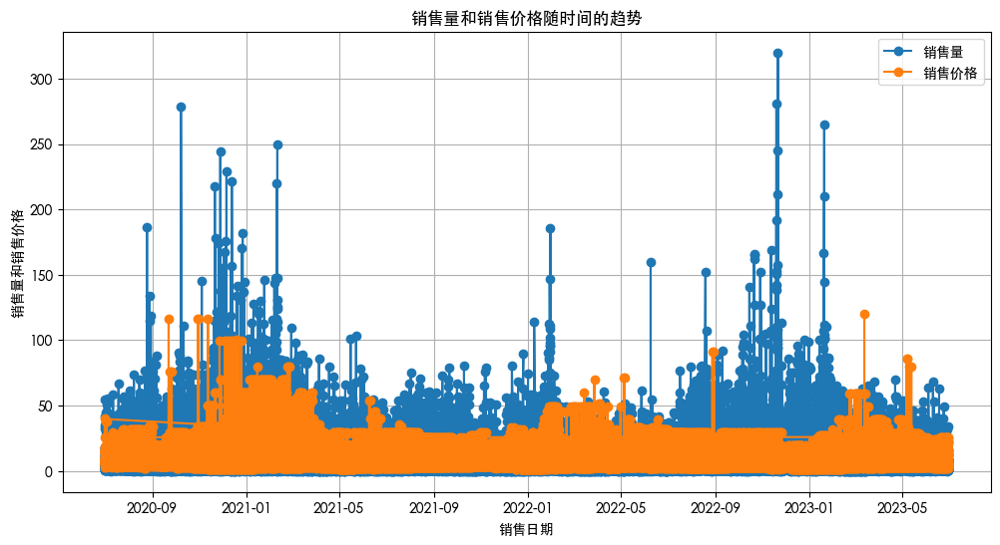

In [46]:

plt.figure(figsize=(12, 6))
plt.plot(sale['销售日期'], sale['总销量'], label='销售量', marker='o')
plt.plot(sale['销售日期'], sale['销售价格'], label='销售价格', marker='o')
plt.xlabel('销售日期')
plt.ylabel('销售量和销售价格')
plt.title('销售量和销售价格随时间的趋势')
plt.legend()
plt.grid(True)
plt.show()


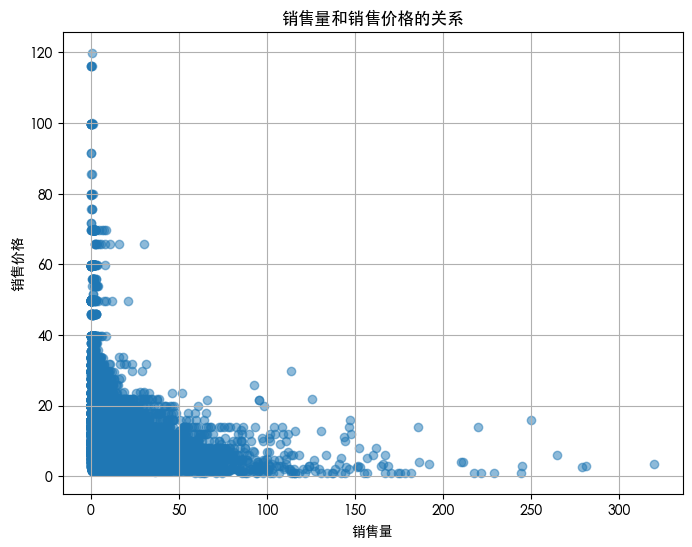

In [47]:
plt.figure(figsize=(8, 6))
plt.scatter(sale['总销量'], sale['销售价格'], alpha=0.5)
plt.xlabel('销售量')
plt.ylabel('销售价格')
plt.title('销售量和销售价格的关系')
plt.grid(True)
plt.show()


#### 岭回归 和 BP神经网络  可靠性指标: $R^2$  均方误差

In [48]:


min_date = sale['销售日期'].min()
sale['日期序号'] = (sale['销售日期'] - min_date).dt.days.astype(int)

def judge(name, y_true, y_pred):
    r2 = r2_score(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    print(f'{name} - R²分数: {r2}')
    print(f'{name} - 均方误差: {mse}')

def ridge_function(data, name):
    # 准备数据
    X = data[['总销量', '总利润', '归一化系数', '加权批发价格', '加权销售价格', '日期序号']].values
    y = data[['总销量', '加权销售价格']].values

    # 划分数据集
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42)

    # 创建岭回归模型
    ridge = Ridge(alpha=1.0)  # 你可以设置不同的alpha值，来控制正则化的强度

    # 拟合模型
    ridge.fit(X_train, y_train)

    # 预测
    y_pred = ridge.predict(X_test)
    judge(name, y_test, y_pred)
    
def bp_function(data, name):
    X = data[['总销量', '总利润', '归一化系数','加权批发价格', '加权销售价格', '日期序号']].values
    y = data[['总销量', '加权销售价格']].values

    # 划分数据集
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # 建立BP神经网络模型
    model = keras.Sequential([
    keras.layers.Dense(64, activation='relu', input_shape=(6,)),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(2)
    ])
    
    # 编译模型
    model.compile(optimizer='adam', loss='mean_squared_error')
    # 训练模型
    model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=0)
    # 预测
    y_pred = model.predict(X_test)
    judge(name, y_test, y_pred)

# 循环处理每个品类
for category in sale['分类名称'].unique():
    category_data = sale[sale['分类名称'] == category]
    
    # 调用ridge_function和bp_function计算R²分数和均方误差
    ridge_function(category_data, category)
    bp_function(category_data, category)


花菜类 - R²分数: 0.9999998884401458
花菜类 - 均方误差: 1.1745396336820036e-06
12/12 [==============================] - 0s 446us/step
花菜类 - R²分数: 0.9952440654768087
花菜类 - 均方误差: 0.07804246920325145
茄类 - R²分数: 0.9999999382006513
茄类 - 均方误差: 3.94710376334085e-07
21/21 [==============================] - 0s 374us/step
茄类 - R²分数: 0.9360197547715325
茄类 - 均方误差: 0.4176382585884998
食用菌 - R²分数: 0.999999874989415
食用菌 - 均方误差: 2.883765534039638e-07
59/59 [==============================] - 0s 310us/step
食用菌 - R²分数: 0.8064164755728889
食用菌 - 均方误差: 0.47938148631216787
花叶类 - R²分数: 0.999989981866549
花叶类 - 均方误差: 1.038588721860484e-06
113/113 [==============================] - 0s 274us/step
花叶类 - R²分数: 0.971085919999942
花叶类 - 均方误差: 0.014803665760241018
水生根茎类 - R²分数: 0.9999999376540638
水生根茎类 - 均方误差: 5.913613951999089e-07
20/20 [==============================] - 0s 323us/step
水生根茎类 - R²分数: 0.9933809396065887
水生根茎类 - 均方误差: 0.08504141156190133
辣椒类 - R²分数: 0.9999998927470424
辣椒类 - 均方误差: 2.3468107050787706e-07
67/67 [=========

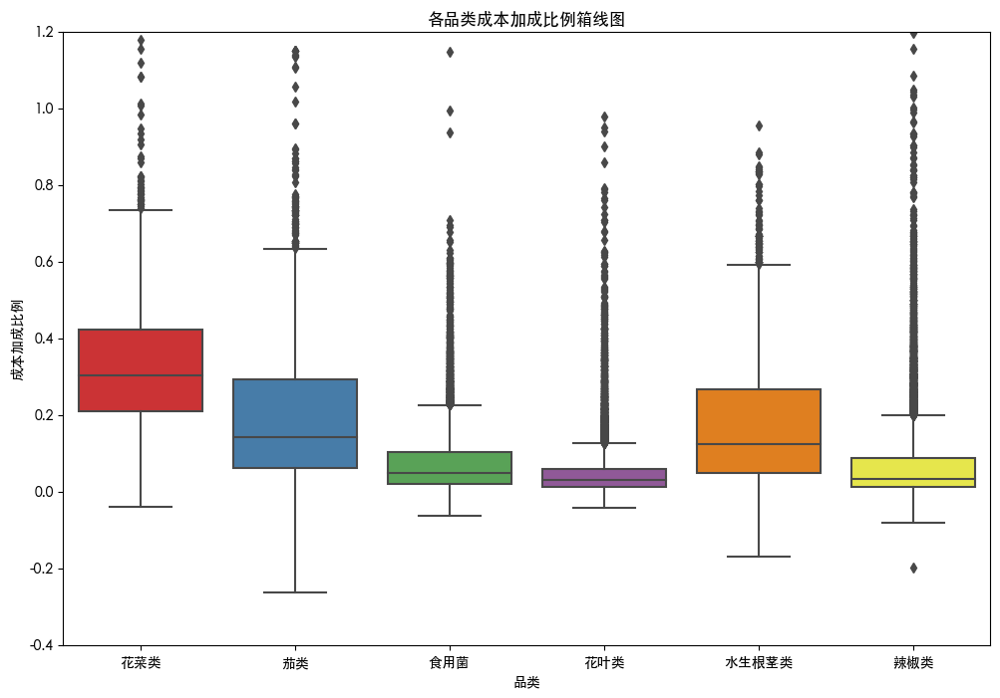

In [49]:

# 绘制成本加成比例的箱线图
plt.figure(figsize=(12, 8))
sns.boxplot(data=sale, x='分类名称', y='加权成本利润率', palette='Set1')
plt.xlabel('品类')
plt.ylabel('成本加成比例')
plt.ylim(-0.4, 1.2)
plt.title('各品类成本加成比例箱线图')


plt.show()



In [50]:
val1 = pd.read_excel('./predict_花叶类.xlsx')
val2 = pd.read_excel('./predict_花菜类.xlsx')
val3 = pd.read_excel('./predict_水生根茎类.xlsx')
val4 = pd.read_excel('./predict_茄类.xlsx')
val5 = pd.read_excel('./predict_辣椒类.xlsx')
val6 = pd.read_excel('./predict_食用菌.xlsx')

# 将日期序号设置为索引
val1.set_index('天数', inplace=True)
val2.set_index('天数', inplace=True)
val3.set_index('天数', inplace=True)
val4.set_index('天数', inplace=True)
val5.set_index('天数', inplace=True)
val6.set_index('天数', inplace=True)

# 创建一个包含所有数据帧的列表
data_frames = [val1, val2, val3, val4, val5, val6]

# 合并数据帧，以"天数"列为基准，进行左连接
merged_df = pd.concat(data_frames, axis=1, join='inner')

# 保存合并后的数据
merged_df.to_excel('prd_prices.xlsx')

merged_df


,花叶类预测价格,花菜类预测价格,水生根茎类预测价格,茄类预测价格,辣椒类预测价格,食用菌预测价格
天数,,,,,,
738702,3.224286,6.416563,6.779648,5.650077,6.399412,5.020512
738703,3.272735,6.328598,7.435112,6.014613,6.129292,5.851239
738704,3.242235,6.514010,7.063620,5.277177,6.111217,5.607718
738705,3.171601,6.256020,7.329532,5.426702,5.434986,5.850285
738706,2.954161,6.049575,8.299847,5.065868,4.983310,5.306468
738707,3.154108,6.756072,8.459876,6.103991,6.026947,5.501088
738708,3.422249,6.892965,6.856164,5.527570,6.431559,5.835847


In [51]:
sale_plus['销售日期'] = pd.to_datetime(sale_plus['销售日期'], format='%Y-%m-%d')

# 选择日期范围为从2023-06-01到2023-06-30的数据
date_range_mask = (sale_plus['销售日期'] >= '2023-06-01') & (sale_plus['销售日期'] <= '2023-06-30')
filtered_data = sale_plus[date_range_mask]
result = filtered_data.groupby('分类名称')['加权平均利润率'].agg(['mean', 'std'])

# 打印结果
print("每个品类的近30天的加权平均利润率和标准差：")
print(result)

每个品类的近30天的加权平均利润率和标准差：
           mean       std
分类名称                     
水生根茎类  0.498537  0.114756
花叶类    0.586010  0.067862
花菜类    0.502159  0.093173
茄类     0.574407  0.088136
辣椒类    0.824470  0.138360
食用菌    0.596733  0.191276


In [52]:
display(merged_df.columns)
# 假设数据框名为 merged_df
# 假设 result 包含了每个品类的近30天的加权平均利润率均值
# 将 result 转换为字典
profit_margin_mean_dict = result['mean'].to_dict()

# 遍历每个品类，计算成本加成定价
for category, mean_profit_margin in profit_margin_mean_dict.items():
    # 获取对应品类的预测价格列
    forecast_prices = merged_df[category + '预测价格']
    
    # 计算成本加成定价
    cost_plus_pricing = forecast_prices / (1 - mean_profit_margin)
    
    # 将成本加成定价添加到数据框中
    merged_df[category + '成本加成定价'] = cost_plus_pricing

# 打印结果
print("计算后的成本加成定价数据框：")
merged_df = merged_df.iloc[:, 1:]
merged_df['日期'] = pd.date_range(start='2023-07-01', periods=len(merged_df))
display(merged_df)


Index(['花叶类预测价格', '花菜类预测价格', '水生根茎类预测价格', '茄类预测价格', '辣椒类预测价格', '食用菌预测价格'], dtype='object')

计算后的成本加成定价数据框：


,花菜类预测价格,水生根茎类预测价格,茄类预测价格,辣椒类预测价格,食用菌预测价格,水生根茎类成本加成定价,花叶类成本加成定价,花菜类成本加成定价,茄类成本加成定价,辣椒类成本加成定价,食用菌成本加成定价,日期
天数,,,,,,,,,,,,
738702,6.416563,6.779648,5.650077,6.399412,5.020512,13.519751,7.788319,12.888789,13.275784,36.457641,12.449612,2023-07-01
738703,6.328598,7.435112,6.014613,6.129292,5.851239,14.826855,7.905350,12.712095,14.132321,34.918757,14.509605,2023-07-02
738704,6.514010,7.063620,5.277177,6.111217,5.607718,14.086038,7.831677,13.084529,12.399595,34.815781,13.905735,2023-07-03
738705,6.256020,7.329532,5.426702,5.434986,5.850285,14.616311,7.661060,12.566309,12.750927,30.963274,14.507241,2023-07-04
738706,6.049575,8.299847,5.065868,4.983310,5.306468,16.551281,7.135829,12.151629,11.903088,28.390064,13.158710,2023-07-05
738707,6.756072,8.459876,6.103991,6.026947,5.501088,16.870406,7.618804,13.570751,14.342328,34.335695,13.641319,2023-07-06
738708,6.892965,6.856164,5.527570,6.431559,5.835847,13.672336,8.266503,13.845725,12.987933,36.640782,14.471438,2023-07-07


In [53]:


def bp_function(data, name):
    X = data[[ '归一化系数','加权批发价格']].values
    y = data[['总销量', '销售价格']].values

    # 划分数据集
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # 建立BP神经网络模型
    model = keras.Sequential([
        keras.layers.Dense(64, activation='relu', input_shape=(2,)),
        keras.layers.Dense(32, activation='relu'),
        keras.layers.Dense(2)
    ])
    
    # 编译模型
    model.compile(optimizer='adam', loss='mean_squared_error')
    
    # 训练模型
    model.fit(X_train, y_train, epochs=200, batch_size=32, verbose=0)
    
    # 预测
    y_pred = model.predict(X_test)
    
    # 计算R²分数和均方误差
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    print(f'{name} - BP神经网络 R²分数: {r2}')
    print(f'{name} - BP神经网络 均方误差: {mse}')
# 调用bp_function
for category in sale['分类名称'].unique():
    category_data = sale[sale['分类名称'] == category]
    bp_function(category_data, category)


12/12 [==============================] - 0s 384us/step
花菜类 - BP神经网络 R²分数: 0.4955857012757512
花菜类 - BP神经网络 均方误差: 77.44059394101713
21/21 [==============================] - 0s 384us/step
茄类 - BP神经网络 R²分数: 0.6489043880586078
茄类 - BP神经网络 均方误差: 10.539130291803868
59/59 [==============================] - 0s 291us/step
食用菌 - BP神经网络 R²分数: 0.6748776235781735
食用菌 - BP神经网络 均方误差: 44.429403976481666
113/113 [==============================] - 0s 289us/step
花叶类 - BP神经网络 R²分数: 0.8099083867864985
花叶类 - BP神经网络 均方误差: 23.256658363764842
20/20 [==============================] - 0s 350us/step
水生根茎类 - BP神经网络 R²分数: 0.6330855178067896
水生根茎类 - BP神经网络 均方误差: 85.81789569236867
67/67 [==============================] - 0s 303us/step
辣椒类 - BP神经网络 R²分数: 0.7618807480746296
辣椒类 - BP神经网络 均方误差: 43.88483863722399


In [54]:
sale

,单品编码,销售单价(元/千克),销售日期,总销量,批发价格,销售价格,总利润,成本利润率,分类名称,归一化系数,加权批发价格,加权销售价格,加权成本利润率,日期序号
0,102900011009970,9.0,2020-07-01,12.086,6.03,9.0,35.89542,0.492537,花菜类,0.256734,1.548105,2.310604,0.126451,0
1,102900005116714,14.0,2020-07-01,34.990,9.23,14.0,166.90230,0.516793,花菜类,0.743266,6.860347,10.405727,0.384115,0
2,102900005116714,14.0,2020-07-02,30.109,8.90,14.0,153.55590,0.573034,花菜类,0.685183,6.098129,9.592563,0.392633,1
3,102900011009970,9.0,2020-07-02,13.834,5.52,9.0,48.14232,0.630435,花菜类,0.314817,1.737789,2.833352,0.198472,1
4,102900005116714,14.0,2020-07-03,26.460,8.97,14.0,133.09380,0.560758,花菜类,0.628862,5.640893,8.804069,0.352639,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46175,102900011016701,5.2,2023-06-30,15.896,3.63,5.2,24.95672,0.432507,辣椒类,0.201149,0.730171,1.045975,0.086998,1094
46176,102900011034439,5.8,2023-06-30,4.000,3.32,5.8,9.92000,0.746988,辣椒类,0.050616,0.168046,0.293574,0.037810,1094
46177,102900011000328,12.0,2023-06-30,8.470,8.97,12.0,25.66410,0.337793,辣椒类,0.107180,0.961404,1.286159,0.036205,1094
46178,102900011032848,4.8,2023-06-30,9.000,2.33,4.8,22.23000,1.060086,辣椒类,0.113887,0.265356,0.546656,0.120730,1094


In [55]:
category_means = sale.groupby('分类名称')['归一化系数'].mean()
category_means.reset_index()

,分类名称,归一化系数
0,水生根茎类,0.339593
1,花叶类,0.060298
2,花菜类,0.576985
3,茄类,0.327715
4,辣椒类,0.102339
5,食用菌,0.116566


In [56]:
to_del = ["花菜类预测价格","水生根茎类预测价格",	"茄类预测价格",	"辣椒类预测价格",	"食用菌预测价格"]
merged_df = merged_df.drop(columns=to_del)
merged_df

,水生根茎类成本加成定价,花叶类成本加成定价,花菜类成本加成定价,茄类成本加成定价,辣椒类成本加成定价,食用菌成本加成定价,日期
天数,,,,,,,
738702,13.519751,7.788319,12.888789,13.275784,36.457641,12.449612,2023-07-01
738703,14.826855,7.905350,12.712095,14.132321,34.918757,14.509605,2023-07-02
738704,14.086038,7.831677,13.084529,12.399595,34.815781,13.905735,2023-07-03
738705,14.616311,7.661060,12.566309,12.750927,30.963274,14.507241,2023-07-04
738706,16.551281,7.135829,12.151629,11.903088,28.390064,13.158710,2023-07-05
738707,16.870406,7.618804,13.570751,14.342328,34.335695,13.641319,2023-07-06
738708,13.672336,8.266503,13.845725,12.987933,36.640782,14.471438,2023-07-07


In [57]:
prd = pd.read_excel(r'./prd.xlsx')

prd['总销量'] = 0
prd['销售价格'] = 0
prd
sale = pd.concat([sale, prd], ignore_index=True)
sale = sale.fillna(0)
sale

,单品编码,销售单价(元/千克),销售日期,总销量,批发价格,销售价格,总利润,成本利润率,分类名称,归一化系数,加权批发价格,加权销售价格,加权成本利润率,日期序号,日期
0,1.029000e+14,9.0,2020-07-01 00:00:00,12.086,6.03,9.0,35.89542,0.492537,花菜类,0.256734,1.548105,2.310604,0.126451,0.0,0
1,1.029000e+14,14.0,2020-07-01 00:00:00,34.990,9.23,14.0,166.90230,0.516793,花菜类,0.743266,6.860347,10.405727,0.384115,0.0,0
2,1.029000e+14,14.0,2020-07-02 00:00:00,30.109,8.90,14.0,153.55590,0.573034,花菜类,0.685183,6.098129,9.592563,0.392633,1.0,0
3,1.029000e+14,9.0,2020-07-02 00:00:00,13.834,5.52,9.0,48.14232,0.630435,花菜类,0.314817,1.737789,2.833352,0.198472,1.0,0
4,1.029000e+14,14.0,2020-07-03 00:00:00,26.460,8.97,14.0,133.09380,0.560758,花菜类,0.628862,5.640893,8.804069,0.352639,2.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46217,0.000000e+00,0.0,0,0.000,0.00,0.0,0.00000,0.000000,食用菌,0.116566,13.905735,0.000000,0.000000,0.0,2023-07-03 00:00:00
46218,0.000000e+00,0.0,0,0.000,0.00,0.0,0.00000,0.000000,食用菌,0.116566,14.507241,0.000000,0.000000,0.0,2023-07-04 00:00:00
46219,0.000000e+00,0.0,0,0.000,0.00,0.0,0.00000,0.000000,食用菌,0.116566,13.158710,0.000000,0.000000,0.0,2023-07-05 00:00:00
46220,0.000000e+00,0.0,0,0.000,0.00,0.0,0.00000,0.000000,食用菌,0.116566,13.641319,0.000000,0.000000,0.0,2023-07-06 00:00:00


In [58]:
def bp_function(data, name):
    X = data[[ '归一化系数','加权批发价格']].values
    y = data[['总销量', '销售价格']].values

    # 划分数据集
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.0034, random_state=42)
    
    # 建立BP神经网络模型
    model = keras.Sequential([
        keras.layers.Dense(64, activation='relu', input_shape=(2,)),
        keras.layers.Dense(32, activation='relu'),
        keras.layers.Dense(2)
    ])
    
    # 编译模型
    model.compile(optimizer='adam', loss='mean_squared_error')
    
    # 训练模型
    model.fit(X_train, y_train, epochs=200, batch_size=32, verbose=0)
    
    # 预测
    y_pred = model.predict(X_test)
    
    # 计算R²分数和均方误差
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    print(f'{name} - BP神经网络 R²分数: {r2}')
    print(f'{name} - BP神经网络 均方误差: {mse}')
    display(y_pred)
# 调用bp_function
for category in sale['分类名称'].unique():
    category_data = sale[sale['分类名称'] == category]
    bp_function(category_data,category)

1/1 [==============================] - 0s 28ms/step
花菜类 - BP神经网络 R²分数: 0.3838061205979989
花菜类 - BP神经网络 均方误差: 34.45164612949509


array([[30.86084  ,  9.477815 ],
       [28.24503  , 10.5323715],
       [27.55494  , 10.773519 ],
       [25.631115 ,  5.491913 ],
       [26.043516 , 10.0074215],
       [ 1.7645708,  8.575074 ],
       [21.768644 , 12.894309 ]], dtype=float32)

1/1 [==============================] - 0s 46ms/step
茄类 - BP神经网络 R²分数: 0.6604548254814473
茄类 - BP神经网络 均方误差: 13.54261356935919


array([[ 7.933064 , 11.177372 ],
       [ 0.9738426, 11.27283  ],
       [16.34825  ,  7.273283 ],
       [ 2.4131503,  6.4982657],
       [ 5.904483 ,  9.340962 ],
       [ 1.2208788, 10.64229  ],
       [14.237745 ,  7.9879036],
       [ 6.251397 , 10.17373  ],
       [11.674193 , 12.018249 ],
       [14.556611 , 13.472646 ],
       [10.004    ,  7.061157 ]], dtype=float32)

1/1 [==============================] - 0s 31ms/step
食用菌 - BP神经网络 R²分数: -0.2799452790125944
食用菌 - BP神经网络 均方误差: 30.090588164186148


array([[ 0.5867358 , 10.543333  ],
       [12.890716  ,  4.8535614 ],
       [ 8.130666  ,  5.114138  ],
       [ 0.5021243 , 17.075417  ],
       [ 3.094499  ,  8.588685  ],
       [ 1.2423494 , 13.049804  ],
       [ 0.44221836, 10.282034  ],
       [ 0.8647072 , 13.024345  ],
       [ 0.7898355 ,  6.1319046 ],
       [57.123802  ,  2.1779685 ],
       [ 1.3799696 ,  4.0874166 ],
       [12.133963  ,  4.372735  ],
       [ 2.1096654 ,  5.0667324 ],
       [ 7.417309  ,  3.395954  ],
       [ 9.396556  ,  4.035486  ],
       [ 3.325671  ,  4.0025935 ],
       [ 1.0261104 ,  7.4636374 ],
       [ 0.46092004, 17.731739  ],
       [ 5.7878532 ,  4.940551  ],
       [ 1.4123049 , 11.766786  ],
       [ 1.4809046 ,  5.0175247 ],
       [ 2.9307172 ,  1.6199784 ],
       [ 2.2265155 , 12.620936  ],
       [ 1.8633881 ,  2.2910593 ],
       [ 5.439903  ,  3.4818928 ],
       [ 0.36765617, 16.5009    ],
       [ 3.9828258 ,  3.3274856 ],
       [16.339718  , 19.886215  ],
       [ 1.5738144 ,

2/2 [==============================] - 0s 1ms/step
花叶类 - BP神经网络 R²分数: 0.5862465162750191
花叶类 - BP神经网络 均方误差: 24.430406735563285


array([[ 1.14013376e+01,  8.15093422e+00],
       [ 3.07554626e+00,  6.08449888e+00],
       [ 5.01519299e+00,  3.02364683e+00],
       [ 6.86600161e+00,  7.80564117e+00],
       [ 5.15629101e+00,  1.73562908e+01],
       [ 9.68862438e+00,  3.16777277e+00],
       [ 4.71548128e+00,  8.52050209e+00],
       [ 7.99230862e+00,  1.11727552e+01],
       [ 1.85849094e+01,  7.56061888e+00],
       [ 1.16338503e+00,  5.77417517e+00],
       [ 4.31739044e+00,  1.53743458e+01],
       [ 3.14543748e+00,  1.97206936e+01],
       [ 2.25250759e+01,  7.37173080e+00],
       [ 2.46341381e+01,  6.24424648e+00],
       [ 7.55813408e+00,  7.74904585e+00],
       [ 3.76356363e+00,  6.68438864e+00],
       [ 1.90962207e+00,  5.50446606e+00],
       [ 7.18410778e+00,  5.04559994e+00],
       [ 6.39291811e+00,  9.92215633e+00],
       [ 1.04511042e+01,  3.52574301e+00],
       [ 9.61400604e+00,  5.64709234e+00],
       [ 1.38206091e+01,  8.76637173e+00],
       [ 1.06282816e+01,  3.02563500e+00],
       [ 7.

1/1 [==============================] - 0s 35ms/step
水生根茎类 - BP神经网络 R²分数: 0.605940286379996
水生根茎类 - BP神经网络 均方误差: 25.692081043629287


array([[12.682059 ,  6.018336 ],
       [ 0.8754235, 18.267424 ],
       [10.156542 , 16.640356 ],
       [ 1.8887011, 24.701643 ],
       [ 8.376171 ,  6.9999876],
       [18.670847 ,  9.367306 ],
       [ 1.5488995, 21.23581  ],
       [18.10024  , 10.956206 ],
       [ 2.4335988,  8.138004 ],
       [18.110752 , 10.493871 ],
       [ 0.9899108, 14.531579 ]], dtype=float32)

2/2 [==============================] - 0s 1ms/step
辣椒类 - BP神经网络 R²分数: 0.7749713587987964
辣椒类 - BP神经网络 均方误差: 21.612644784575185


array([[ 3.708655  , 21.46333   ],
       [ 2.1445653 ,  5.8012996 ],
       [ 2.4798665 , 18.559288  ],
       [ 1.2021977 , 10.656695  ],
       [22.182756  ,  3.5702987 ],
       [28.428164  ,  3.8153834 ],
       [ 0.9253794 , 17.743206  ],
       [ 5.3843775 , 26.272547  ],
       [ 2.8630528 ,  6.51459   ],
       [ 2.4179945 ,  5.9205465 ],
       [ 1.224792  , 18.974379  ],
       [33.01469   ,  6.6553497 ],
       [ 0.23886827, 26.73868   ],
       [15.794333  ,  4.0946107 ],
       [ 2.7498076 ,  5.8052306 ],
       [ 5.551442  , 15.091437  ],
       [35.256523  ,  3.780734  ],
       [ 3.0113323 , 18.792597  ],
       [ 2.0285776 , 16.566704  ],
       [ 3.0111933 ,  6.240534  ],
       [ 1.2945386 , 10.750549  ],
       [ 0.6405468 , 18.948507  ],
       [39.1357    ,  9.934751  ],
       [ 1.2495861 ,  9.714953  ],
       [42.035526  ,  7.676294  ],
       [ 0.5457332 , 18.644447  ],
       [ 0.621367  , 15.379871  ],
       [ 3.5242026 , 20.85011   ],
       [ 1.8869915 ,

# Question3

In [8]:
# 读取附件数据
data1 = pd.read_excel(r'./附件1.xlsx')  # 产品数据
data2 = pd.read_excel(r'./附件2.xlsx')  # 销售数据
data3 = pd.read_excel(r'./附件3.xlsx')  # 批发价格数据
data4 = pd.read_excel(r'./附件4.xlsx',sheet_name='Sheet1')  # 损耗率数据

In [22]:
data = pd.merge(data2,data1)
lst = []
for code , date in zip (data['单品编码'][:],data['销售日期'][:]):
    lst.append(data3[(data3.日期==date) & (data3.单品编码==code)]['批发价格(元/千克)'].values[0])
data['批发价格'] = lst
data  = data[(data.是否打折销售=='否')&(data.销售类型=='销售')]
display(data)

,销售日期,扫码销售时间,单品编码,销量(千克),销售单价(元/千克),销售类型,是否打折销售,单品名称,分类编码,分类名称,批发价格
0,2020-07-01,09:15:07.924,102900005117056,0.396,7.6,销售,否,泡泡椒(精品),1011010504,辣椒类,4.32
1,2020-07-01,09:17:33.905,102900005117056,0.409,7.6,销售,否,泡泡椒(精品),1011010504,辣椒类,4.32
2,2020-07-01,09:21:55.556,102900005117056,0.277,7.6,销售,否,泡泡椒(精品),1011010504,辣椒类,4.32
3,2020-07-01,09:22:01.274,102900005117056,0.132,7.6,销售,否,泡泡椒(精品),1011010504,辣椒类,4.32
4,2020-07-01,09:41:09.342,102900005117056,0.198,7.6,销售,否,泡泡椒(精品),1011010504,辣椒类,4.32
...,...,...,...,...,...,...,...,...,...,...,...
878490,2023-06-11,10:41:12.092,102900011036686,1.000,3.9,销售,否,木耳菜(份),1011010101,花叶类,2.30
878497,2023-06-19,10:18:18.266,102900011036686,1.000,3.9,销售,否,木耳菜(份),1011010101,花叶类,1.34
878498,2023-06-21,16:30:43.092,102900011036686,1.000,3.9,销售,否,木耳菜(份),1011010101,花叶类,1.37
878499,2023-06-23,18:47:46.777,102900011036686,1.000,3.9,销售,否,木耳菜(份),1011010101,花叶类,1.22


In [26]:

sale = data.groupby(['单品编码','销售单价(元/千克)','销售日期']).agg({'销量(千克)':[np.sum],'批发价格':['mean'],'销售单价(元/千克)':[np.mean]})
sale.columns = ['总销量','批发价格','销售价格']
lst = []

for i in sale.index:
    lst.append(data1[data1.单品编码==i[0]]['分类名称'].values[0])
sale['分类名称']= lst
index = sale.index
sale  = sale.reset_index()

sale['单品编码'] = [i[0] for i in index]
sale['销售日期'] = [i[2] for i in index]
sale = sale.merge(data1[['单品编码', '单品名称']], on='单品编码', how='left')
sale

,单品编码,销售单价(元/千克),销售日期,总销量,批发价格,销售价格,分类名称,单品名称
0,102900005115168,1.4,2021-05-06,6.231,0.83,1.4,花叶类,牛首生菜
1,102900005115168,1.4,2021-05-07,7.029,0.90,1.4,花叶类,牛首生菜
2,102900005115168,1.6,2021-05-05,11.395,0.88,1.6,花叶类,牛首生菜
3,102900005115168,2.0,2021-05-08,6.771,1.08,2.0,花叶类,牛首生菜
4,102900005115168,2.0,2021-05-09,11.368,1.12,2.0,花叶类,牛首生菜
...,...,...,...,...,...,...,...,...
46175,106973990980123,2.5,2022-07-25,7.000,1.87,2.5,食用菌,和丰阳光海鲜菇(包)
46176,106973990980123,2.5,2022-07-26,2.000,1.90,2.5,食用菌,和丰阳光海鲜菇(包)
46177,106973990980123,2.5,2022-07-28,6.000,2.02,2.5,食用菌,和丰阳光海鲜菇(包)
46178,106973990980123,2.5,2022-07-29,2.000,2.03,2.5,食用菌,和丰阳光海鲜菇(包)


In [27]:
start_date = '2023-06-24'
end_date = '2023-06-30'
min_total_sales = 2.5

# 使用条件筛选
filtered_sales = sale[(sale['销售日期'] >= start_date) & (sale['销售日期'] <= end_date)]
filtered_sales

,单品编码,销售单价(元/千克),销售日期,总销量,批发价格,销售价格,分类名称,单品名称
530,102900005115250,24.0,2023-06-24,6.180,15.60,24.0,食用菌,西峡花菇(1)
531,102900005115250,24.0,2023-06-25,4.271,15.60,24.0,食用菌,西峡花菇(1)
532,102900005115250,24.0,2023-06-26,3.582,15.60,24.0,食用菌,西峡花菇(1)
533,102900005115250,24.0,2023-06-27,3.708,15.60,24.0,食用菌,西峡花菇(1)
534,102900005115250,24.0,2023-06-28,3.742,15.60,24.0,食用菌,西峡花菇(1)
...,...,...,...,...,...,...,...,...
45835,106971533450003,3.0,2023-06-26,2.000,1.96,3.0,食用菌,海鲜菇(包)
45836,106971533450003,3.0,2023-06-27,11.000,1.95,3.0,食用菌,海鲜菇(包)
45837,106971533450003,3.0,2023-06-28,6.000,1.96,3.0,食用菌,海鲜菇(包)
45838,106971533450003,3.0,2023-06-29,10.000,1.95,3.0,食用菌,海鲜菇(包)


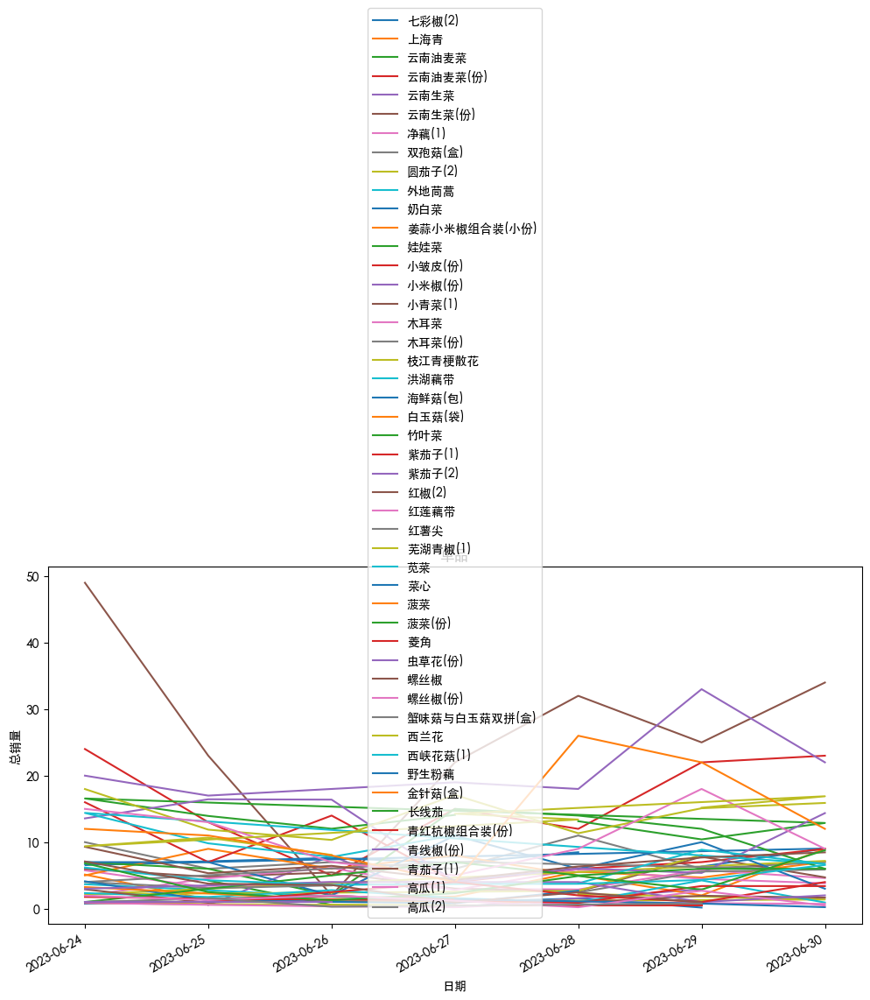

In [29]:

# 创建一个图形和子图
plt.figure(figsize=(12, 6))
ax = plt.gca()

# 循环遍历每个单品编码，分别绘制折线图
for item_code, data in filtered_sales.groupby('单品名称'):
    plt.plot(data['销售日期'], data['总销量'], label=item_code)

# 设置标题和标签
plt.title('单品')
plt.xlabel('日期')
plt.ylabel('总销量')

# 添加图例
plt.legend()

# 自动调整日期标签的格式
plt.gcf().autofmt_xdate()
# 显示图形
plt.show()

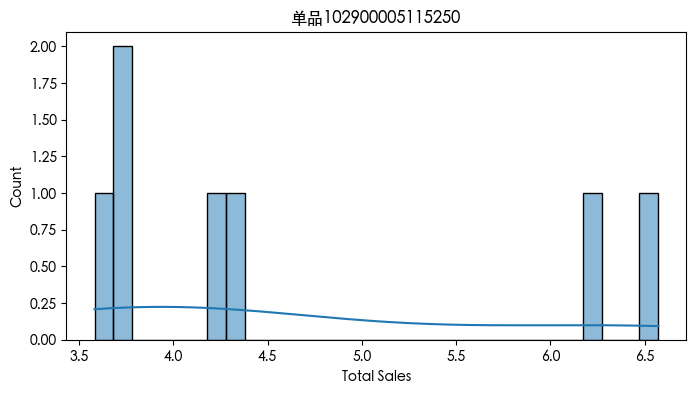

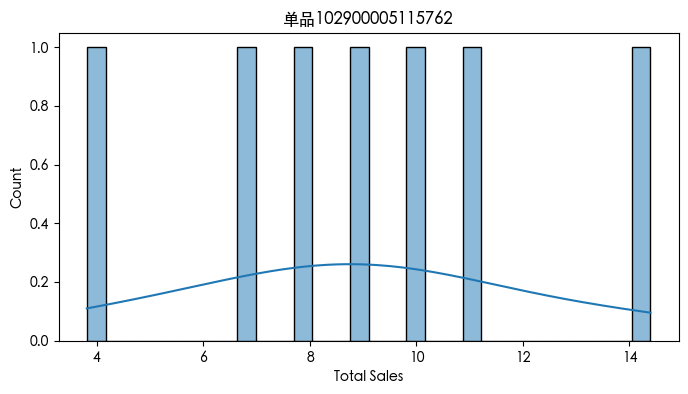

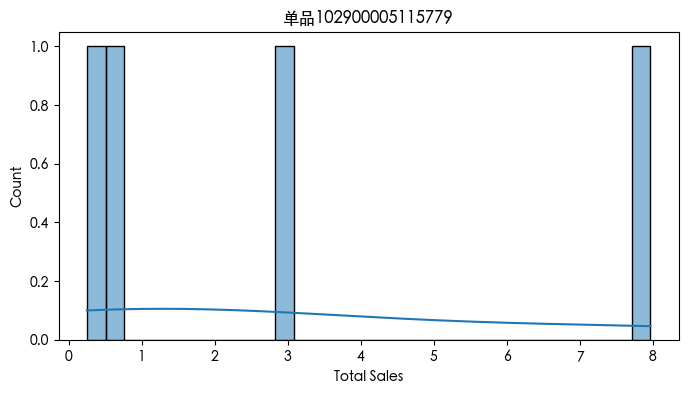

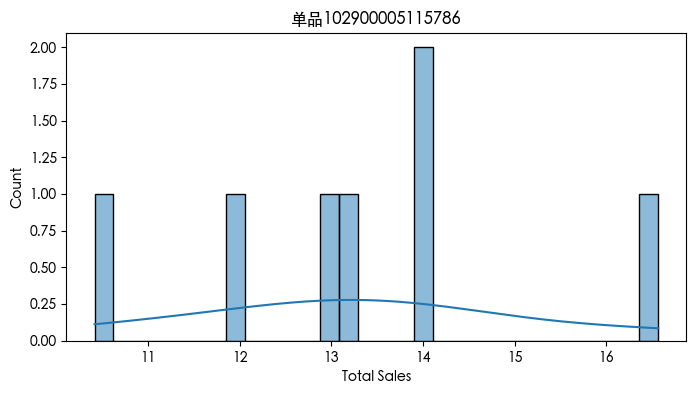

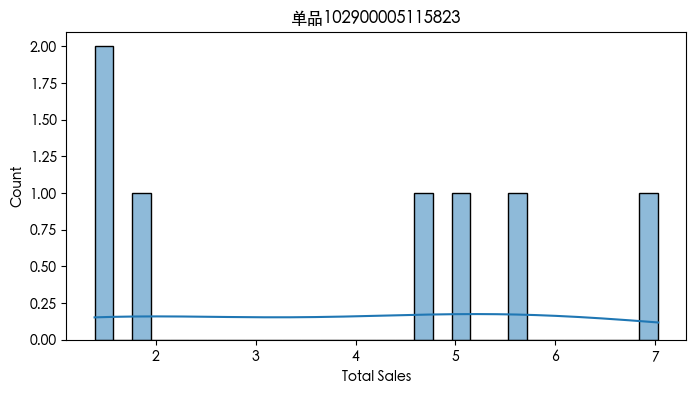

...

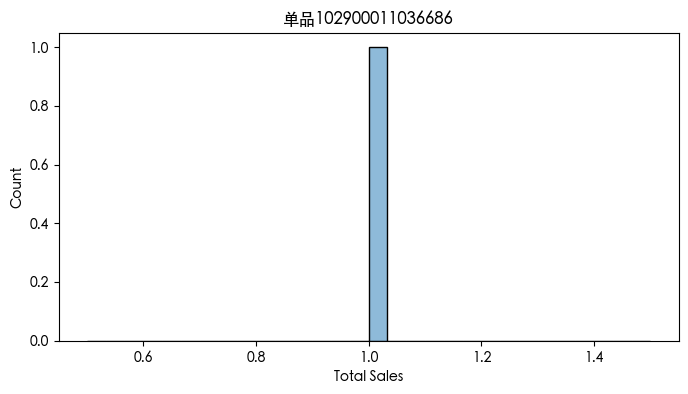

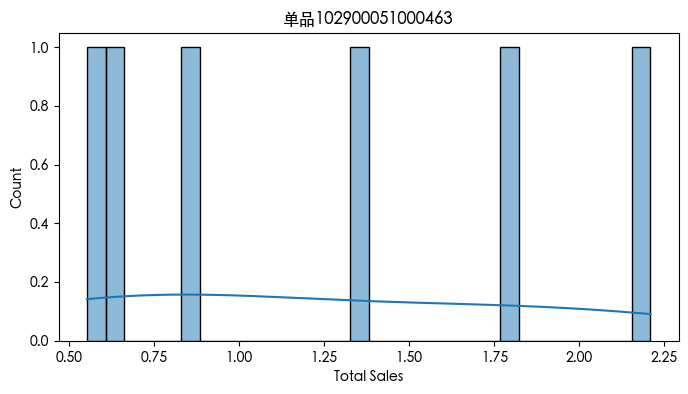

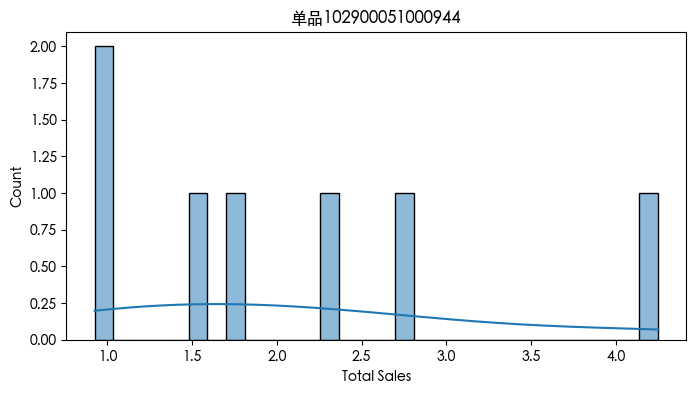

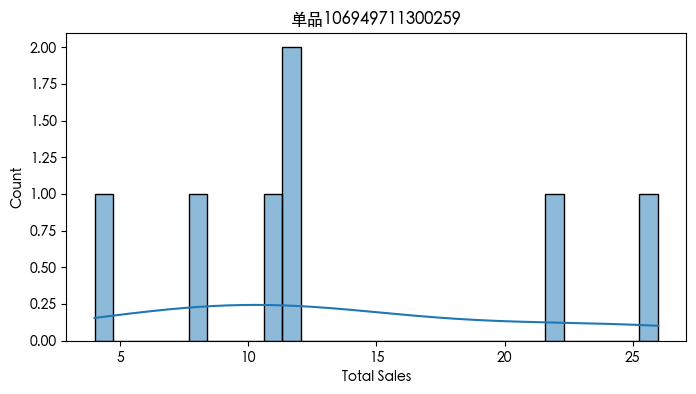

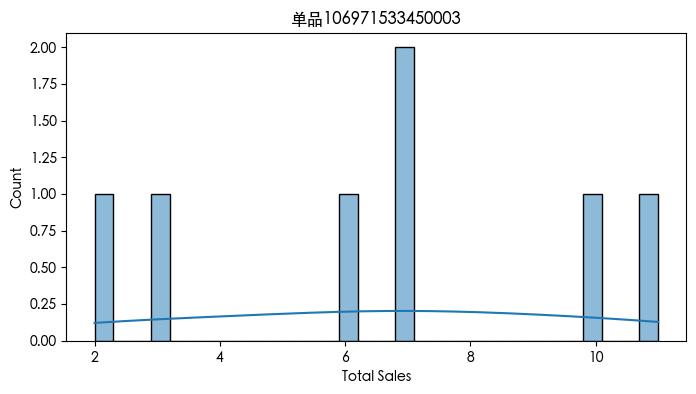

In [35]:

# 获取唯一的单品编码列表
unique_items = filtered_sales['单品编码'].unique()

# 遍历每个单品编码并绘制直方图
for item_code in unique_items:
    # 筛选特定单品编码的数据
    item_data = filtered_sales[filtered_sales['单品编码'] == item_code]
    
    # 创建一个图形和子图
    plt.figure(figsize=(8, 4))
    
    # 绘制总销量的直方图
    sns.histplot(data=item_data, x='总销量', bins=30, kde=True)
    plt.title(f"单品{item_code}")
    plt.xlabel('Total Sales')
    
    # 显示图形
    plt.show()

In [39]:
inver = filtered_sales.groupby('单品编码')['批发价格'].mean()
outver = filtered_sales.groupby('单品编码')['销售价格'].mean()
val = filtered_sales.groupby('单品编码')['总销量'].mean()
display(filtered_sales['单品名称'])

TypeError: 'Index' object is not callable

In [ ]:
costs = sale.groupby('单品编码')['批发价格'].sum().reset_index()
costs['平均批发价格'] = sale.groupby('单品编码')['批发价格'].mean().values
profit = sale.groupby('单品编码')['销售价格'].sum().reset_index()
profit['平均售价'] = sale.groupby('单品编码')['销售价格'].mean().values
profit['单品平均日收益'] = profit['平均售价'] - costs['平均批发价格']
profit = profit.merge(data[['单品编码', '单品名称']].drop_duplicates(), on='单品编码', how='left')

display(costs)
profit

,单品编码,批发价格,平均批发价格
0,102900005115168,235.30,2.306863
1,102900005115199,3973.02,26.311391
2,102900005115250,4104.60,13.820202
3,102900005115625,146.34,3.113617
4,102900005115748,243.47,2.646413
...,...,...,...
239,106971533455008,474.23,1.992563
240,106971563780002,11.74,2.935000
241,106972776821582,101.03,3.259032
242,106973223300667,5.00,5.000000


,单品编码,销售价格,平均售价,单品平均日收益,单品名称
0,102900005115168,414.8,4.066667,1.759804,牛首生菜
1,102900005115199,5750.1,38.080132,11.768742,四川红香椿
2,102900005115250,6448.0,21.710438,7.890236,西峡花菇(1)
3,102900005115625,221.8,4.719149,1.605532,本地小毛白菜
4,102900005115748,408.0,4.434783,1.788370,白菜苔
...,...,...,...,...,...
239,106971533455008,889.8,3.738655,1.746092,海鲜菇(袋)(3)
240,106971563780002,19.6,4.900000,1.965000,鲜粽叶(袋)(2)
241,106972776821582,210.8,6.800000,3.540968,鲜粽叶(袋)(3)
242,106973223300667,12.9,12.900000,7.900000,虫草花(盒)(2)


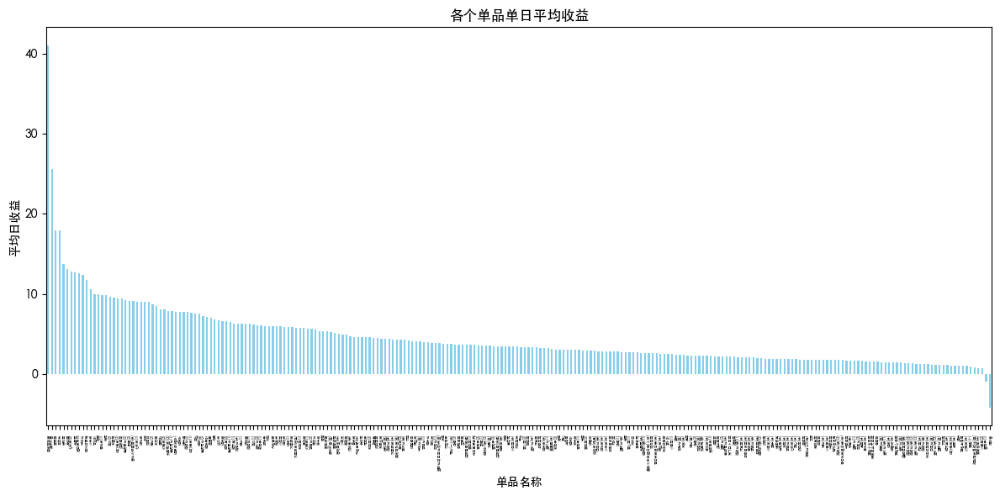

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
avg_daily_profit = profit.groupby('单品名称')['单品平均日收益'].mean()

avg_daily_profit = avg_daily_profit.sort_values(ascending=False)
# 创建柱状图
plt.figure(figsize=(12, 6))
avg_daily_profit.plot(kind='bar', color='skyblue')
plt.title('各个单品单日平均收益')
plt.xlabel('单品名称')
plt.ylabel('平均日收益')
plt.xticks(fontsize= 3,rotation=90)  
plt.tight_layout()
plt.show()


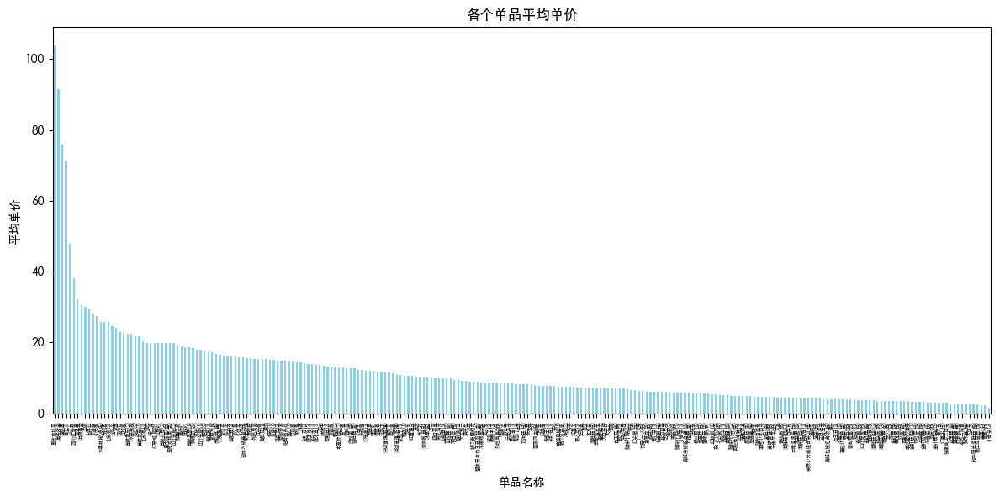

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# 假设 profit 数据框包含了单品名称和平均售价列
avg_price = profit.groupby('单品名称')['平均售价'].mean()

# 对数据进行排序（可选）
avg_price = avg_price.sort_values(ascending=False)

# 创建柱状图
plt.figure(figsize=(12, 6))
avg_price.plot(kind='bar', color='skyblue')
plt.title('各个单品平均单价')
plt.xlabel('单品名称')
plt.ylabel('平均单价')
plt.xticks(fontsize =4, rotation=90)  # 可选，使 x 轴标签垂直显示
plt.tight_layout()
plt.show()


In [ ]:
total_sales = sale.groupby('单品编码')['总销量'].sum().reset_index()

# 筛选掉无交易的单品
filtered_sale = sale[sale['单品编码'].isin(total_sales['单品编码'])]

# 打印或保存结果
display(filtered_sale)

,单品编码,销售单价(元/千克),销售日期,总销量,批发价格,销售价格,分类名称
0,102900005115168,1.4,2021-05-06,6.231,0.83,1.4,花叶类
1,102900005115168,1.4,2021-05-07,7.029,0.90,1.4,花叶类
2,102900005115168,1.6,2021-05-05,11.395,0.88,1.6,花叶类
3,102900005115168,2.0,2021-05-08,6.771,1.08,2.0,花叶类
4,102900005115168,2.0,2021-05-09,11.368,1.12,2.0,花叶类
...,...,...,...,...,...,...,...
46175,106973990980123,2.5,2022-07-25,7.000,1.87,2.5,食用菌
46176,106973990980123,2.5,2022-07-26,2.000,1.90,2.5,食用菌
46177,106973990980123,2.5,2022-07-28,6.000,2.02,2.5,食用菌
46178,106973990980123,2.5,2022-07-29,2.000,2.03,2.5,食用菌


In [ ]:
import numpy as np
import pandas as pd
from scipy.optimize import minimize
sale['销售日期'] = pd.to_datetime(sale['销售日期'])
sales_data = sale.pivot_table(index='单品编码', columns='销售日期', values='总销量', aggfunc='sum', fill_value=0)

def debu():
    valid_combinations = sale.groupby(['单品编码', '销售日期'])['总销量'].agg(['sum']).reset_index()
    missing_combinations = valid_combinations[valid_combinations['sum'].isnull()]
    display(valid_combinations,missing_combinations) 
debu()
# 使用线性插值填充缺失值
# sales_data = sales_data.interpolate(method='linear', axis=1)
# sales_data = sales_data.interpolate(method='linear', axis=0)



num_items = len(data['单品编码'].unique())
min_display_quantity = np.array([2.5] * num_items)

# 定义 total_items_min 和 total_items_max
total_items_min = 27
total_items_max = 33

# 获取单品数量和时间步数
num_items, num_time_steps = sales_data.shape
display(sale)
display(sales_data,num_items,min_display_quantity,num_items,num_time_steps)


,单品编码,销售日期,sum
0,102900005115168,2020-10-30,6.427
1,102900005115168,2020-10-31,7.251
2,102900005115168,2020-11-01,13.126
3,102900005115168,2020-12-04,5.972
4,102900005115168,2021-03-03,11.568
...,...,...,...
46075,106973990980123,2022-07-23,1.000
46076,106973990980123,2022-07-25,7.000
46077,106973990980123,2022-07-26,2.000
46078,106973990980123,2022-07-28,6.000


,单品编码,销售日期,sum


,单品编码,销售单价(元/千克),销售日期,总销量,批发价格,销售价格,分类名称
0,102900005115168,1.4,2021-05-06,6.231,0.83,1.4,花叶类
1,102900005115168,1.4,2021-05-07,7.029,0.90,1.4,花叶类
2,102900005115168,1.6,2021-05-05,11.395,0.88,1.6,花叶类
3,102900005115168,2.0,2021-05-08,6.771,1.08,2.0,花叶类
4,102900005115168,2.0,2021-05-09,11.368,1.12,2.0,花叶类
...,...,...,...,...,...,...,...
46175,106973990980123,2.5,2022-07-25,7.000,1.87,2.5,食用菌
46176,106973990980123,2.5,2022-07-26,2.000,1.90,2.5,食用菌
46177,106973990980123,2.5,2022-07-28,6.000,2.02,2.5,食用菌
46178,106973990980123,2.5,2022-07-29,2.000,2.03,2.5,食用菌


销售日期,2020-07-01,2020-07-02,2020-07-03,2020-07-04,2020-07-05,2020-07-06,2020-07-07,2020-07-08,2020-07-09,2020-07-10,...,2023-06-21,2023-06-22,2023-06-23,2023-06-24,2023-06-25,2023-06-26,2023-06-27,2023-06-28,2023-06-29,2023-06-30
单品编码,,,,,,,,,,,,,,,,,,,,,
102900005115168,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000,0.000,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000
102900005115199,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000,0.000,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000
102900005115250,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.364,11.476,5.417,6.18,4.271,3.582,3.708,3.742,4.314,6.572
102900005115625,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000,0.000,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000
102900005115748,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000,0.000,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106971533455008,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000,0.000,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000
106971563780002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000,0.000,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000
106972776821582,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000,0.000,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000


244

array([2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5,
       2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5,
       2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5,
       2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5,
       2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5,
       2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5,
       2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5,
       2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5,
       2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5,
       2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5,
       2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5,
       2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5,
       2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5,
       2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.

244

1085

In [ ]:
# 定义目标函数，即总成本
def objective(x, costs):
    total_cost = np.sum(costs * x)
    return total_cost

# 定义单品数量约束
def item_count_constraint(x):
    total_items = np.sum(x)
    return total_items - total_items_min

# 定义单品订购量约束
def item_quantity_constraint(x, min_display_quantity):
    return min_display_quantity - x


costs = costs['平均批发价格'].values
num_items = len(costs)
# 初始化补货量变量
x0 = np.zeros(num_items)

# 设置单品数量约束
item_count_cons = {'type': 'ineq', 'fun': item_count_constraint}

# 设置单品订购量约束
item_quantity_cons = [{'type': 'ineq', 'fun': item_quantity_constraint, 'args': (
    min_display_quantity[i],)} for i in range(num_items)]

# 设置边界，补货量必须为非负数
bounds = [(0, None)] * num_items

# 求解优化问题
result = minimize(objective, x0, args=(costs,), constraints=[item_count_cons] + item_quantity_cons, bounds=bounds, method='SLSQP')

# 输出最优补货计划
optimal_replenishment = result.x
total_items_optimal = np.sum(optimal_replenishment)



In [ ]:
temp = optimal_replenishment * 6e9
display(optimal_replenishment)
optimal_replenishment_series = pd.Series(temp, name='最优补货量(千克)')
unique_sorted_sku = sorted(sale['单品编码'].unique())
best_in = pd.DataFrame({
    '单品编码': unique_sorted_sku,
    '单品名称': [data[data['单品编码'] == code]['单品名称'].values[0] for code in unique_sorted_sku],
    '最优补货量(千克)': temp
})

display(best_in)
best_in['单品编码'] = best_in['单品编码'].astype(str)
best_in.to_excel('output.xlsx',index=False)

print("最优可售单品总数：", int(total_items_optimal))


array([6.57555690e-11, 7.24024555e-10, 3.80243316e-10, 8.56071800e-11,
       7.30739880e-11, 1.10459444e-10, 1.40100450e-10, 1.38878437e-10,
       2.71806476e-10, 1.26018796e-10, 1.19832532e-10, 8.32105748e-11,
       6.74306623e-11, 1.17344172e-10, 2.70913069e-10, 1.27487896e-10,
       1.09175365e-10, 2.23670139e+00, 2.79981534e-10, 1.19113793e-10,
       2.41943541e-10, 1.85592065e-10, 2.52201668e-10, 1.55412445e-10,
       1.47009148e-10, 3.33318115e-10, 1.23705696e-10, 1.69086325e-10,
       1.88450462e-10, 9.11504052e-11, 6.56782629e-11, 1.29801732e-10,
       1.59996488e-10, 2.09194153e-10, 2.45810567e-10, 3.75985710e-10,
       2.02077742e-10, 3.13371502e-10, 2.50000000e+00, 2.49706765e-10,
       1.78849201e-10, 2.31666114e-10, 9.76929593e-11, 3.85367229e-10,
       1.23255635e-10, 2.48005223e-10, 1.38355361e-10, 1.25177497e-10,
       1.40576435e-10, 1.78011655e-10, 4.60310702e-10, 1.64180997e-10,
       1.46656886e-09, 1.32514107e-10, 2.14293780e-10, 1.00935238e-10,
      

,单品编码,单品名称,最优补货量(千克)
0,102900005115168,牛首生菜,0.394533
1,102900005115199,四川红香椿,4.344147
2,102900005115250,西峡花菇(1),2.281460
3,102900005115625,本地小毛白菜,0.513643
4,102900005115748,白菜苔,0.438444
...,...,...,...
239,106971533455008,海鲜菇(袋)(3),0.917554
240,106971563780002,鲜粽叶(袋)(2),0.484551
241,106972776821582,鲜粽叶(袋)(3),0.538023
242,106973223300667,虫草花(盒)(2),0.825846


最优可售单品总数： 27
